In [1]:
import pandas as pd
import matplotlib.pyplot as plt
from tqdm import trange
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import os
%matplotlib inline

from collections import OrderedDict

import matplotlib as mpl
from RTP_simul import RTP_lab

In [2]:
direc ='./data/f_density/210701/'
v_density = pd.read_pickle(direc+'16000_v.pkl')
v_density = v_density.explode('v_list',)
v_density



,f,v_list
0,0.02,-0.06018
0,0.02,0.0766668
0,0.02,-0.456707
0,0.02,-0.197233
0,0.02,-0.323069
...,...,...
999,0.28,12.3645
999,0.28,-9.41915
999,0.28,-11.9783
999,0.28,-10.9401


In [3]:
dS_density = pd.read_pickle(direc+'16000_dS.pkl')
dS_density = dS_density.explode('dSt_list')
dS_density

,f,dSt_list
0,0.02,0.224978
0,0.02,0.224983
0,0.02,0.225028
0,0.02,0.224994
0,0.02,0.22497
...,...,...
999,0.28,0.223592
999,0.28,0.22292
999,0.28,0.223832
999,0.28,0.223088


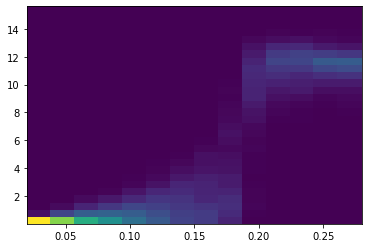

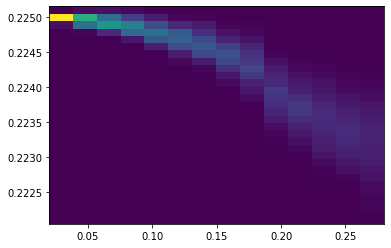

In [4]:
plt.hist2d(v_density['f'],np.abs(v_density['v_list']),bins = (14,30))
plt.show()
plt.hist2d(dS_density['f'],dS_density['dSt_list'],bins = (14,30))
plt.show()

0
0.7


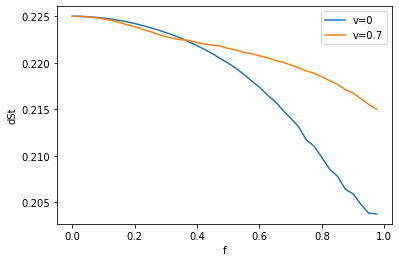

In [7]:
direc = './data/EP_scan/210701/'
load1 = np.load(direc+'1.npz')
f_axis_1 = load1['f_axis']
dS1_1 = load1['dS1']
dS2_1 = load1['dS2']
print(load1['vu_fix'])

load2 = np.load(direc+'2.npz')
f_axis_2 = load2['f_axis']
dS1_2 = load2['dS1']
dS2_2 = load2['dS2']
print(load2['vu_fix'])


plt.plot(f_axis_1, dS1_1+dS2_1,label='v=0')
plt.plot(f_axis_2, dS1_2+dS2_2,label='v=0.7')
plt.legend()
plt.xlabel('f')
plt.ylabel('dSt')
plt.show()
# plt.plot(f_axis_1, dS1_1+dS2_1-dS1_2-dS2_2)
# plt.xlabel('f')
# plt.ylabel('delta dSt')
# plt.show()

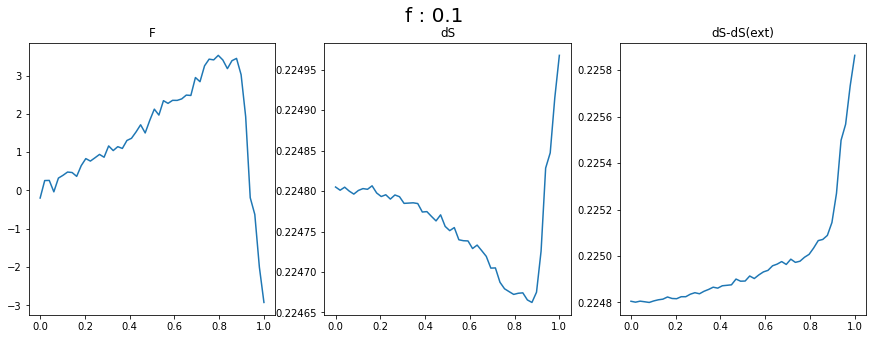

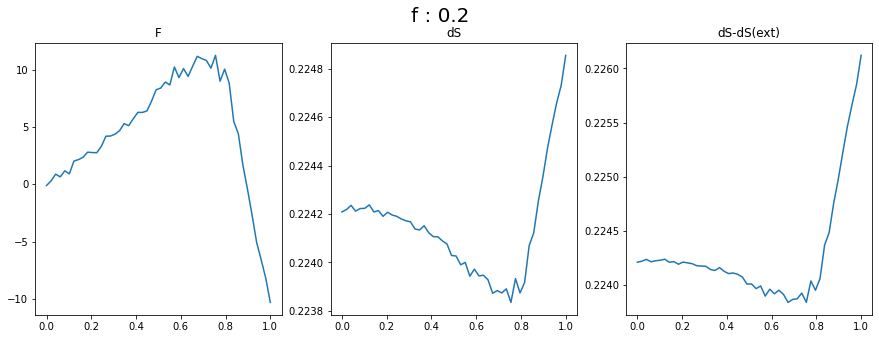

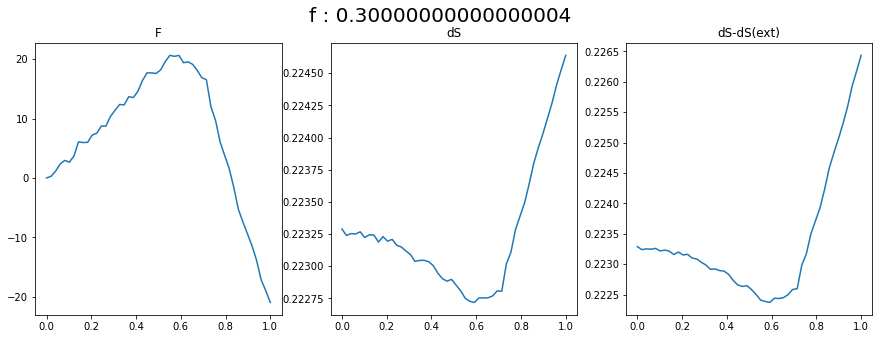

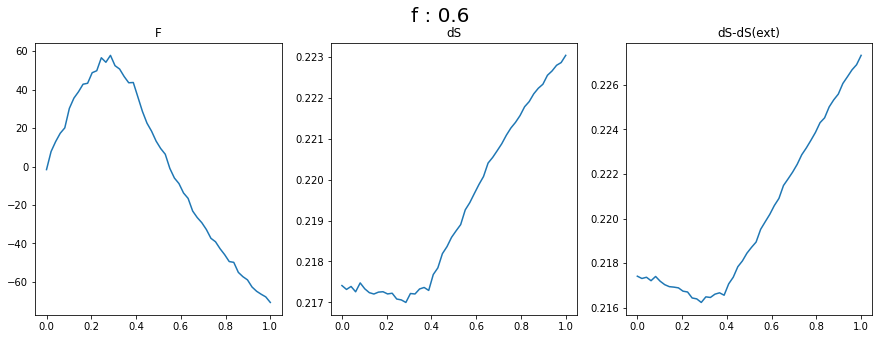

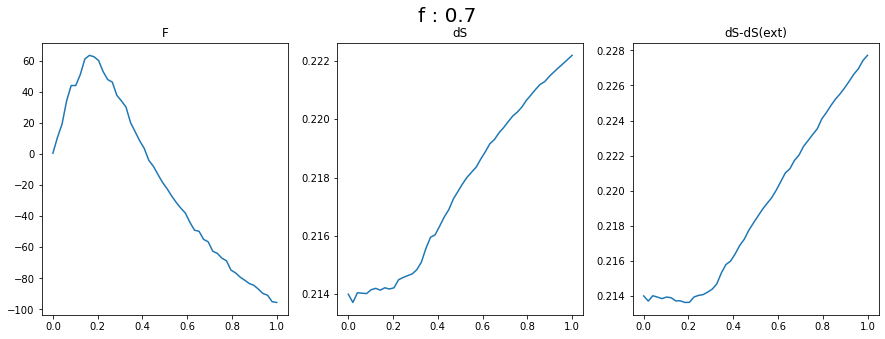

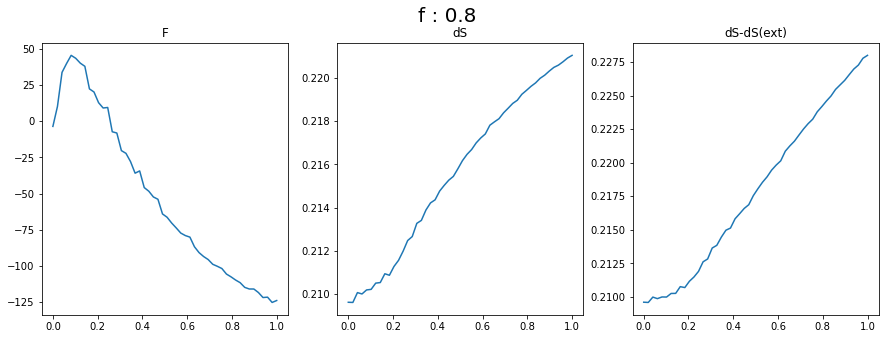

FileNotFoundError: [Errno 2] No such file or directory: '/home/siksik/RTP_git/data/EP_V_scan/210706/1.npz'

In [20]:
path_dir = os.getcwd()+'/data/EP_V_scan/210706/'
Fs=1000
u=15
rho = 1
L=300

file_list = os.listdir(path_dir)
f_list = []

for file in file_list:
    f_list.append(file[:-4])

f_list = sorted(f_list)
    
for f in f_list:
    load = np.load(path_dir+str(f)+'.npz')
    

#     f = load['f']
    N_ptcl = load['N_ptcl']
    vu_axis = load['vu_axis']
    F_v = load['F_v']
    dS1_v =load['dS1_v']
    dS2_v = load['dS2_v']
    
    
    muw = 1*rho*L/N_ptcl
    
    
#     fig1 = plt.figure(figsize=(10,5))
#     fig1.suptitle('f : '+str(f),fontsize='20')
#     ax1 = fig1.add_subplot(121,title='dS(ext)')
#     ax1.plot(vu_axis,(dS1_v+dS2_v),label='dS')
#     ax1.plot(vu_axis,(F_v*N_ptcl/L-vu_axis*u/muw)*vu_axis*u/Fs,label='dS(ext)')
#     ax2 = fig1.add_subplot(122,title='F_ext')
#     ax2.plot(vu_axis,(F_v*N_ptcl/L-vu_axis*u/muw))
#     plt.show()
    fig2 = plt.figure(figsize=(15,5))
    fig2.suptitle('f : '+str(f),fontsize='20')
    ax3 = fig2.add_subplot(131,title='F')
    ax3.plot(vu_axis,F_v)
    ax4 = fig2.add_subplot(132,title='dS')
    ax4.plot(vu_axis,(dS1_v+dS2_v))
    ax5 = fig2.add_subplot(133,title='dS-dS(ext)')
    ax5.plot(vu_axis,(dS1_v+dS2_v)-(F_v*N_ptcl/L-vu_axis*u/muw)*vu_axis*u/(N_ptcl*Fs))
    plt.show()
    
    


  0%|          | 0/40 [00:00<?, ?it/s]

RTP model initialized


100%|██████████| 40/40 [31:37<00:00, 47.45s/it]


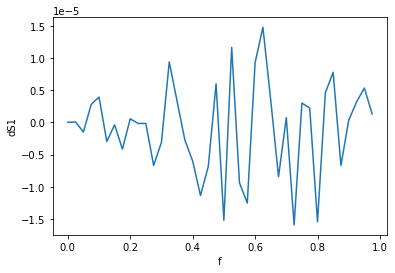

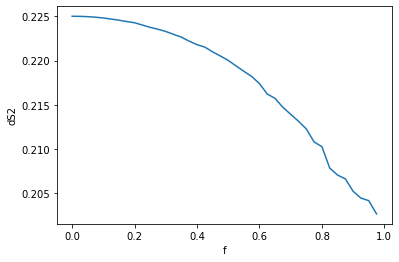

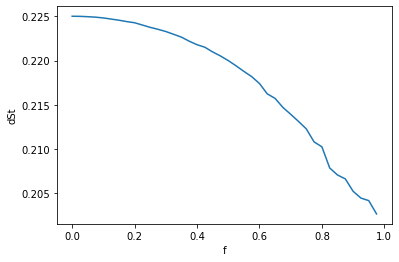

In [2]:
N=2000
vu_fix=0
Fs=1000
R1 = RTP_lab(N_time=Fs,N_ptcl=N, model=2)

(f_axis_1,dS1_1,dS2_1) = R1.compute_EP_f(n_batch = 40, wait=100, duration=50, vu=vu_fix)

In [ ]:
N=2000
vu_fix=0.7
Fs=1000
R1 = RTP_lab(N_time=Fs,N_ptcl=N, model=2)

(f_axis_2,dS1_2,dS2_2) = R1.compute_EP_f(n_batch = 40, wait=100, duration=50, vu=vu_fix)

  0%|          | 0/40 [00:00<?, ?it/s]

RTP model initialized


 38%|███▊      | 15/40 [11:56<20:31, 49.27s/it]

  0%|          | 51/50000 [00:00<01:39, 502.04it/s]

RTP model initialized


100%|██████████| 20000/20000 [01:34<00:00, 212.64it/s]


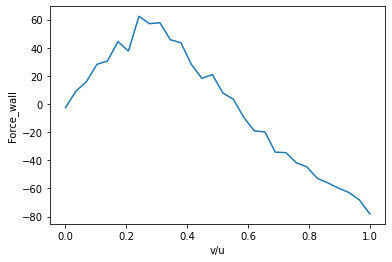

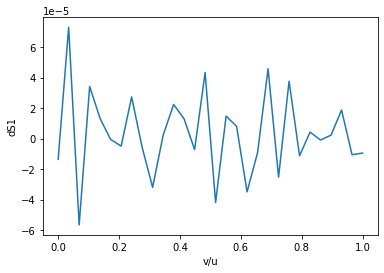

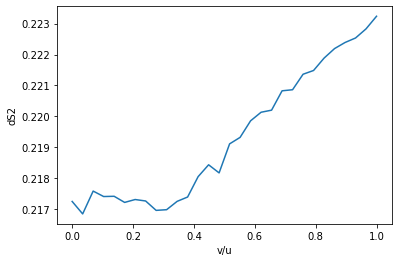

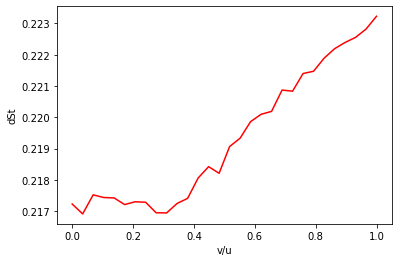

In [2]:
N=2000
f=0.6
Fs=1000
R1 = RTP_lab(N_time=Fs,N_ptcl=N, model=2)

(vu_axis, F_v,dS1_v,dS2_v)= R1.compute_EP_v(n_batch = 30, wait=50, duration=20, muFu=f)
plt.plot(vu_axis,dS1_v+dS2_v-F_v*vu_axis)
plt.show()

In [ ]:
N=2000
f=0.1
Fs=1000
rho = 1
L=300
muw = 1*rho*L/N
u=15


R1 = RTP_lab(N_time=Fs,N_ptcl=N, model=2)


(vu_axis, F_v,dS1_v,dS2_v, F_v)= R1.compute_EP_v(n_batch = 30, wait=50, duration=20, muFu=f)
plt.plot(vu_axis,(dS1_v+dS2_v)-(F_v-vu_axis*u/muw)*vu_axis*u/(L*Fs))
plt.show()

In [ ]:
N=2000
f=0.15
Fs=1000
rho = 1
L=300
muw = 1*rho*L/N
u=15


R1 = RTP_lab(N_time=Fs,N_ptcl=N, model=2)


(vu_axis, F_v,dS1_v,dS2_v, F_v)= R1.compute_EP_v(n_batch = 30, wait=50, duration=20, muFu=f)
plt.plot(vu_axis,(dS1_v+dS2_v)-(F_v-vu_axis*u/muw)*vu_axis*u/(L*Fs))
plt.show()

In [ ]:
N=2000
f=0.17
Fs=1000
rho = 1
L=300
muw = 1*rho*L/N
u=15


R1 = RTP_lab(N_time=Fs,N_ptcl=N, model=2)


(vu_axis, F_v,dS1_v,dS2_v, F_v)= R1.compute_EP_v(n_batch = 30, wait=50, duration=20, muFu=f)
plt.plot(vu_axis,(dS1_v+dS2_v)-(F_v-vu_axis*u/muw)*vu_axis*u/(L*Fs))
plt.show()

In [ ]:
N=2000
f=0.18
Fs=1000
rho = 1
L=300
muw = 1*rho*L/N
u=15


R1 = RTP_lab(N_time=Fs,N_ptcl=N, model=2)


(vu_axis, F_v,dS1_v,dS2_v, F_v)= R1.compute_EP_v(n_batch = 30, wait=50, duration=20, muFu=f)
plt.plot(vu_axis,(dS1_v+dS2_v)-(F_v-vu_axis*u/muw)*vu_axis*u/(L*Fs))
plt.show()

  0%|          | 49/50000 [00:00<01:43, 484.73it/s]

RTP model initialized


 39%|███▉      | 19716/50000 [00:43<01:07, 445.60it/s]

  0%|          | 49/50000 [00:00<01:43, 483.35it/s]

RTP model initialized


100%|██████████| 20000/20000 [01:34<00:00, 210.63it/s]


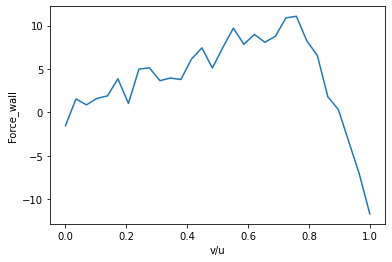

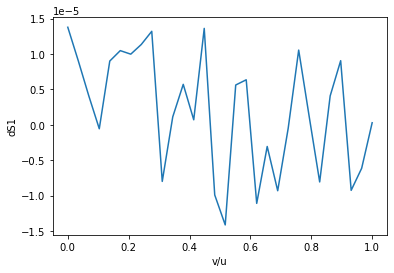

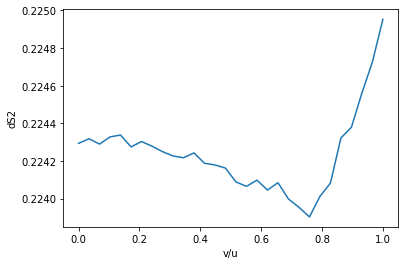

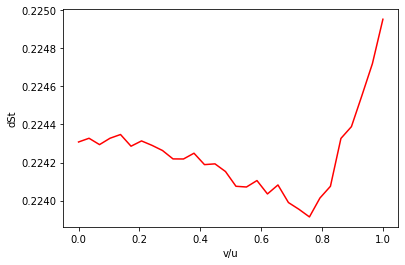

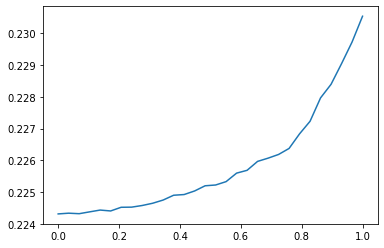

In [13]:
N=2000
f=0.19
Fs=1000
rho = 1
L=300
muw = 1*rho*L/N
u=15


R1 = RTP_lab(N_time=Fs,N_ptcl=N, model=2)


(vu_axis, F_v,dS1_v,dS2_v, F_v)= R1.compute_EP_v(n_batch = 30, wait=50, duration=20, muFu=f)
plt.plot(vu_axis,(dS1_v+dS2_v)-(F_v-vu_axis*u/muw)*vu_axis*u/(L*Fs))
plt.show()

  0%|          | 47/50000 [00:00<01:47, 465.39it/s]

RTP model initialized


100%|██████████| 20000/20000 [01:35<00:00, 208.90it/s]


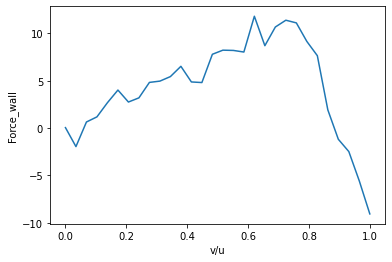

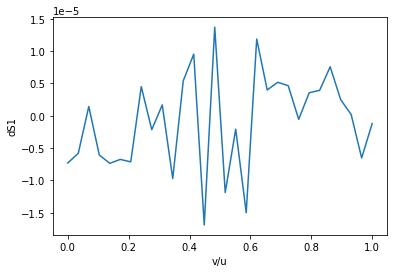

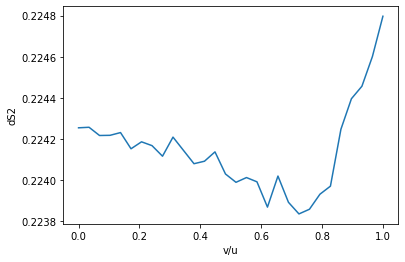

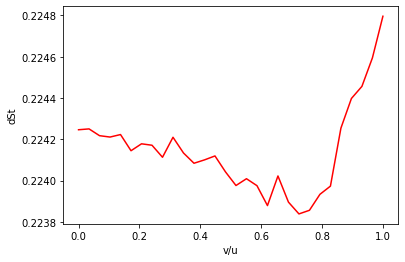

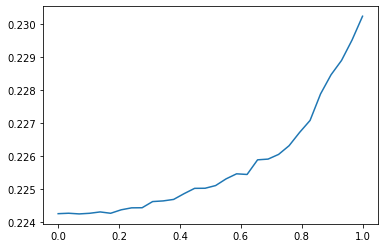

In [12]:
N=2000
f=0.2
Fs=1000
rho = 1
L=300
muw = 1*rho*L/N
u=15


R1 = RTP_lab(N_time=Fs,N_ptcl=N, model=2)


(vu_axis, F_v,dS1_v,dS2_v, F_v)= R1.compute_EP_v(n_batch = 30, wait=50, duration=20, muFu=f)
plt.plot(vu_axis,(dS1_v+dS2_v)-(F_v-vu_axis*u/muw)*vu_axis*u/(L*Fs))
plt.show()

  0%|          | 52/50000 [00:00<01:36, 515.61it/s]

RTP model initialized


100%|██████████| 20000/20000 [01:33<00:00, 212.85it/s]


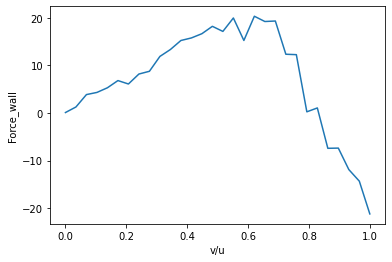

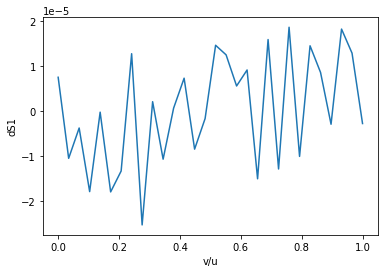

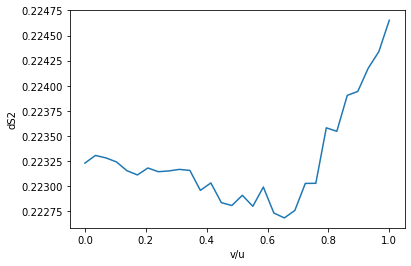

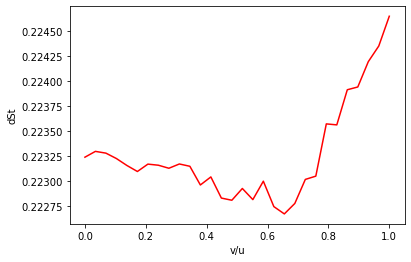

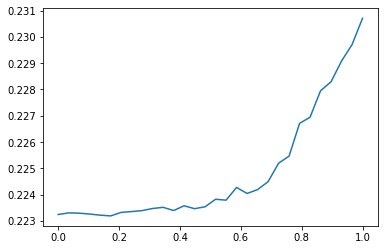

In [11]:
N=2000
f=0.3
Fs=1000
rho = 1
L=300
muw = 1*rho*L/N
u=15


R1 = RTP_lab(N_time=Fs,N_ptcl=N, model=2)


(vu_axis, F_v,dS1_v,dS2_v, F_v)= R1.compute_EP_v(n_batch = 30, wait=50, duration=20, muFu=f)
plt.plot(vu_axis,(dS1_v+dS2_v)-(F_v-vu_axis*u/muw)*vu_axis*u/(L*Fs))
plt.show()

In [ ]:
N=2000
f=0.4
Fs=1000
rho = 1
L=300
muw = 1*rho*L/N
u=15


R1 = RTP_lab(N_time=Fs,N_ptcl=N, model=2)


(vu_axis, F_v,dS1_v,dS2_v, F_v)= R1.compute_EP_v(n_batch = 30, wait=50, duration=20, muFu=f)
plt.plot(vu_axis,(dS1_v+dS2_v)-(F_v-vu_axis*u/muw)*vu_axis*u/(L*Fs))
plt.show()

  0%|          | 49/50000 [00:00<01:42, 486.29it/s]

RTP model initialized


100%|██████████| 20000/20000 [01:36<00:00, 208.25it/s]


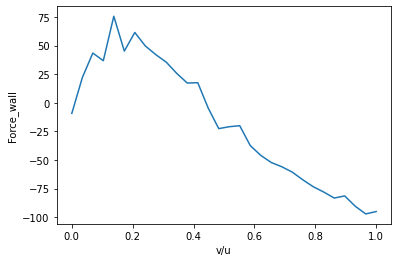

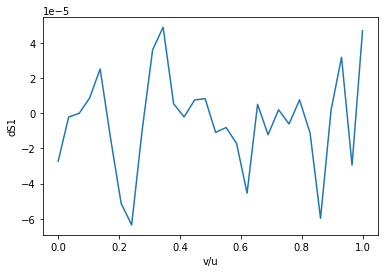

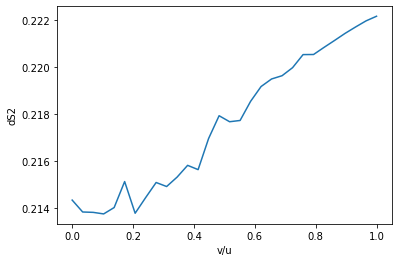

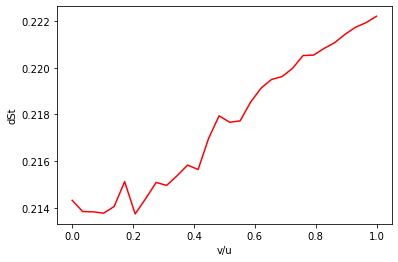

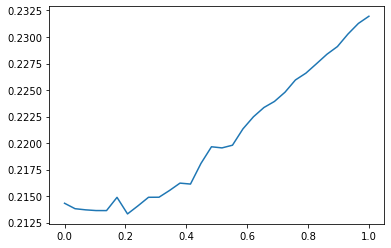

In [10]:
N=2000
f=0.7
Fs=1000
rho = 1
L=300
muw = 1*rho*L/N
u=15


R1 = RTP_lab(N_time=Fs,N_ptcl=N, model=2)


(vu_axis, F_v,dS1_v,dS2_v, F_v)= R1.compute_EP_v(n_batch = 30, wait=50, duration=20, muFu=f)
plt.plot(vu_axis,(dS1_v+dS2_v)-(F_v-vu_axis*u/muw)*vu_axis*u/(L*Fs))
plt.show()

  0%|          | 50/50000 [00:00<01:41, 493.60it/s]

RTP model initialized


100%|██████████| 20000/20000 [01:36<00:00, 206.76it/s]


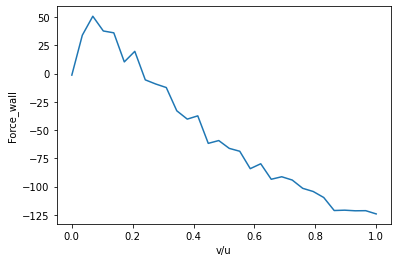

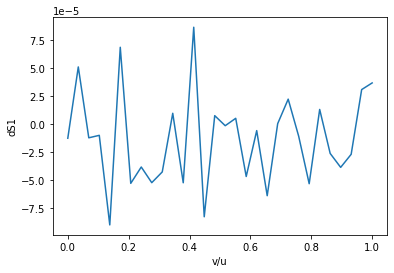

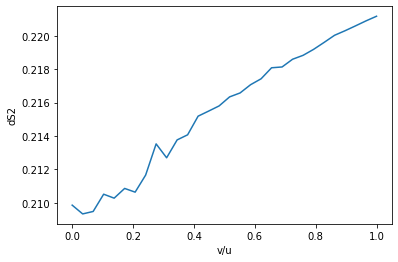

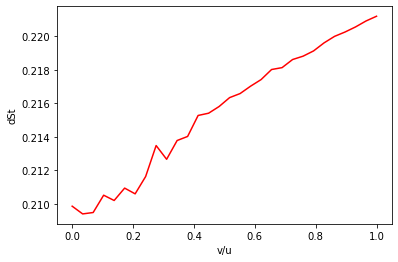

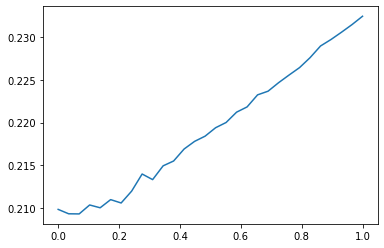

In [9]:
N=2000
f=0.8
Fs=1000
rho = 1
L=300
muw = 1*rho*L/N
u=15


R1 = RTP_lab(N_time=Fs,N_ptcl=N, model=2)


(vu_axis, F_v,dS1_v,dS2_v, F_v)= R1.compute_EP_v(n_batch = 30, wait=50, duration=20, muFu=f)
plt.plot(vu_axis,(dS1_v+dS2_v)-(F_v-vu_axis*u/muw)*vu_axis*u/(L*Fs))
plt.show()

  0%|          | 50/50000 [00:00<01:40, 498.13it/s]

RTP model initialized


100%|██████████| 20000/20000 [01:38<00:00, 203.77it/s]


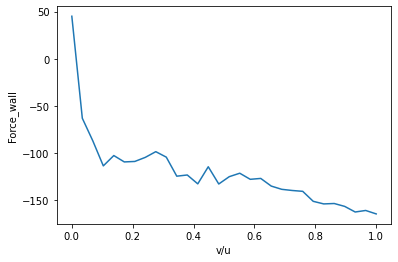

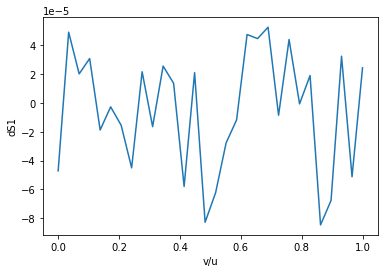

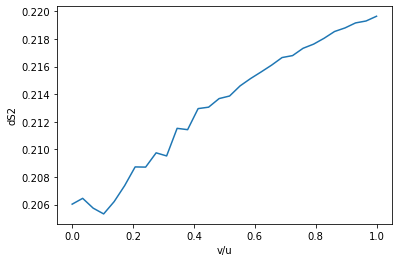

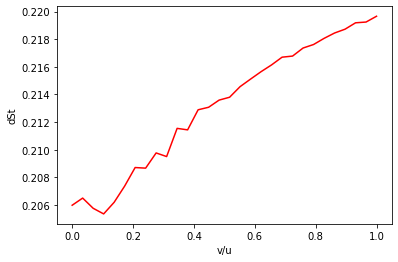

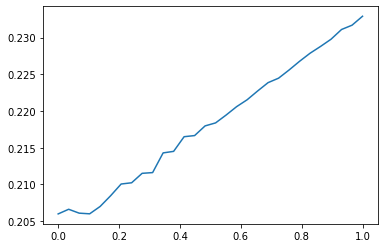

In [8]:
N=2000
f=0.9
Fs=1000
rho = 1
L=300
muw = 1*rho*L/N
u=15


R1 = RTP_lab(N_time=Fs,N_ptcl=N, model=2)


(vu_axis, F_v,dS1_v,dS2_v, F_v)= R1.compute_EP_v(n_batch = 30, wait=50, duration=20, muFu=f)
plt.plot(vu_axis,(dS1_v+dS2_v)-(F_v-vu_axis*u/muw)*vu_axis*u/(L*Fs))
plt.show()

  0%|          | 23/50000 [00:00<03:41, 225.43it/s]

RTP model initialized


100%|██████████| 20000/20000 [03:01<00:00, 110.19it/s]


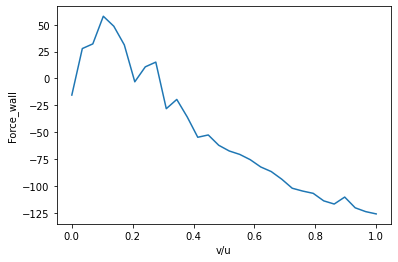

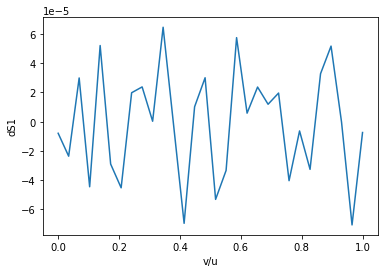

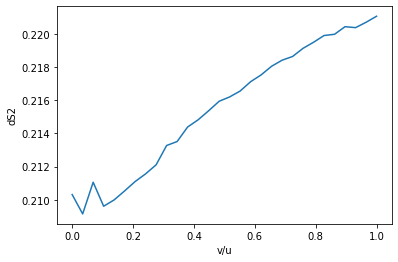

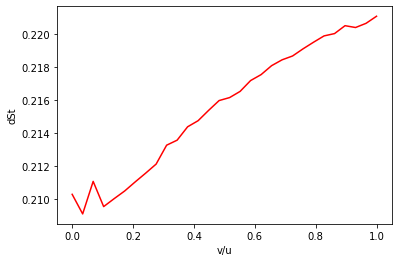

(array([0.        , 0.05172414, 0.10344828, 0.15517241, 0.20689655,
        0.25862069, 0.31034483, 0.36206897, 0.4137931 , 0.46551724,
        0.51724138, 0.56896552, 0.62068966, 0.67241379, 0.72413793,
        0.77586207, 0.82758621, 0.87931034, 0.93103448, 0.98275862,
        1.03448276, 1.0862069 , 1.13793103, 1.18965517, 1.24137931,
        1.29310345, 1.34482759, 1.39655172, 1.44827586, 1.5       ]),
 array([-7.92904793e-06, -2.36203614e-05,  2.99523967e-05, -4.45666623e-05,
         5.21658595e-05, -2.89917668e-05, -4.52791429e-05,  1.98336685e-05,
         2.38168767e-05,  3.04689414e-07,  6.46871397e-05, -2.44508977e-06,
        -6.96052719e-05,  1.02309333e-05,  3.00951233e-05, -5.32012467e-05,
        -3.33838413e-05,  5.75655197e-05,  5.85898070e-06,  2.37252210e-05,
         1.19444021e-05,  1.96139213e-05, -4.03944667e-05, -6.33742085e-06,
        -3.26428435e-05,  3.28786077e-05,  5.17698267e-05, -3.01226939e-07,
        -7.06930925e-05, -7.41098091e-06]),
 array([0.2103

In [3]:
N=2000
f=0.8
Fs=1000
R1 = RTP_lab(N_time=Fs,N_ptcl=N, model=2)

R1.compute_EP_v(n_batch = 30, wait=50, duration=20, muFu=f)

  0%|          | 21/50000 [00:00<03:59, 208.94it/s]

RTP model initialized


100%|██████████| 20000/20000 [02:28<00:00, 134.95it/s]


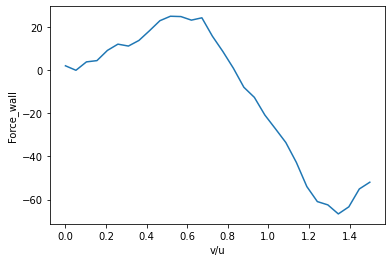

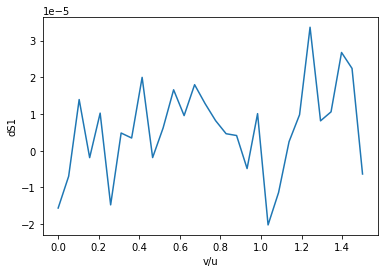

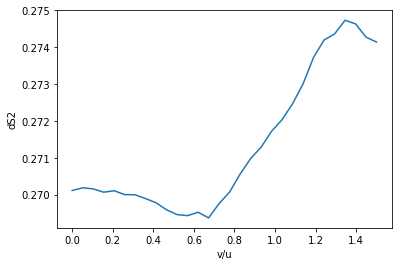

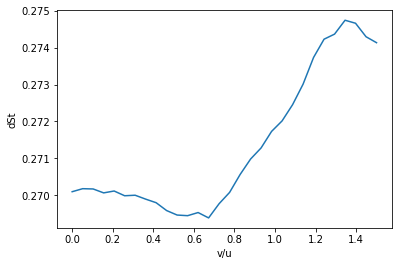

In [9]:
N=2000
f=0.3
Fs=1000
R1 = RTP_lab(N_time=Fs,N_ptcl=N, model=2)

R1.compute_EP_v(n_batch = 30, wait=50, duration=20, muFu=f)

0.0201


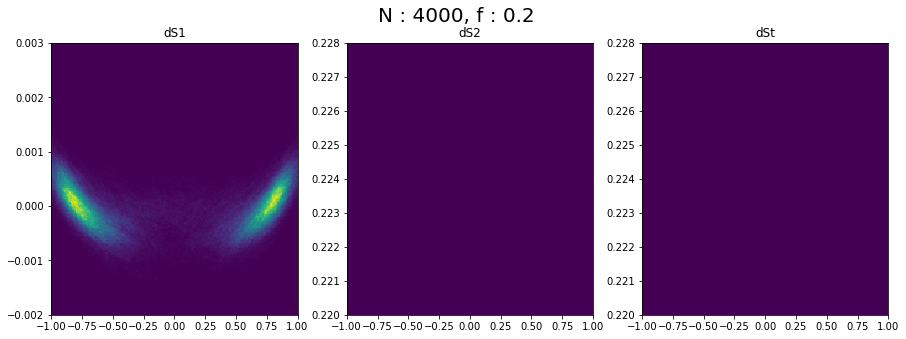

0.02242


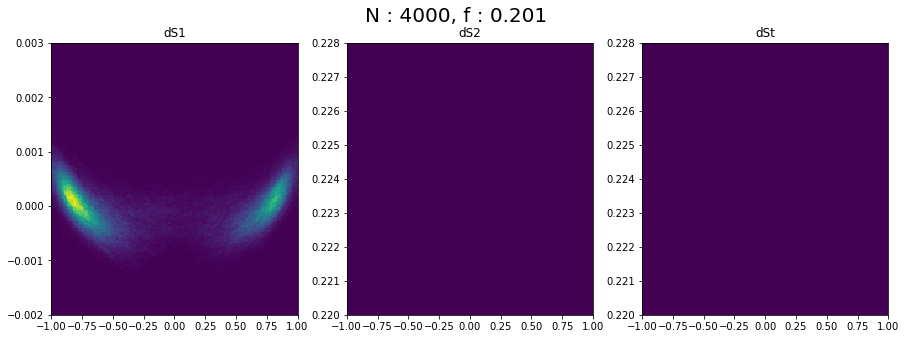

0.02082


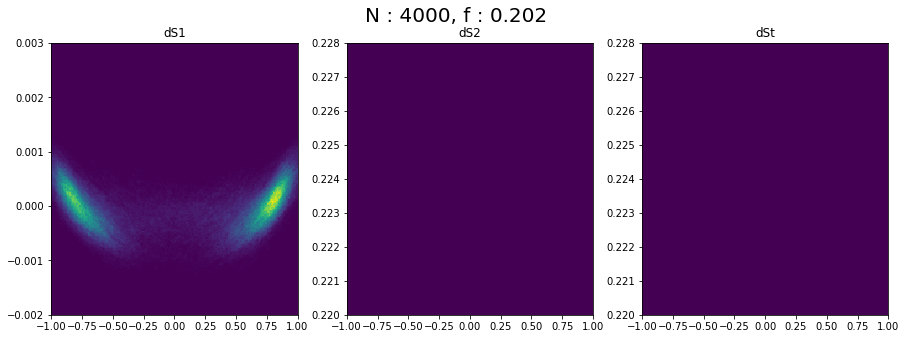

0.01978


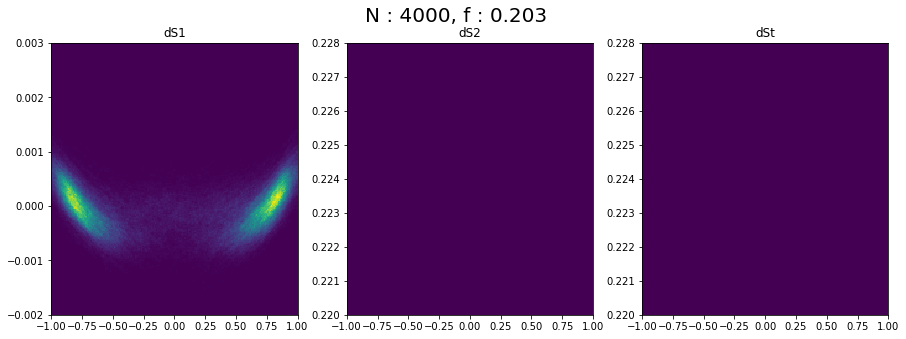

0.0228


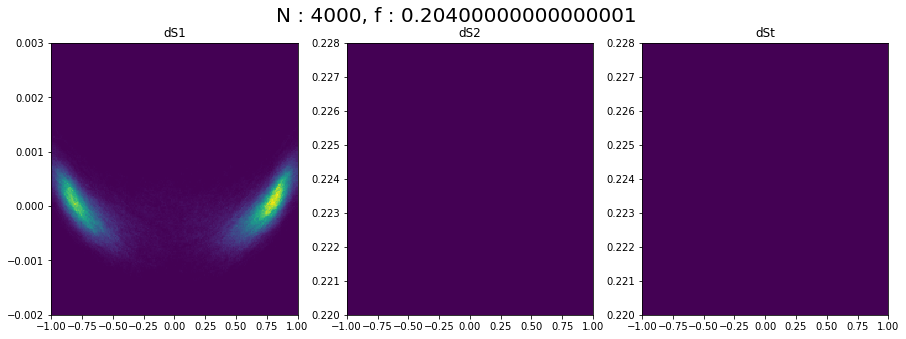

0.02976


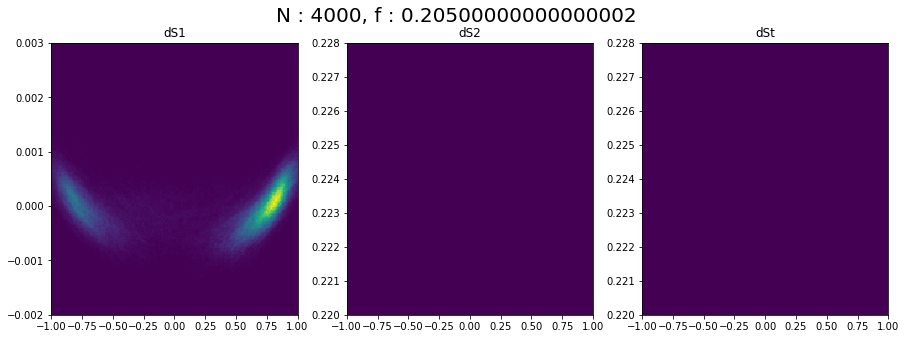

0.02278


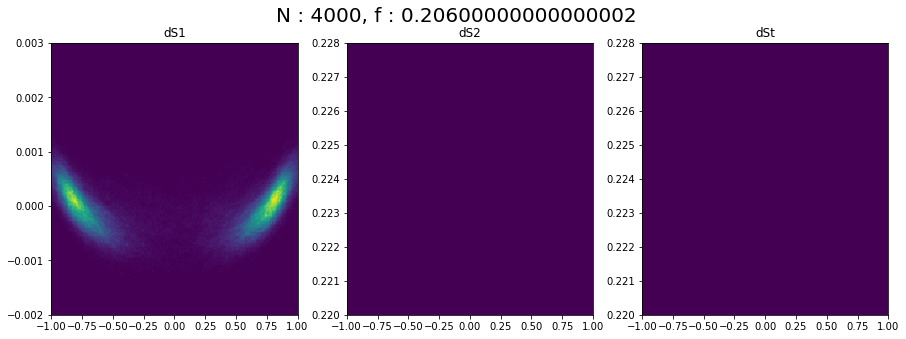

0.0235


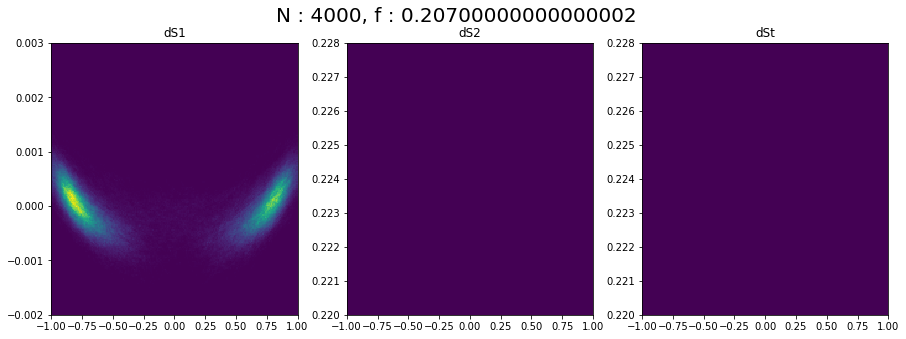

0.02622


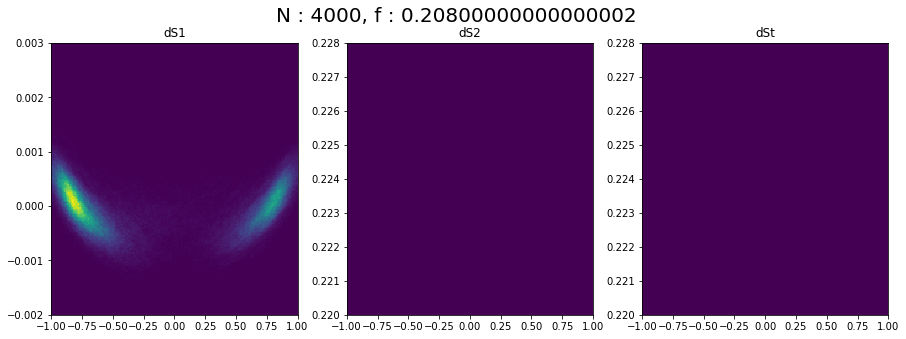

0.02406


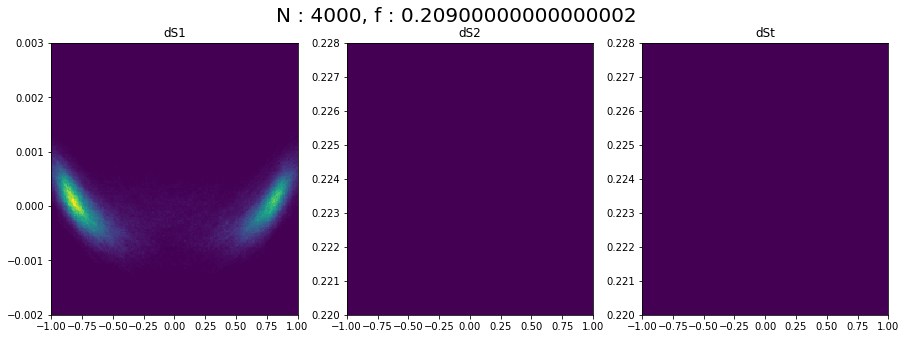

0.04232


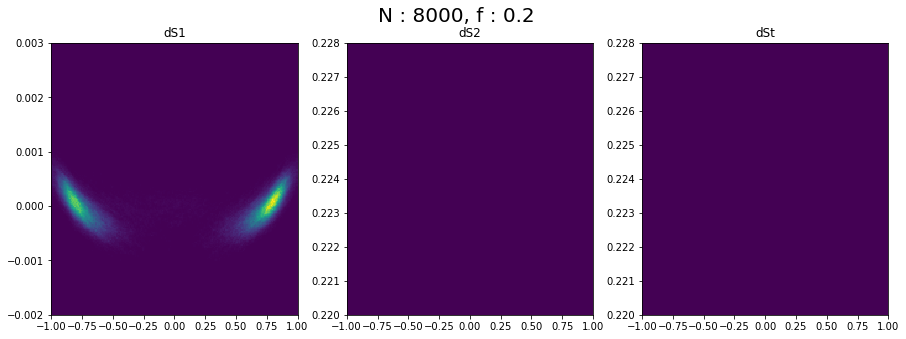

0.04184


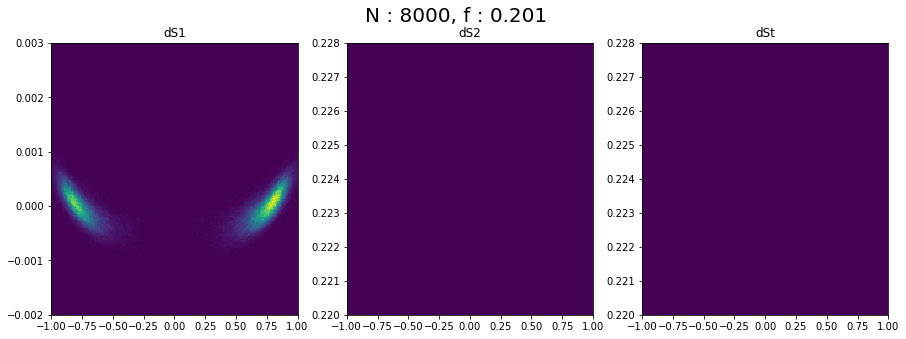

0.04476


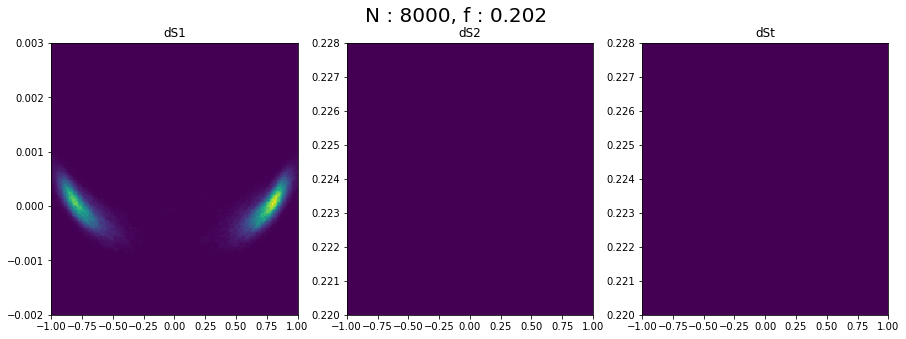

0.04402


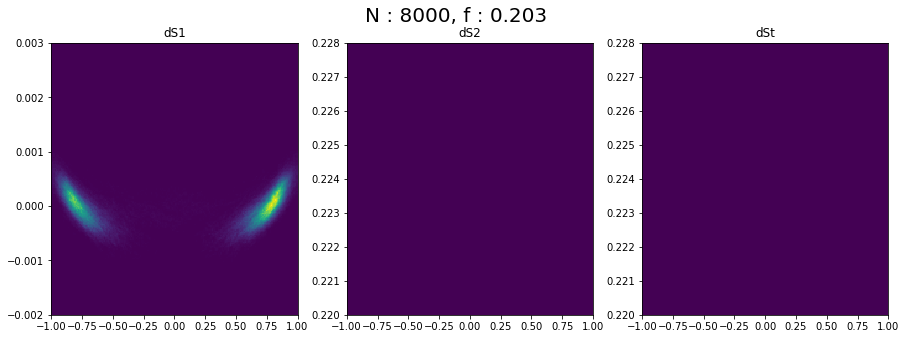

0.04262


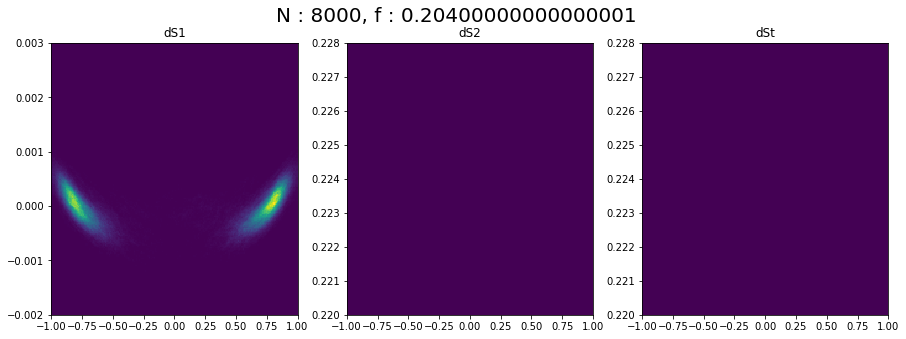

0.04294


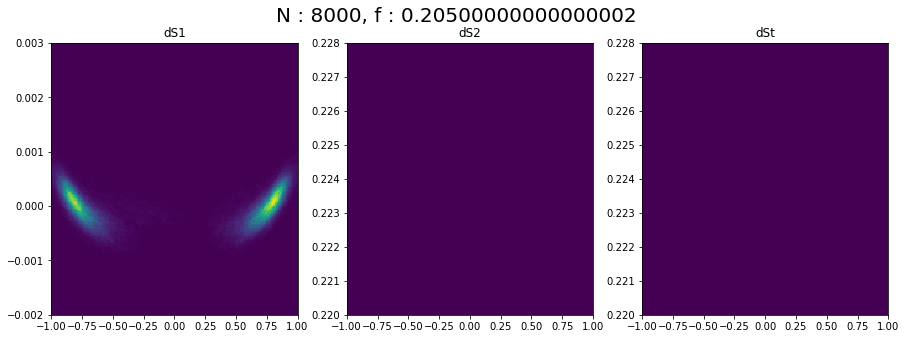

0.04524


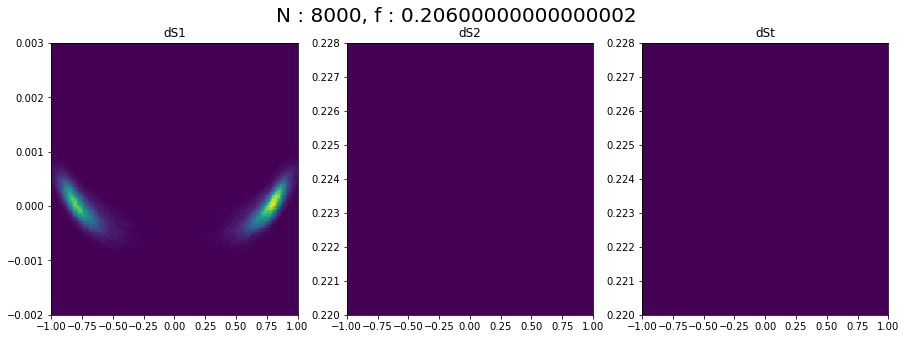

0.05362


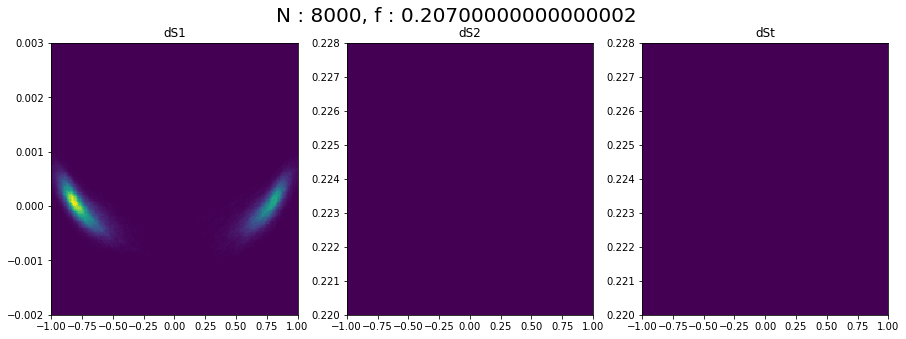

0.04506


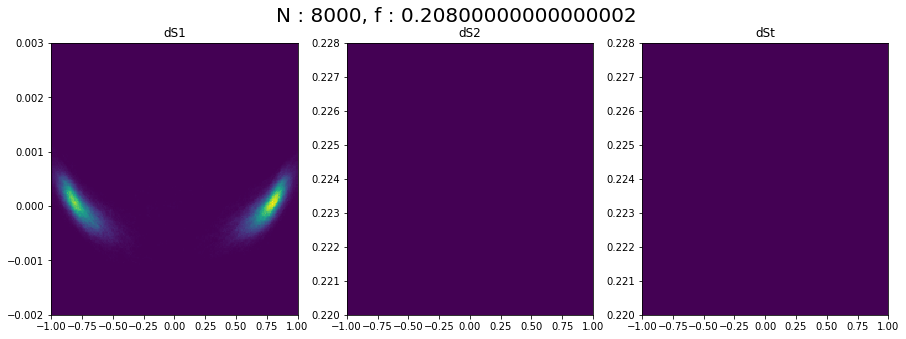

0.05238


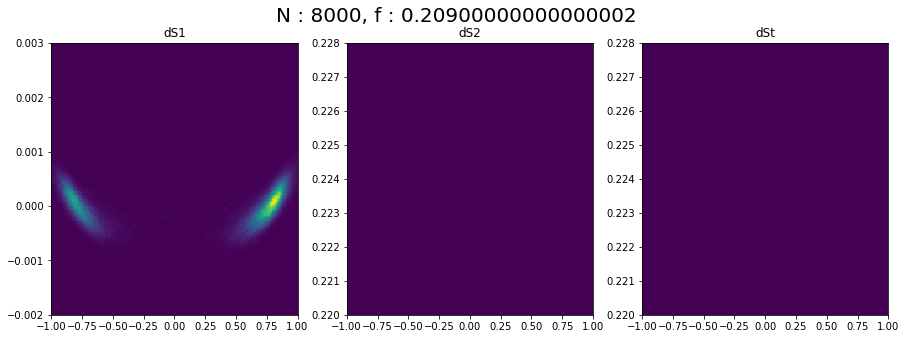

0.08506


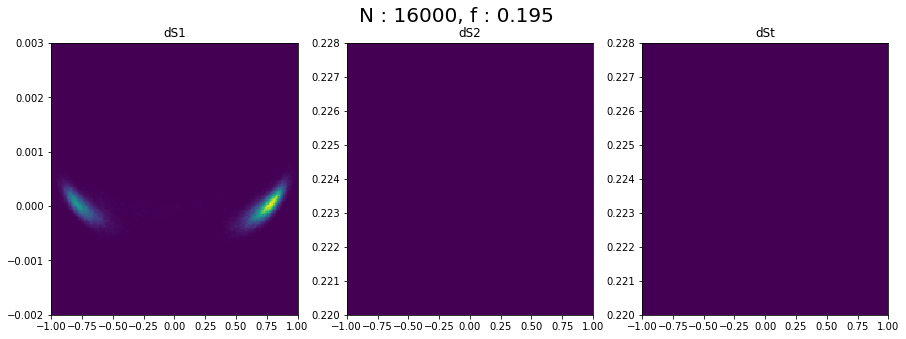

0.06796


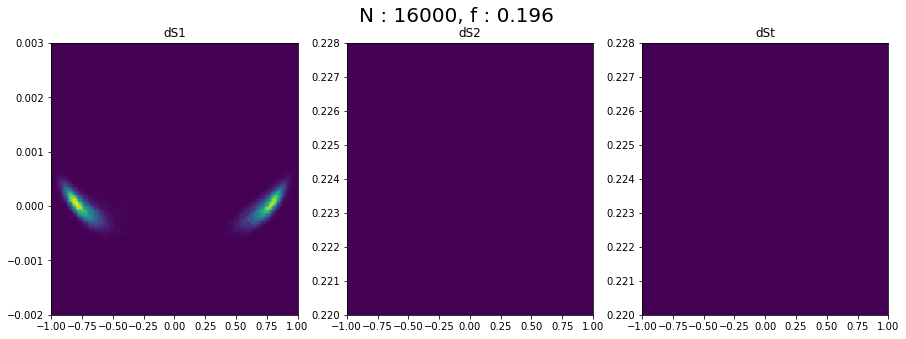

0.07182


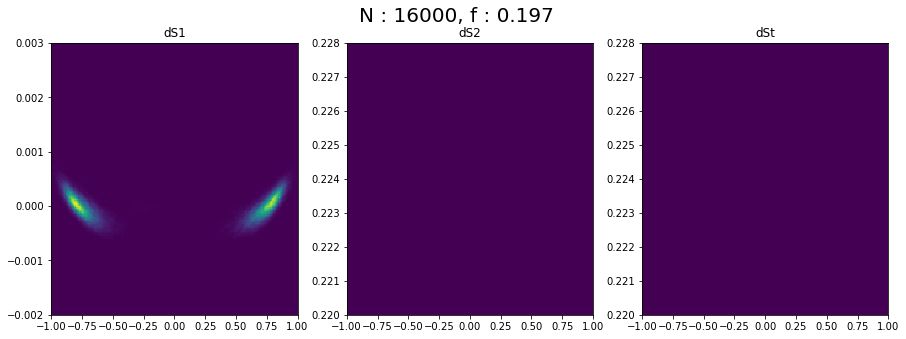

0.0818


KeyboardInterrupt: 

In [44]:
path_dir = os.getcwd()+'/data/density/210624/1/'
Fs=1000
dt = 1/Fs

N_f_list = os.listdir(path_dir)
list_of_df=[]

for N_f in N_f_list:
    N = int(N_f.split('_')[0])
    f = N_f.split('_')[1][:-4]
    df = pd.DataFrame({'N':N,'f':[f]})
    list_of_df.append(df)
N_f_df = pd.concat(list_of_df)
N_list = N_f_df['N'].drop_duplicates()
N_list = N_list.sort_values()

for N in N_list:

    f_list=N_f_df[N_f_df['N']==N]['f']
    f_list = f_list.sort_values()

    for f in f_list:
        file = path_dir+str(N)+'_'+str(f)+'.npz'


        load = np.load(file)
        vu_axis = np.linspace(-1,1,200)
#         vu_axis = load['vu_axis']
        y_dS1 = load['y_dS1']
        y_dS2 = load['y_dS2']
        y_dSt = load['y_dSt']
        n_dS1 = load['n_dS1']
        n_dS2 = load['n_dS2']
        n_dSt = load['n_dSt']
        print(np.max(n_dS1))
        
        
        fig = plt.figure(figsize=(15,5))
        fig.suptitle('N : '+str(N)+', f : '+str(f),fontsize='20')
        ax1 = fig.add_subplot(131,title='dS1')
        X,Y = np.meshgrid(vu_axis,y_dS1)
        ax1.pcolormesh(X,Y,n_dS1.T)
        ax2 = fig.add_subplot(132,title='dS2')
        X,Y = np.meshgrid(vu_axis,y_dS2)
        ax2.pcolormesh(X,Y,n_dS2.T)
        ax3 = fig.add_subplot(133,title='dSt')
        X,Y = np.meshgrid(vu_axis,y_dSt)
        ax3.pcolormesh(X,Y,n_dSt.T)
        plt.show()
        


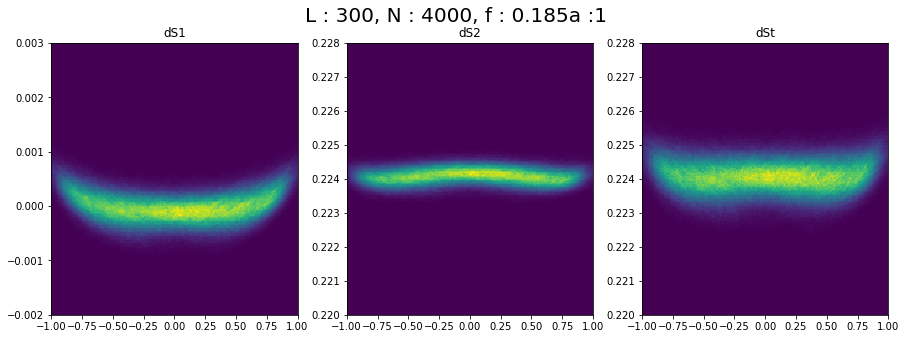

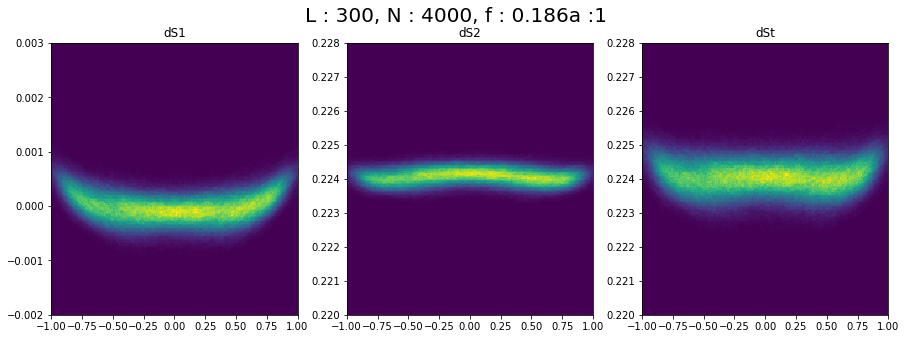

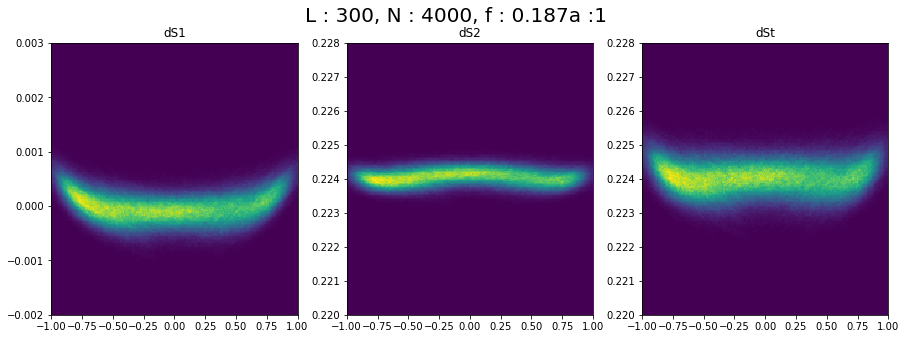

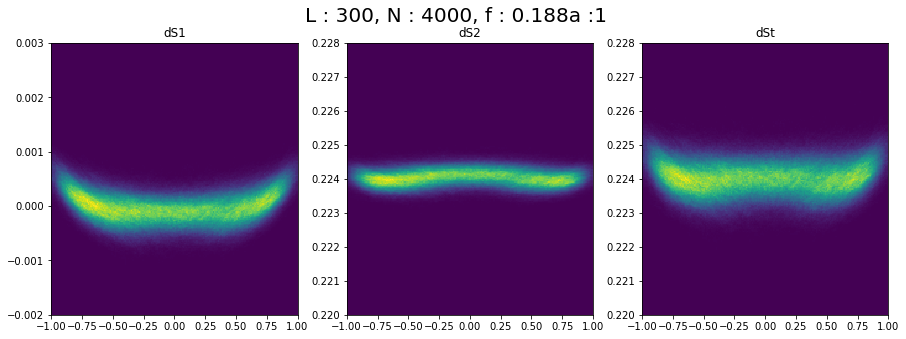

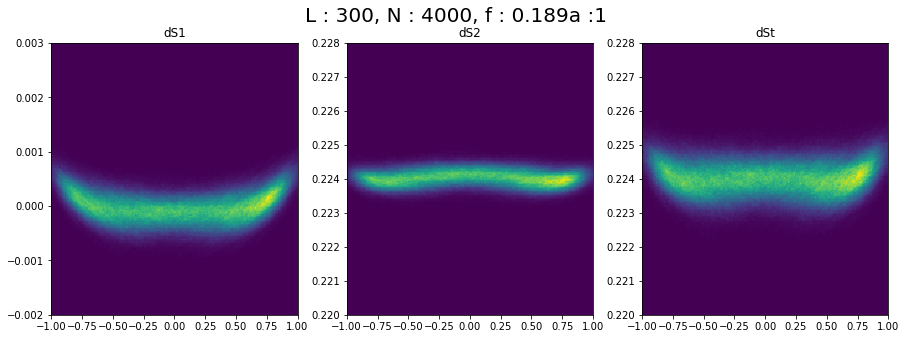

...

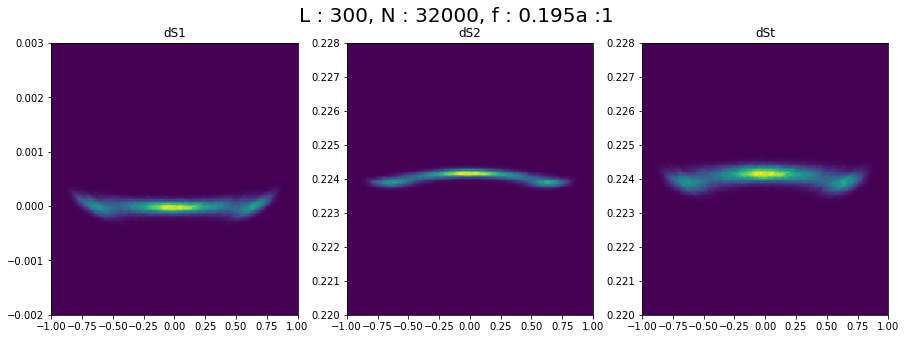

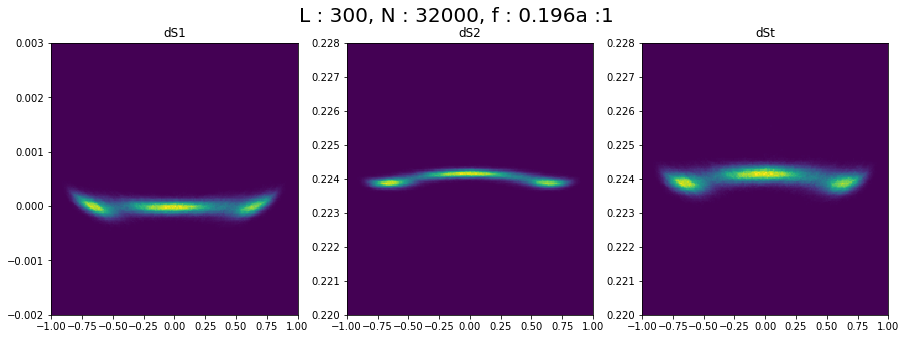

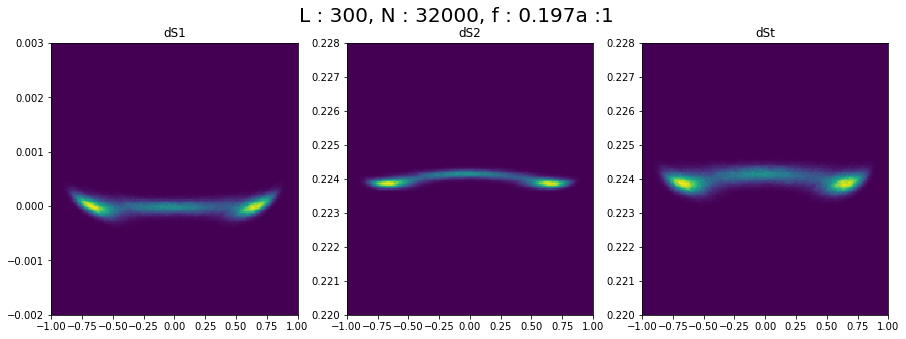

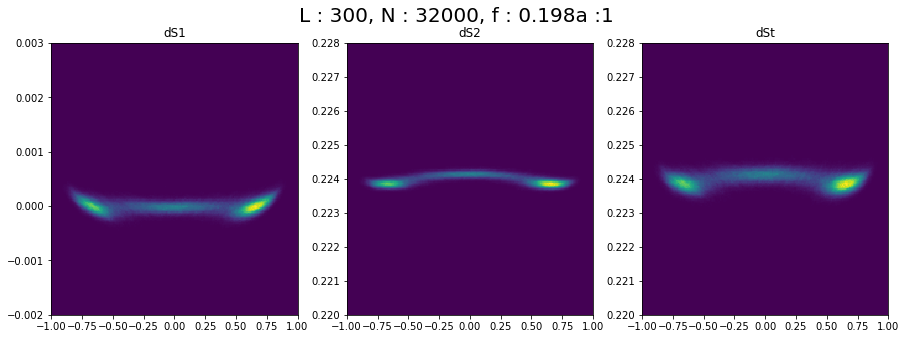

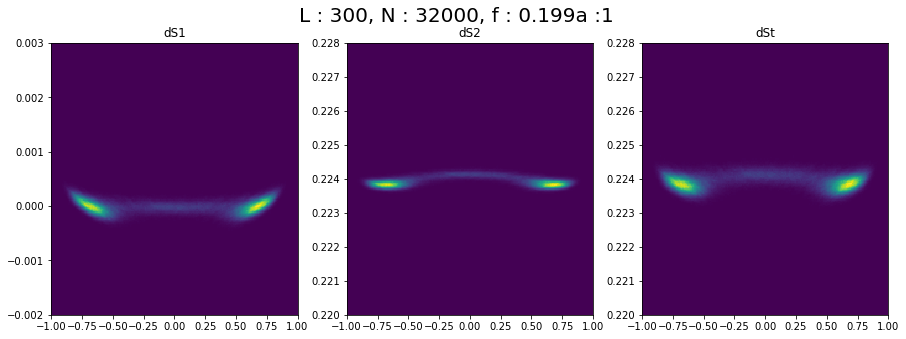

In [57]:
path_dir = os.getcwd()+'/data/dS/20210628/'
Fs=1000
dt = 1/Fs

N_list = os.listdir(path_dir)
N_sorted = []
for N in N_list:
    try:
        N_sorted.append(int(N))
    except ValueError:
        pass
        
N_sorted = sorted(N_sorted)

for N in N_sorted:

    file_list=os.listdir(path_dir+str(N))

    sorted_list = []
    for file in file_list:
        sorted_list.append(file[:-4])

    sorted_list = sorted(sorted_list)




    for file in sorted_list:
        file +='.npz'
        state = path_dir+str(N)+'/'+file
        load = np.load(state)
        time = np.arange(len(load['v']))*dt
        
#         print(load['description'])
    
        
        vu_axis = np.linspace(-1,1,200)
        dS1_axis = np.linspace(-0.002,0.003,200)
        dS2_axis = np.linspace(0.22,0.228,200)
        dSt_axis = np.linspace(0.22,0.228,200)

#         print('dS1')
#         plt.hist2d(load['v'].flatten()/15,load['dS1'].flatten(),bins = [vu_axis,dS1_axis])
#         plt.colorbar()
#         plt.show()
#         print('dS2')
#         plt.hist2d(load['v'].flatten()/15,load['dS2'].flatten(),bins = [vu_axis,dS2_axis])
#         plt.colorbar()
#         plt.show()
#         print('dS_total')
#         plt.hist2d(load['v'].flatten()/15,(load['dS1']+load['dS2']).flatten(),bins =  [vu_axis,dSt_axis])
#         plt.colorbar()
#         plt.show()


        fig = plt.figure(figsize=(15,5))
        fig.suptitle(load['description'],fontsize='20')
        ax1 = fig.add_subplot(131,title='dS1')
        plt.hist2d(load['v'].flatten()/15,load['dS1'].flatten(),bins = [vu_axis,dS1_axis])
        ax2 = fig.add_subplot(132,title='dS2')
        plt.hist2d(load['v'].flatten()/15,load['dS2'].flatten(),bins = [vu_axis,dS2_axis])
        ax3 = fig.add_subplot(133,title='dSt')
        plt.hist2d(load['v'].flatten()/15,(load['dS1']+load['dS2']).flatten(),bins =  [vu_axis,dSt_axis])
        os.makedirs('data/fig/'+str(N),exist_ok=True)
#         plt.savefig('data/fig/'+str(N)+'/'+str(file[:-4])+'.png',dpi=300)
        plt.show()

In [11]:
mylist = 100*[None]
# print(mylist)
for i in range(100):
    mylist[i] = np.arange(10)
    
# print(mylist)
mylist = np.array(mylist).flatten()
# mylist = sum(mylist,[])
print(mylist)

[0 1 2 3 4 5 6 7 8 9 0 1 2 3 4 5 6 7 8 9 0 1 2 3 4 5 6 7 8 9 0 1 2 3 4 5 6
 7 8 9 0 1 2 3 4 5 6 7 8 9 0 1 2 3 4 5 6 7 8 9 0 1 2 3 4 5 6 7 8 9 0 1 2 3
 4 5 6 7 8 9 0 1 2 3 4 5 6 7 8 9 0 1 2 3 4 5 6 7 8 9 0 1 2 3 4 5 6 7 8 9 0
 1 2 3 4 5 6 7 8 9 0 1 2 3 4 5 6 7 8 9 0 1 2 3 4 5 6 7 8 9 0 1 2 3 4 5 6 7
 8 9 0 1 2 3 4 5 6 7 8 9 0 1 2 3 4 5 6 7 8 9 0 1 2 3 4 5 6 7 8 9 0 1 2 3 4
 5 6 7 8 9 0 1 2 3 4 5 6 7 8 9 0 1 2 3 4 5 6 7 8 9 0 1 2 3 4 5 6 7 8 9 0 1
 2 3 4 5 6 7 8 9 0 1 2 3 4 5 6 7 8 9 0 1 2 3 4 5 6 7 8 9 0 1 2 3 4 5 6 7 8
 9 0 1 2 3 4 5 6 7 8 9 0 1 2 3 4 5 6 7 8 9 0 1 2 3 4 5 6 7 8 9 0 1 2 3 4 5
 6 7 8 9 0 1 2 3 4 5 6 7 8 9 0 1 2 3 4 5 6 7 8 9 0 1 2 3 4 5 6 7 8 9 0 1 2
 3 4 5 6 7 8 9 0 1 2 3 4 5 6 7 8 9 0 1 2 3 4 5 6 7 8 9 0 1 2 3 4 5 6 7 8 9
 0 1 2 3 4 5 6 7 8 9 0 1 2 3 4 5 6 7 8 9 0 1 2 3 4 5 6 7 8 9 0 1 2 3 4 5 6
 7 8 9 0 1 2 3 4 5 6 7 8 9 0 1 2 3 4 5 6 7 8 9 0 1 2 3 4 5 6 7 8 9 0 1 2 3
 4 5 6 7 8 9 0 1 2 3 4 5 6 7 8 9 0 1 2 3 4 5 6 7 8 9 0 1 2 3 4 5 6 7 8 9 0
 1 2 3 4 5 6 7 8 9 0 1 2 

In [7]:
import imageio
import os
from PIL import Image
path_dir = os.getcwd()+'/data/fig/dS/20210628/'
N_list = os.listdir(path_dir)
for N in N_list:
    try:
        int(N)
    except ValueError:
        continue
    f_list = os.listdir(path_dir+str(N)+'/')
    f_sorted =[]
    for f in f_list:
        try:
            float(f[:-4])
            f_sorted.append(f)
        except ValueError:
            continue
        f_sorted = sorted(f_sorted)
    print(f_sorted)
    path=[path_dir+str(N)+f"/{f}" for f in f_sorted]
    paths=[Image.open(i) for i in path]
    imageio.mimsave(path_dir+str(N)+'.gif',paths,fps=4)

['0.01.png', '0.02.png', '0.03.png', '0.04.png', '0.05.png', '0.06.png', '0.06999999999999999.png', '0.07999999999999999.png', '0.09.png', '0.1.png', '0.10999999999999999.png', '0.11999999999999998.png', '0.13.png', '0.14.png', '0.15.png', '0.16.png', '0.17.png', '0.18000000000000002.png', '0.19000000000000003.png', '0.19999999999999998.png', '0.21.png', '0.22.png', '0.22999999999999998.png', '0.24.png', '0.25.png', '0.26.png', '0.27.png', '0.28.png', '0.29.png', '0.3.png', '0.31.png', '0.32.png', '0.33.png', '0.33999999999999997.png', '0.35.png', '0.36.png', '0.37.png', '0.38.png', '0.39.png', '0.4.png', '0.41000000000000003.png', '0.42000000000000004.png', '0.43.png', '0.44.png', '0.45.png', '0.45999999999999996.png', '0.47.png', '0.48.png', '0.49.png', '0.5.png', '0.51.png', '0.52.png', '0.53.png', '0.54.png', '0.55.png', '0.56.png', '0.5700000000000001.png', '0.58.png', '0.59.png', '0.6.png', '0.61.png', '0.62.png', '0.63.png', '0.64.png', '0.65.png', '0.66.png', '0.67.png', '0.679

In [2]:
# L_list = [40,60,80,100,120,240,480,960]
# rho_list = [0.3125,0.625,1.25,2.5,5,10,20,40,80,160]
# path_dir = os.getcwd()+'/data/1231/N/'   #near critical point
path_dir = os.getcwd()+'/data/210430/a/'   #near critical point
path_dir = os.getcwd()+'/data/210521/a/'   #near critical point
path_dir = os.getcwd()+'/data/210526/a/'   #near critical point
path_dir = os.getcwd()+'/data/210529/a/'   #near critical point
path_dir = os.getcwd()+'/data/210601/a/'   #near critical point




path_dir1 = os.getcwd()+'/data1/210418/a/0.7/N/'
# path_dir = os.getcwd()+'/data/210125_1/N/'   # a=1
# path_dir = os.getcwd()+'/data/210226/a/0.5/N/'
# path_dir = os.getcwd()+'/data/210302/a/0.5/N/'
Fs=100
dt = 1/Fs
a_list = os.listdir(path_dir)

# new_list = []
# for a in a_list:
#     try:
#         a = float(a)
#         new_list.append(a)
#     except ValueError:
#         pass
    
# a_list = sorted(new_list)

a_N_list = []
for a in a_list:
    N_list = os.listdir(path_dir+str(a)+'/N/')
    new_list = []
    for N in N_list:
        try:
            N=int(N)
            new_list.append(N)
        except ValueError:
            pass
    new_list = sorted(new_list)
    a_N_list.append([a,new_list])
    
sin_N_list = os.listdir(path_dir1)
temp_list = []
for N in sin_N_list:
    try:
        N=int(N)
        temp_list.append(N)
    except ValueError:
        pass
sin_N_list = sorted(temp_list)
    
a_N_list.append(['sin',sin_N_list])
a_N_list


[['1.1', [2000, 4000, 8000, 16000, 20000, 30000, 32000, 50000, 64000, 128000]],
 ['sin', [10000, 20000, 40000, 80000, 160000, 320000]]]

In [3]:
mean_list=[]
kurt_list=[]
skew_list=[]
sd_list=[]
binder_list=[]
bimodal_list = []

for i in range(len(a_N_list)):
    a = a_N_list[i][0]
    if a=='sin':
        continue
    N_list = a_N_list[i][1]
    
    for N in N_list:
        file_list=(os.listdir(path_dir+str(a)+'/N/'+str(N)))

        for file in file_list:
            state = path_dir+str(a)+'/N/'+str(N)+'/'+file
            load = np.load(state)
            f = float(file[:-4])
            
            first = load['first']
            second = load['second']
            third = load['third']
            fourth = load['fourth']
            
            
#             first = np.average(first.reshape(100,-1),axis=1)
#             second = np.average(second.reshape(100,-1),axis=1)
#             third = np.average(third.reshape(100,-1),axis=1)
#             fourth = np.average(fourth.reshape(100,-1),axis=1)
            

            mean = np.average(first)
            meanerr = np.std(first)
            sd   = np.sqrt(second-first**2)
            sdmean = np.average(sd)
            sderr = np.std(sd)
            skew = (third-3*second*first + 2*first**3)/sd**3
            skewmean = np.average(skew)
            skewerr = np.std(skew)
            kurt = (fourth-4*third*first + 6*second*first**2 - 3*first**4)/sd**4
            kurtmean = np.average(kurt)
            kurterr = np.std(kurt)
            
#             plt.hist(first,bins = 10)
#             plt.title('first')
#             plt.show()
#             plt.hist(second,bins = 10)
#             plt.title('second')
#             plt.show()
#             plt.hist(fourth,bins = 10)
#             plt.title('fourth')
#             plt.show()


            binder = (1-fourth/(3*second**2))
#             binder = (1-(load['fourth']-4*load['first']*load['third']+12*load['second']*load['first']**2-6*load['first']**4)/(3*load['second']**2))
#             plt.hist(binder,bins = 10)
#             plt.title('binder')
#             plt.show()
            bindermean = np.average(binder)
#             bindermean = 1-np.average(fourth)/(3*np.average(second)**2)
#             plt.hist(binder)
#             plt.show()
            bindererr = np.std(binder)
            bimodal = (skew**2+1)/kurt
            bimodalmean = np.average(bimodal)
            bimodalerr = np.std(bimodal)

            mean_list.append(pd.DataFrame({'a':[a],'N':[N],'f':[f],'mean':[np.abs(mean)], 'meanerr':[meanerr]}))
            kurt_list.append(pd.DataFrame({'a':[a],'N':[N],'f':[f],'kurt':[kurtmean],'kurterr':[kurterr]}))
            skew_list.append(pd.DataFrame({'a':[a],'N':[N],'f':[f],'skew':[np.abs(skewmean)],'skewerr':[skewerr] }))

            sd_list.append(pd.DataFrame({'a':[a],'N':[N],'f':[f],'sd':[sdmean], 'sderr':[sderr]}))
            binder_list.append(pd.DataFrame({'a':[a],'N':[N],'f':[f],'binder':[bindermean], 'bindererr':[bindererr]}))
            bimodal_list.append(pd.DataFrame({'a':[a],'N':[N],'f':[f],'bimodal':[bimodalmean], 'bimodalerr':[bimodalerr]}))

            
for N in sin_N_list:
    file_list=(os.listdir(path_dir1+str(N)))
    for file in file_list:
        state = path_dir1+str(N)+'/'+file
        load = np.load(state)
        f = float(file[:-4])
        a='sin'

        length = len(load['first'])
        first = load['first'][int(length*3/4):]
        second = load['second'][int(length*3/4):]
        third = load['third'][int(length*3/4):]
        fourth = load['fourth'][int(length*3/4):]

#         first = np.average(first.reshape(100,-1),axis=1)
#         second = np.average(second.reshape(100,-1),axis=1)
#         third = np.average(third.reshape(100,-1),axis=1)
#         fourth = np.average(fourth.reshape(100,-1),axis=1)
            
        mean = np.average(first)
        meanerr = np.std(first)
        sd   = np.sqrt(second-first**2)
        sdmean = np.average(sd)
        sderr = np.std(sd)
        skew = (third-3*second*first + 2*first**3)/sd**3
        skewmean = np.average(skew)
        skewerr = np.std(skew)
        kurt = (fourth-4*third*first + 6*second*first**2 - 3*first**4)/sd**4
        kurtmean = np.average(kurt)
        kurterr = np.std(kurt)
        

        second = np.average(second)
        fourth = np.average(fourth)

        binder = (1-fourth/(3*(second)**2))
        
#         binder = (1-(load['fourth']-4*load['first']*load['third']+12*load['second']*load['first']**2-6*load['first']**4)/(3*load['second']**2))
        
#         bindermean = np.average(binder)
        bindermean = (1-np.average(fourth)/(3*np.average(second)**2))
        bindererr = np.std(binder)
#         Binder =  (1-np.average(load['fourth'])/(3*np.average(load['second'])**2))
        bimodal = (skew**2+1)/kurt
        bimodalmean = np.average(bimodal)
        bimodalerr = np.std(bimodal)

        mean_list.append(pd.DataFrame({'a':[a],'N':[N],'f':[f],'mean':[np.abs(mean)], 'meanerr':[meanerr]}))
        kurt_list.append(pd.DataFrame({'a':[a],'N':[N],'f':[f],'kurt':[kurtmean],'kurterr':[kurterr]}))
        skew_list.append(pd.DataFrame({'a':[a],'N':[N],'f':[f],'skew':[np.abs(skewmean)],'skewerr':[skewerr] }))

        sd_list.append(pd.DataFrame({'a':[a],'N':[N],'f':[f],'sd':[sdmean], 'sderr':[sderr]}))
        binder_list.append(pd.DataFrame({'a':[a],'N':[N],'f':[f],'binder':[bindermean], 'bindererr':[bindererr]}))
        bimodal_list.append(pd.DataFrame({'a':[a],'N':[N],'f':[f],'bimodal':[bimodalmean], 'bimodalerr':[bimodalerr]}))


Ameans = pd.concat(mean_list)
Asds = pd.concat(sd_list)
Abinders = pd.concat(binder_list)
Abimodals = pd.concat(bimodal_list)

Akurts = pd.concat(kurt_list)
Askews = pd.concat(skew_list)

print(Ameans)
print(Abinders)
print(Asds)
print(Akurts)
print(Askews)

   

      a       N       f      mean   meanerr
0   1.1    2000  0.1950  8.561574  0.526593
0   1.1    2000  0.1840  7.841102  0.492807
0   1.1    2000  0.1860  7.976637  0.516800
0   1.1    2000  0.1910  8.344861  0.497834
0   1.1    2000  0.2060  9.270493  0.713424
..  ...     ...     ...       ...       ...
0   sin  320000  0.9500  0.072238  0.008468
0   sin  320000  0.9400  0.115737  0.035895
0   sin  320000  0.9350  0.154440  0.061843
0   sin  320000  0.9100  0.676363  0.096302
0   sin  320000  0.9275  0.280122  0.103920

[613 rows x 5 columns]
      a       N       f     binder  bindererr
0   1.1    2000  0.1950   0.451220   0.041622
0   1.1    2000  0.1840   0.405664   0.043993
0   1.1    2000  0.1860   0.416094   0.047046
0   1.1    2000  0.1910   0.440185   0.040878
0   1.1    2000  0.2060   0.492618   0.049214
..  ...     ...     ...        ...        ...
0   sin  320000  0.9500 -29.575733   0.000000
0   sin  320000  0.9400  -4.707378   0.000000
0   sin  320000  0.9350  -1.091284

In [4]:
# for i in range(len(a_N_list)):
#     a = a_N_list[i][0]
#     if a=='sin':
#         continue
#     N_list = a_N_list[i][1]
    
#     for N in N_list:
#         file_list=(os.listdir(path_dir+str(a)+'/N/'+str(N)))

#         for file in file_list:
#             state = path_dir+str(a)+'/N/'+str(N)+'/'+file
#             load = np.load(state)
#             f = float(file[:-4])
            
#             fig = plt.figure()
#             ax1 = fig.add_subplot(2,2,1)
#             ax2 = fig.add_subplot(2,2,2)
#             ax3 = fig.add_subplot(2,2,3)
#             ax4 = fig.add_subplot(2,2,4)
            
#             first = load['first']
#             second = load['second']
#             third = load['third']
#             fourth = load['fourth']
#             binder = (1-fourth/(3*second**2))
            
#             time_axis = np.arange(len(first))/load['Fs']
            
#             ax1.plot(time_axis,first)
#             ax2.plot(time_axis,second)
#             ax3.plot(time_axis,fourth)
#             ax4.plot(time_axis,binder)
#             print('N : '+str(N)+', f : '+str(f) +'. Fs : '+str(load['Fs']))
#             plt.show()


In [5]:
Abinders

,a,N,f,binder,bindererr
0,1.1,2000,0.1950,0.451220,0.041622
0,1.1,2000,0.1840,0.405664,0.043993
0,1.1,2000,0.1860,0.416094,0.047046
0,1.1,2000,0.1910,0.440185,0.040878
0,1.1,2000,0.2060,0.492618,0.049214
...,...,...,...,...,...
0,sin,320000,0.9500,-29.575733,0.000000
0,sin,320000,0.9400,-4.707378,0.000000
0,sin,320000,0.9350,-1.091284,0.000000
0,sin,320000,0.9100,0.491542,0.000000


1.1


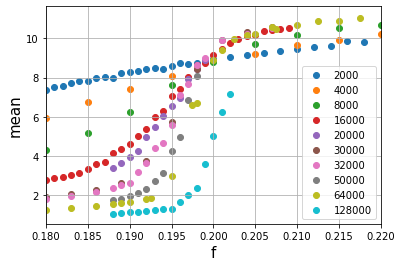

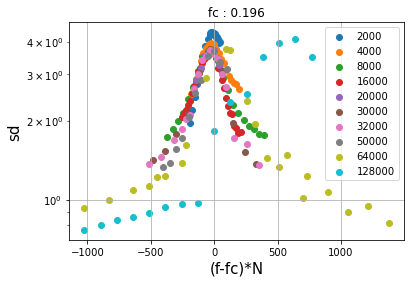

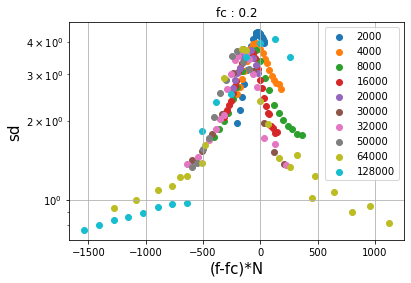

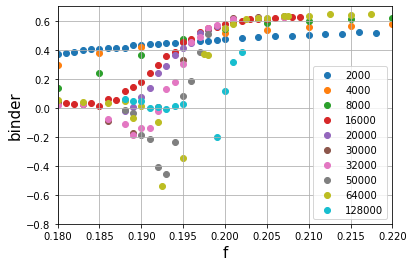

sin


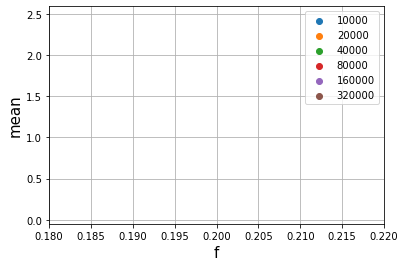

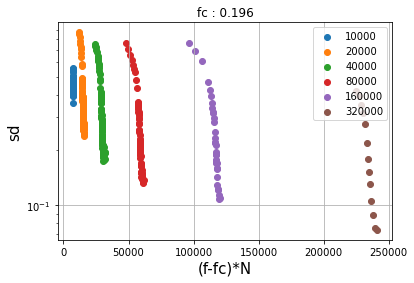

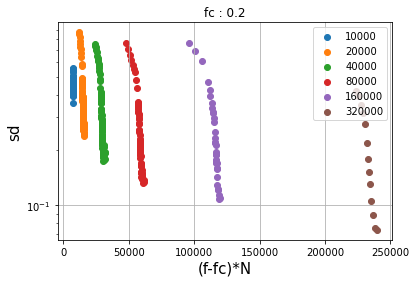

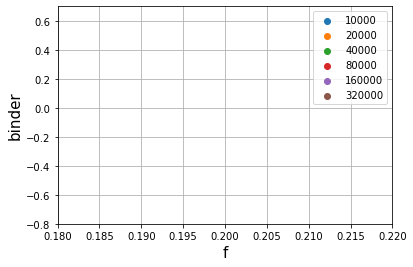

In [10]:
for i in range(len(a_N_list)):
    a = a_N_list[i][0]
    N_list = a_N_list[i][1]
    print(a)
    means = Ameans[Ameans['a']==a]
    sds = Asds[Asds['a']==a]
    binders = Abinders[Abinders['a']==a]
    bimodals = Abimodals[Abimodals['a']==a]
    kurts = Akurts[Akurts['a']==a]
    skews = Askews[Askews['a']==a]
    
    variable = 'N'
    var_list = N_list
   

#     window = (0,1.3)
#     for var in var_list:
#     #     if var<60:
#         x = means[means[variable]==var]['f'].values
#         y = means[means[variable]==var]['mean'].values/15
#         yerr = means[means[variable]==var]['meanerr'].values/15
#         plt.scatter(x,y, label =var)
#         if errorbar:
#             plt.errorbar(x,y,yerr ,uplims=True, lolims=True)
#     #     plt.errorbar(means[means[variable]==var].sort_values(by=['f'],axis=0)['f'].values,means[means[variable]==var].sort_values(by=['f'],axis=0)['mean'].values/7.5,yerr=sds[sds[variable]==var].sort_values(by=['f'],axis=0)['sd'].values/15,uplims=True, lolims=True)
#         plt.plot(means[means[variable]==var].sort_values(by=['f'],axis=0)['f'].values,means[means[variable]==var].sort_values(by=['f'],axis=0)['mean'].values/15)

#     plt.ylabel('v/u', fontsize='15')
#     plt.xlabel('f', fontsize='15')
#     plt.grid()
#     plt.title(variable, fontsize='15')
#     # plt.ylim(0,0.5)
#     # plt.scatter(analytics['f'],analytics['velocity'],s=0.5,color='r', label='MFT')
#     plt.legend()
#     plt.xlim(window)

#     plt.show()

#     for var in var_list:
#     #     if var>8000:

#         x = kurts[kurts[variable]==var]['f'].values
#         y = kurts[kurts[variable]==var]['kurt'].values
#         yerr = kurts[kurts[variable]==var]['kurterr'].values
#         plt.scatter(x,y, label =var)
#         if errorbar:
#             plt.errorbar(x,y,yerr ,uplims=True, lolims=True)
#         plt.plot(kurts[kurts[variable]==var].sort_values(by=['f'],axis=0)['f'].values,kurts[kurts[variable]==var].sort_values(by=['f'],axis=0)['kurt'].values)


#     plt.ylabel('kurtosis', fontsize='15')
#     plt.xlabel('f', fontsize='15')
#     # plt.yscale('log')
#     plt.grid()
#     plt.legend()
#     plt.xlim(window)

#     plt.show()


#     for var in var_list:
#     #     if var<60:

#         x = skews[skews[variable]==var]['f'].values
#         y = skews[skews[variable]==var]['skew'].values
#         yerr = skews[skews[variable]==var]['skewerr'].values
#         plt.scatter(x,y, label =var)
#         if errorbar:
#             plt.errorbar(x,y,yerr ,uplims=True, lolims=True)
#         plt.plot(skews[skews[variable]==var].sort_values(by=['f'],axis=0)['f'].values,np.abs(skews[skews[variable]==var].sort_values(by=['f'],axis=0)['skew'].values))


#     plt.ylabel('skewness', fontsize='15')
#     plt.xlabel('f', fontsize='15')
#     # plt.yscale('log')
#     plt.grid()
#     plt.legend()
#     plt.xlim(window)

#     plt.show()

#     # for var in var_list:
#     # #     if var<60:
#     #     x = sds[sds[variable]==var]['f'].values
#     #     y = sds[sds[variable]==var]['sd'].values/means[means[variable]==var]['mean'].values
#     #     plt.scatter(x,y, label =var)

#     #     plt.plot(sds[sds[variable]==var].sort_values(by=['f'],axis=0)['f'].values,sds[sds[variable]==var].sort_values(by=['f'],axis=0)['sd'].values/means[means[variable]==var].sort_values(by=['f'],axis=0)['mean'].values)

#     # plt.ylabel('sd/mean', fontsize='15')
#     # plt.xlabel('f', fontsize='15')
#     # # plt.yscale('log')
#     # plt.grid()
#     # plt.legend()
#     # plt.xlim(window)

#     # plt.show()\
    for var in var_list:
    #     if var<60:
        x = means[means[variable]==var]['f'].values
        y = means[means[variable]==var]['mean'].values
        yerr =means[means[variable]==var]['meanerr'].values
        plt.scatter(x,y, label =var)
#         if errorbar:
#             plt.errorbar(x,y,yerr ,uplims=True, lolims=True)
#         plt.plot(sds[sds[variable]==var].sort_values(by=['f'],axis=0)['f'].values,sds[sds[variable]==var].sort_values(by=['f'],axis=0)['sd'].values)

    plt.ylabel('mean', fontsize='15')
    plt.xlabel('f', fontsize='15')
#     plt.yscale('log')
    plt.grid()
    plt.legend()
#     plt.xlim(window)
    plt.xlim(0.18,0.22)

    plt.show()

    
    fc=0.196
    for var in var_list:
    #     if var<60:
        x = sds[sds[variable]==var]['f'].values
        y = sds[sds[variable]==var]['sd'].values
        yerr =sds[sds[variable]==var]['sderr'].values
        plt.scatter((x-fc)*var,y, label =var)
#         if errorbar:
#             plt.errorbar(x,y,yerr ,uplims=True, lolims=True)
#         plt.plot(sds[sds[variable]==var].sort_values(by=['f'],axis=0)['f'].values,sds[sds[variable]==var].sort_values(by=['f'],axis=0)['sd'].values)

    plt.ylabel('sd', fontsize='15')
    plt.xlabel('(f-fc)*N', fontsize='15')
    plt.yscale('log')
    plt.grid()
    plt.title('fc : '+str(fc))
    plt.legend()
#     plt.xlim(window)
#     plt.xlim(0.18-fc,0.22-fc)
    
    plt.show()
    
    fc=0.2
    for var in var_list:
    #     if var<60:
        x = sds[sds[variable]==var]['f'].values
        y = sds[sds[variable]==var]['sd'].values
        yerr =sds[sds[variable]==var]['sderr'].values
        plt.scatter((x-fc)*var,y, label =var)
#         if errorbar:
#             plt.errorbar(x,y,yerr ,uplims=True, lolims=True)
#         plt.plot(sds[sds[variable]==var].sort_values(by=['f'],axis=0)['f'].values,sds[sds[variable]==var].sort_values(by=['f'],axis=0)['sd'].values)

    plt.ylabel('sd', fontsize='15')
    plt.xlabel('(f-fc)*N', fontsize='15')
    plt.yscale('log')
    plt.grid()
    plt.title('fc : '+str(fc))
    plt.legend()
#     plt.xlim(window)
#     plt.xlim(0.18-fc,0.22-fc)
    
    plt.show()



    for var in var_list:
        x = binders[binders[variable]==var]['f'].values
        y = binders[binders[variable]==var]['binder'].values
#         Y = binders[binders[variable]==var]['Binder'].values
        yerr =binders[binders[variable]==var]['bindererr'].values
       
        plt.scatter(x,y, label =var)
#         plt.scatter(x,Y, label =var)
#         if errorbar:
#             plt.errorbar(x,y,yerr ,uplims=True, lolims=True)
#         plt.plot(binders[binders[variable]==var].sort_values(by=['f'],axis=0)['f'].values,binders[binders[variable]==var].sort_values(by=['f'],axis=0)['binder'].values)

    plt.ylabel('binder', fontsize='15')
    plt.xlabel('f', fontsize='15')
    plt.legend()
    plt.grid()
    plt.ylim(-0.8,0.7)
    plt.xlim(0.18,0.22)

    plt.show()

#     for var in var_list:
#     #     if var<60:
#         x = bimodals[bimodals[variable]==var]['f'].values
#         y = bimodals[bimodals[variable]==var]['bimodal'].values
#         yerr =bimodals[bimodals[variable]==var]['bimodalerr'].values
#         plt.scatter(x,y, label =var)
#         if errorbar:
#             plt.errorbar(x,y,yerr ,uplims=True, lolims=True)
#         plt.plot(bimodals[bimodals[variable]==var].sort_values(by=['f'],axis=0)['f'].values,bimodals[bimodals[variable]==var].sort_values(by=['f'],axis=0)['bimodal'].values)


#     plt.ylabel('bimodal', fontsize='15')
#     plt.xlabel('f', fontsize='15')
#     plt.legend()
#     plt.grid()
#     plt.xlim(window)

#     plt.show()

0.186.npz
0.191.npz
0.185.npz
0.187.npz
0.192.npz
0.19.npz
['0.185', '0.186', '0.187', '0.19', '0.191', '0.192']
L : 300, N : 32000, f : 0.185a :1


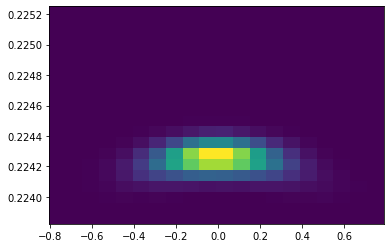

L : 300, N : 32000, f : 0.186a :1


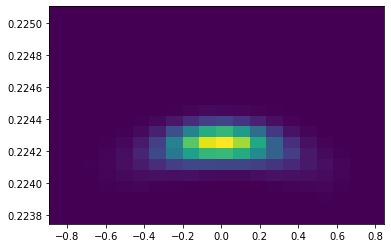

L : 300, N : 32000, f : 0.187a :1


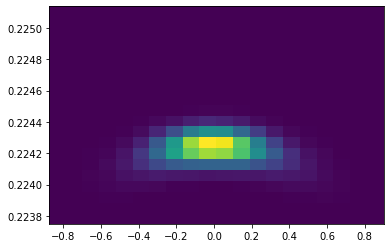

L : 300, N : 32000, f : 0.19a :1


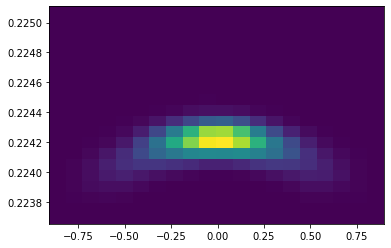

L : 300, N : 32000, f : 0.191a :1


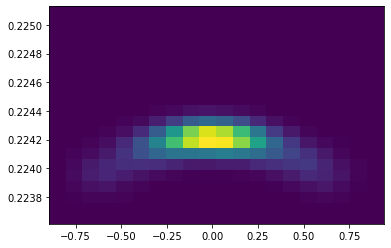

L : 300, N : 32000, f : 0.192a :1


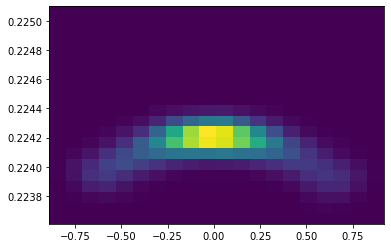

0.186.npz
0.191.npz
0.185.npz
0.189.npz
0.187.npz
0.192.npz
0.19.npz
0.188.npz
['0.185', '0.186', '0.187', '0.188', '0.189', '0.19', '0.191', '0.192']
L : 300, N : 16000, f : 0.185a :1


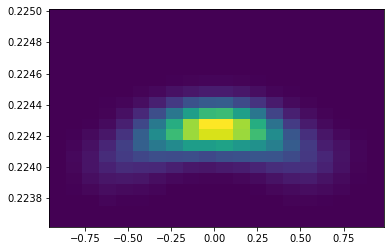

L : 300, N : 16000, f : 0.186a :1


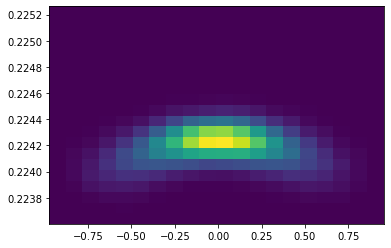

L : 300, N : 16000, f : 0.187a :1


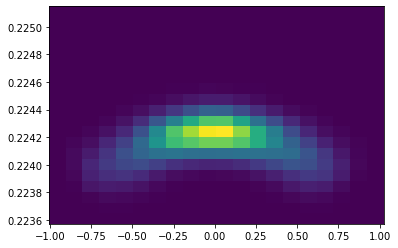

L : 300, N : 16000, f : 0.188a :1


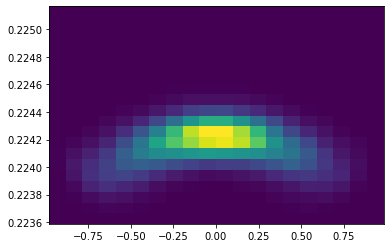

L : 300, N : 16000, f : 0.189a :1


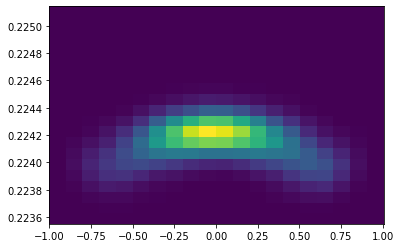

L : 300, N : 16000, f : 0.19a :1


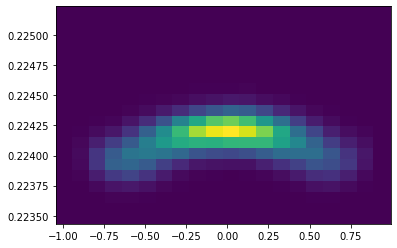

L : 300, N : 16000, f : 0.191a :1


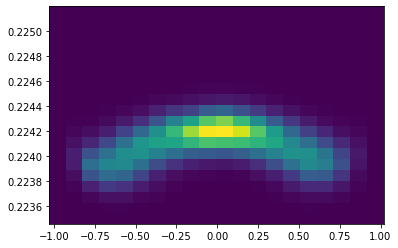

L : 300, N : 16000, f : 0.192a :1


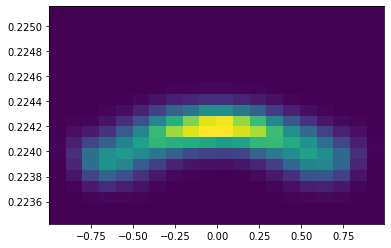

0.186.npz
0.191.npz
0.194.npz
0.185.npz
0.193.npz
0.189.npz
0.187.npz
0.192.npz
0.19.npz
0.188.npz
['0.185', '0.186', '0.187', '0.188', '0.189', '0.19', '0.191', '0.192', '0.193', '0.194']
L : 300, N : 8000, f : 0.185a :1


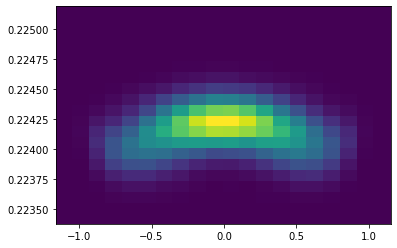

L : 300, N : 8000, f : 0.186a :1


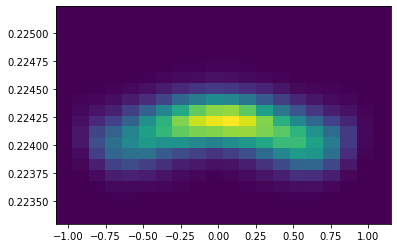

L : 300, N : 8000, f : 0.187a :1


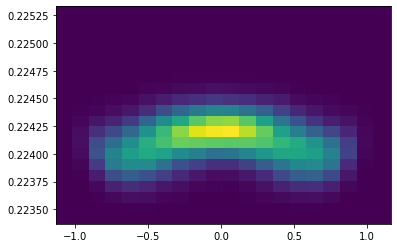

L : 300, N : 8000, f : 0.188a :1


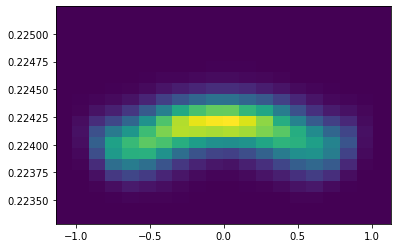

L : 300, N : 8000, f : 0.189a :1


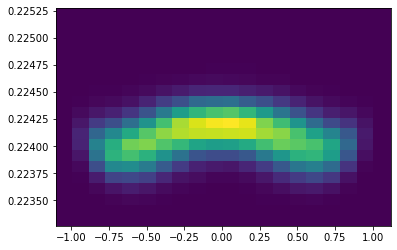

L : 300, N : 8000, f : 0.19a :1


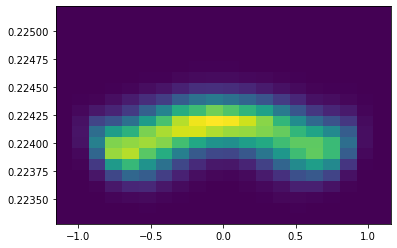

L : 300, N : 8000, f : 0.191a :1


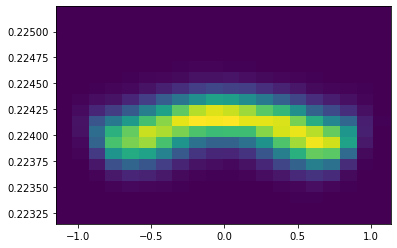

L : 300, N : 8000, f : 0.192a :1


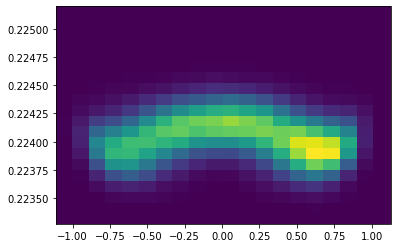

L : 300, N : 8000, f : 0.193a :1


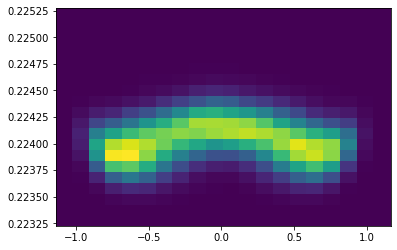

L : 300, N : 8000, f : 0.194a :1


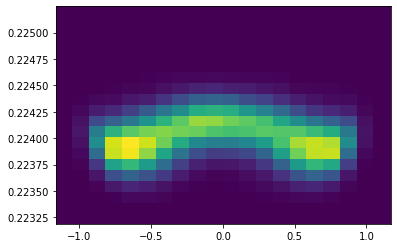

In [7]:
path_dir = os.getcwd()+'/data/dS/210621/'
Fs=1000
dt = 1/Fs

N_list = os.listdir(path_dir)

for N in N_list:

    file_list=os.listdir(path_dir+N)

    sorted_list = []
    for file in file_list:
        print(file)
        sorted_list.append(file[:-4])

    sorted_list = sorted(sorted_list)

    print(sorted_list)



    for file in sorted_list:
    # for i in range(12):
    #     file = str(1000*i**2)+'.npz'
        file +='.npz'
        state = path_dir+N+'/'+file
        load = np.load(state)
        time = np.arange(len(load['v']))*dt
        
        print(load['description'])
#         t = len(load['v'])

#         # Plot the position
#         plt.plot(np.arange(t)*dt, load['v']/15, 'r-')
#         plt.xlabel('Time(s)')
#         plt.ylabel('v/u')
#         plt.ylim(-1,1)

#         plt.show()


#         plt.plot(np.arange(t)*dt, load['dS'], 'r-')
#         plt.xlabel('Time(s)')
#         plt.ylabel('dS')
#     #     plt.ylim(-1,1)

#         plt.show()



    #         # Plot the position
    #     plt.plot(np.arange(t)*dt, load['X'],  label='X')
    #     plt.xlabel('Time(s)')
    #     plt.ylabel('X')
    #     plt.ylim(-150,150)

    #     plt.show()

#         plt.scatter(load['v']/15,load['dS'])
        plt.hist2d(load['v'].flatten()/15,load['dS'].flatten(),bins = 20)
        plt.show()


#         plt.hist(load['v']/15,bins = np.linspace(-2,2,100))
#         plt.xlabel('v/u')

#         plt.show()


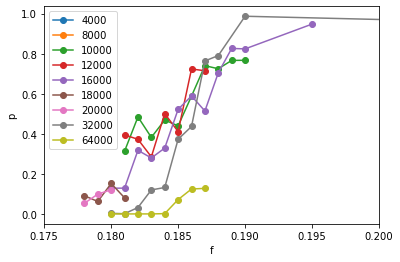

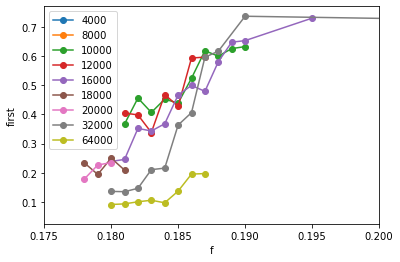

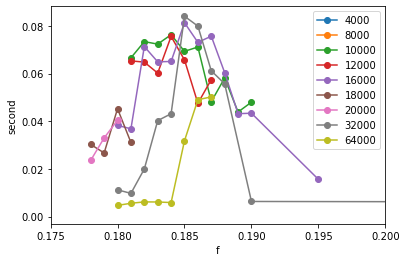

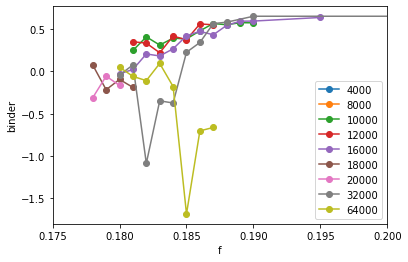

In [7]:
path_dir = os.getcwd()+'/data/density/210607/1/'
file_list = os.listdir(path_dir)
file_map = []

for file in file_list:
    state = path_dir+file
    load = np.load(state)
    N = load['N']
    f = load['f']
    file_map.append(pd.DataFrame({'state':[state],'N':[N],'f':[f]}))



file_map = pd.concat(file_map)
f_set = set()
N_set = set()
for f in file_map['f']:
    f_set.add(float(f))
for N in file_map['N']:
    N_set.add(int(N))
    
N_set = sorted(list(N_set))
# for f in f_set:
#     for state in file_map[file_map['f']==f]['state']:
#         load = np.load(state)
#         N = load['N']
#         plt.plot((load['bins'][:-1]+load['bins'][1:])/2,load['n'],label = N)
    
#     plt.title('f : '+str(f))
#     plt.yscale('log')
#     plt.xlabel('v/u')
#     plt.ylabel('density')
#     plt.legend()
#     plt.show()


for N in N_set:
    
    f_p = []
    
    for state in file_map[file_map['N']==N]['state']:
        load = np.load(state)
        f = float(load['f'])
        f_p.append([f,np.sum(load['n'][np.abs((load['bins'][:-1]+load['bins'][1:])/2)>0.5])/100])
    f_p = np.array(sorted(f_p,key=lambda i: i[0]))
    plt.plot(f_p[:,0],f_p[:,1],'-o',label=N)
plt.xlim(0.175,0.2)
plt.xlabel('f')
plt.legend()
plt.ylabel('p')
plt.show()


for N in N_set:
    
    f_first = []
    
    for state in file_map[file_map['N']==N]['state']:
        load = np.load(state)
        f = load['f']
        first = (np.sum(load['n']*np.abs((load['bins'][:-1]+load['bins'][1:])/2)))/np.sum(load['n'])
        f_first.append([f,first])
    f_first = np.array(sorted(f_first,key=lambda i:i[0]) )   
    plt.plot(f_first[:,0],f_first[:,1],'-o',label=N)
plt.xlim(0.175,0.2)
plt.xlabel('f')
plt.legend()
plt.ylabel('first')
plt.show()


for N in N_set:
    
    f_second = []
    for state in file_map[file_map['N']==N]['state']:
        load = np.load(state)
        f = load['f']
        first = (np.sum(load['n']*np.abs((load['bins'][:-1]+load['bins'][1:])/2)))/np.sum(load['n'])
        second = (np.sum(load['n']*((load['bins'][:-1]+load['bins'][1:])/2)**2))/np.sum(load['n'])
        f_second.append([f,second-first**2])
        
        
    f_second = np.array(sorted(f_second,key=lambda i: i[0]))
    plt.plot(f_second[:,0],f_second[:,1],'-o',label=N)
plt.xlim(0.175,0.2)
plt.xlabel('f')
plt.legend()
plt.ylabel('second')
plt.show()





    
for N in N_set:
    
    f_binder = []
    for state in file_map[file_map['N']==N]['state']:
        load = np.load(state)
        f = load['f']
        second=(np.sum(load['n']*((load['bins'][:-1]+load['bins'][1:])/2)**2))/np.sum(load['n'])
        fourth=(np.sum(load['n']*((load['bins'][:-1]+load['bins'][1:])/2)**4))/np.sum(load['n'])
        f_binder.append([f,1-(fourth/(3*second**2))])
    f_binder = np.array(sorted(f_binder, key=lambda i:i[0]))
    plt.plot(f_binder[:,0],f_binder[:,1],'-o',label=N)
plt.xlim(0.175,0.2)
plt.xlabel('f')
plt.legend()
plt.ylabel('binder')
plt.show()


In [19]:
print(file_map)

                                                state      N  \
0   /home/siksik/RTP_git/data/density/210607/1/800...   8000   
0   /home/siksik/RTP_git/data/density/210607/1/120...  12000   
0   /home/siksik/RTP_git/data/density/210607/1/320...  32000   
0   /home/siksik/RTP_git/data/density/210607/1/320...  32000   
0   /home/siksik/RTP_git/data/density/210607/1/800...   8000   
..                                                ...    ...   
0   /home/siksik/RTP_git/data/density/210607/1/400...   4000   
0   /home/siksik/RTP_git/data/density/210607/1/120...  12000   
0   /home/siksik/RTP_git/data/density/210607/1/100...  10000   
0   /home/siksik/RTP_git/data/density/210607/1/400...   4000   
0   /home/siksik/RTP_git/data/density/210607/1/120...  12000   

                     f  
0                  0.8  
0                0.181  
0                  0.8  
0   0.8200000000000001  
0                 0.88  
..                 ...  
0                 0.97  
0                0.182  
0     

In [8]:
from RTP_gpu import RTP_lab
import torch
N_list=[16000,4000,1000]
a=1.1

Fs=200
rho = 1
L=300
l=30
muw = rho*L/N
f_axis = np.linspace(0.2,1,5)
binning = np.linspace(-1,1,200)




for N in N_list:
    for f in f_axis:
        R1 = RTP_lab(N_time = Fs, N_X = 32, N_ptcl = N)
        R1.L=L
        R1.l=l/a
        R1.u = a*l*R1.alpha/2
        R1.F = f*R1.u/R1.mu
        
        state = os.getcwd()+'/data/density/210519/'+str(name)+'.npz'
        os.makedirs(os.getcwd()+'/data/density/210519/',exist_ok=True)

        for i in trange(50000):
            R1.time_evolve()
        n,bins,patches = plt.hist(R1.v.to(device=torch.device('cpu')).numpy().flatten()/R1.u, bins = binning, density = True)
        for i in trange(9999):
            R1.time_evolve()
            n_temp,__,_ = plt.hist(R1.v.to(device=torch.device('cpu')).numpy().flatten()/R1.u, bins = binning, density = True)
            n+=n_temp
        n/=10000  
        
        save_dict={}
        save_dict['N'] = N
        save_dict['a'] = a
        save_dict['f'] = f
        save_dict['L'] = L
        save_dict['l'] = l
        save_dict['Fs'] = Fs
        save_dict['n'] = n
        save_dict['bins'] = bins
        
        np.savez(state, **save_dict)

        
        print('N :',N, ', f :',f)
        plt.clf()
        plt.yscale('log')
        plt.xlabel('v/u')
        plt.ylabel('density')
        plt.plot(bins[:-1],n/10000)
        plt.show()
    



# density = plt.hist(load[measure].flatten()/15,bins = binning, density = True)
# plt.yscale('log')
# plt.show()

RTP model initialized


NameError: name 'name' is not defined

In [ ]:
# def muF(f,r,a,R):   # self consistent gamma v, R=L/l,,, using v/u as velocity
#     wp = -(f-r)/(a*(1-(f-r)**2))
#     wm = -(f+r)/(a*(1-(f+r)**2))
#     w0 = -r*(R-1)/(a*(1-r**2))
    
#     A = np.exp(w0)
#     B = np.exp(wm)
#     C0 = np.exp(-wp)
    
#     a1 = (R-1)/(a*r*(1-r**2)) + (A-1)/r**2
#     a2 = a1
#     a3 = B*C0*(1-A)**2/r**2
#     a4 = (A-1)*(1-C0)/(r*(f-r))
#     a5 = -C0*(A-1)*(1-B)/(r*(f+r))
#     a6 = B*(C0-1)*(1-A)/(r*(f-r))
#     a7 = -(B-1)*(1-A)/(r*(f+r))
#     a8 = -1/(a*(1-(f-r)**2)*(f-r))  + (C0-1)/(f-r)**2
#     a9 = 1/(a*(1-(f+r)**2)*(f+r)) + (B-1)/(f+r)**2
#     a10 = -(B-1)*(C0-1)/((f+r)*(f-r))
    
#     A1 = a1+a2+a3+a4+a5+a6+a7+a8+a9+a10
#     GL = 2*w0+wm-wp
#     AL = 1-np.exp(-GL)
#     A2 = (1/AL)*((1-A)*B/r+(1-B)/(f+r)-(1/C0-1)/(f-r)+(1/A-1)/(r*C0))*(-(1-1/A)/(r*B)-(1-1/B)/(f+r)  + (C0-1)/(f-r) -(A-1)*C0/r)
    
#     FA = -2*R*(2*R/(a*(A2-A1-GL)) +r)/a
#     FB = -f*r*(-(1-np.exp((f-r)/(a*(1-(f-r)**2))))*(1-(f-r)**2)/(f-r)**2   - 1/(a*(f-r))  -(1-np.exp((f-r)/(a*(1-(f-r)**2))))*(1-(f-r)**2)/((f-r)*(1-f+r))  - 1/(a*(f+r))  - (1-np.exp((f+r)/(a*(1-(f+r)**2))))*(1-(f+r)**2)/(f+r)**2   + (1-np.exp((f+r)/(a*1-(f+r)**2)))*(1-(f+r)**2)/((f+r)*(1+f+r))+  ((1-r)/f)*(f+np.exp((f+r)/(a*(1-(f+r)**2)))*(1-f-r)  + (-1+r**2)/r   +(1-np.exp((f+r)/(a*1-(f+r)**2)))*(1-(f+r)**2) ))
    
#     phaseA = f+r <=1
#     phaseB = f+r>1
#     return phaseA*FA + phaseB*FB

# def consistency_r(f,a,R,gamma):
#     r_axis = np.linspace(0.0001,1,5000)
#     f_r = muF(f,r_axis,a,R)
#     f_gamma = gamma*r_axis
    
#     det = f_r-f_gamma>0
#     return r_axis[:-1][det[1:]!=det[:-1]]
# #muF = gamma r

# rho=1
# R=10
# a=1
# gamma=1/(rho*15)
# analytic=[]
# f_axis = np.linspace(0.0001,1,10000)
# gamma = 1/(rho*15)
# for f in f_axis:
#     velocity = consistency_r(f,a,R,gamma)
#     for v in velocity:
#         if np.abs(v+f-1)>0.01:
#             analytic.append(pd.DataFrame({'velocity':[v],'f':[f],'rho':[rho]}))
# #         plt.scatter(f*np.ones(len(consistency_r(f,a,R,gamma))),consistency_r(f,a,R,gamma), color='r', label=R)
# analytics = pd.concat(analytic)
# analytics

1.2


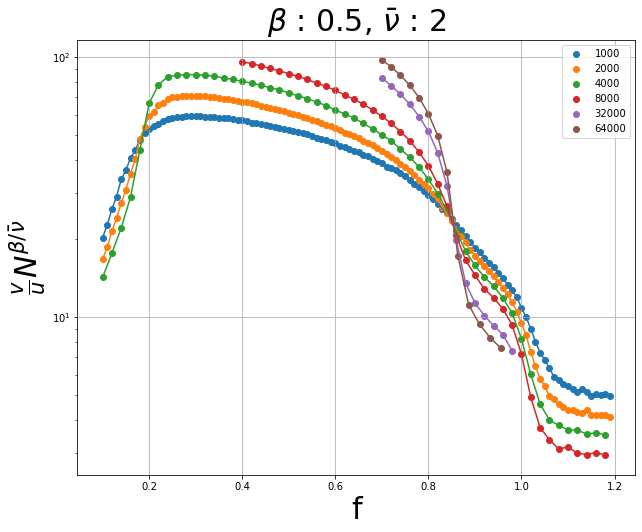

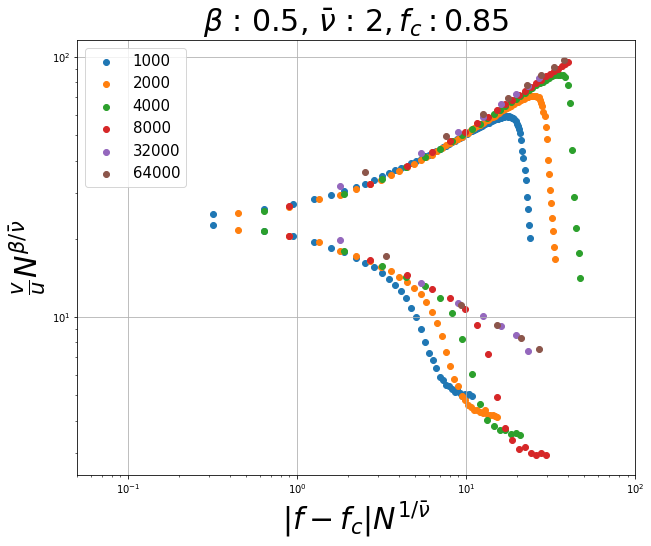

0.3


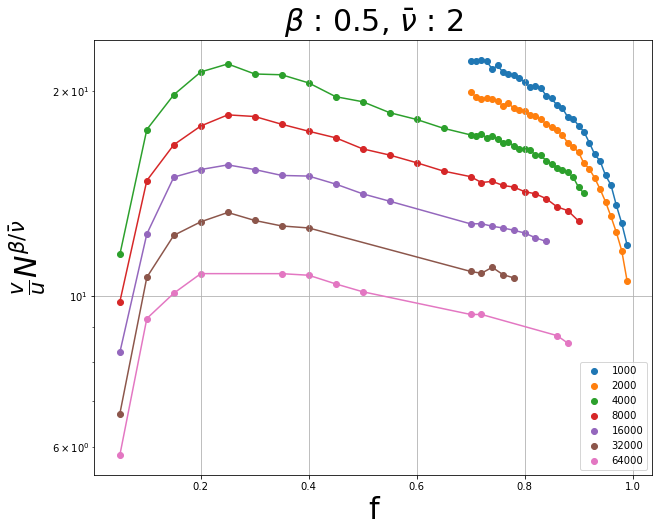

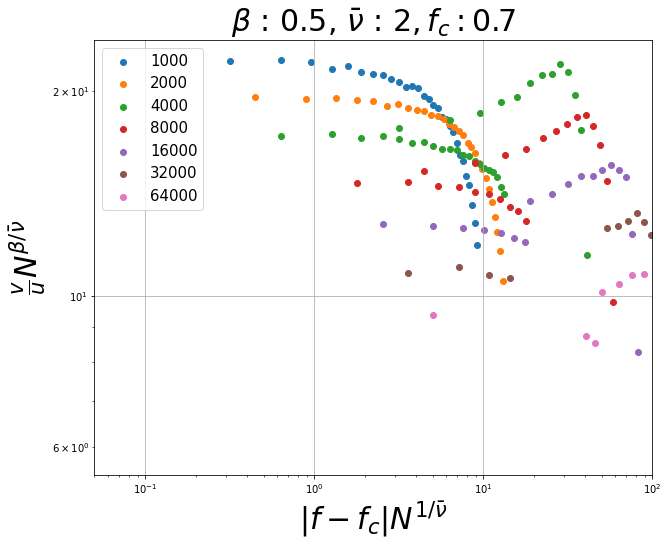

0.7


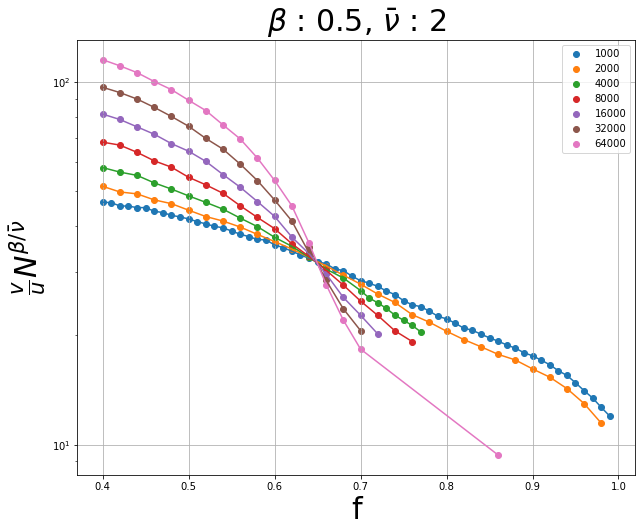

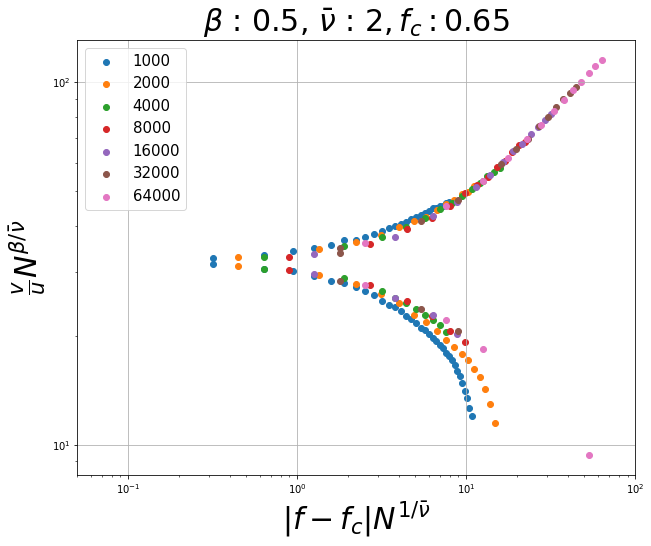

3


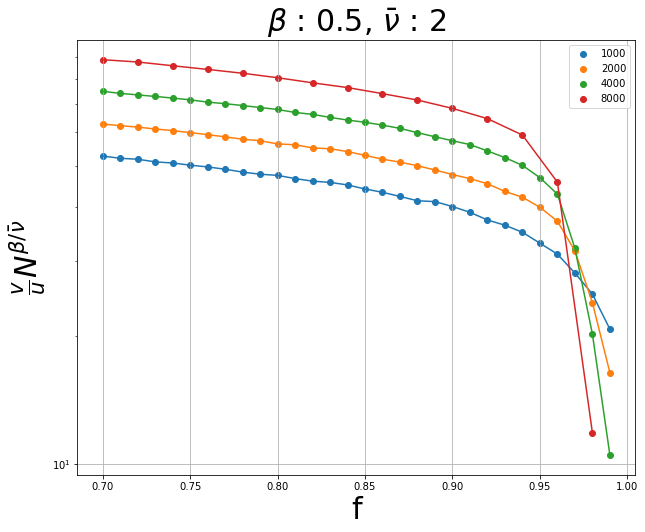

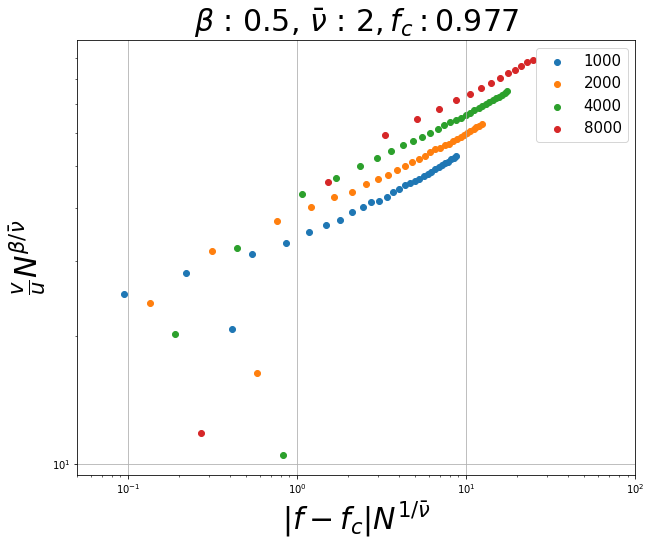

0.8


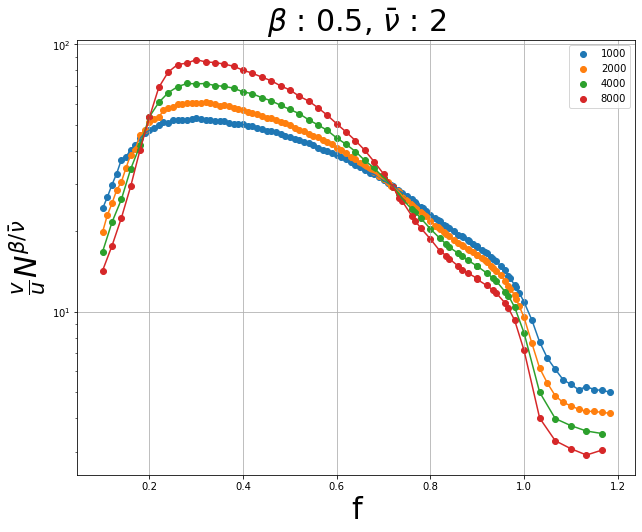

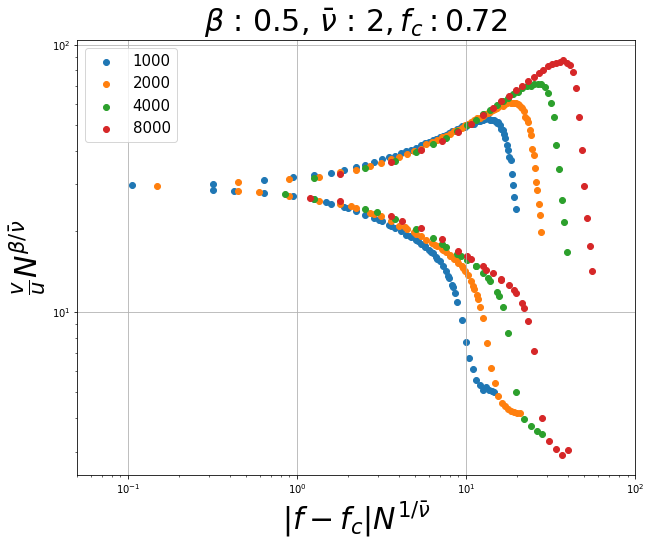

1.1


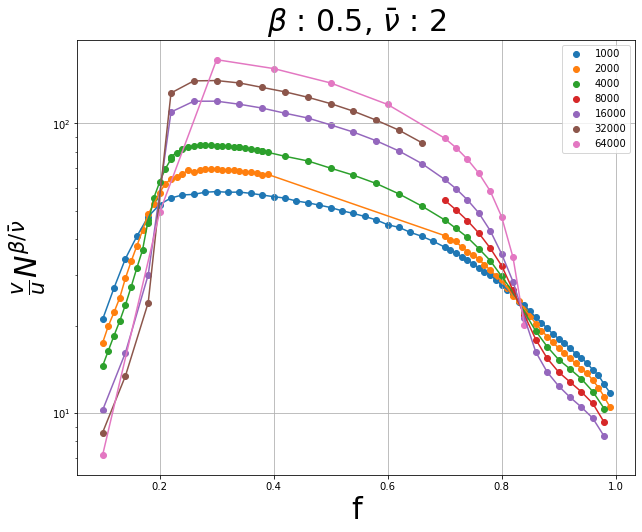

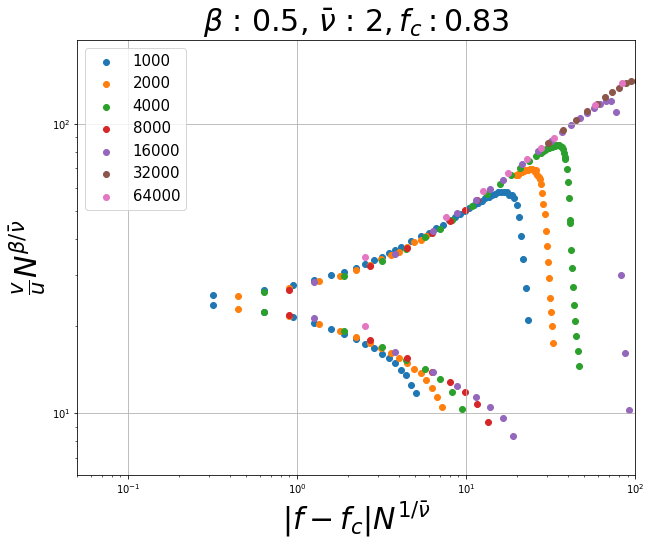

4


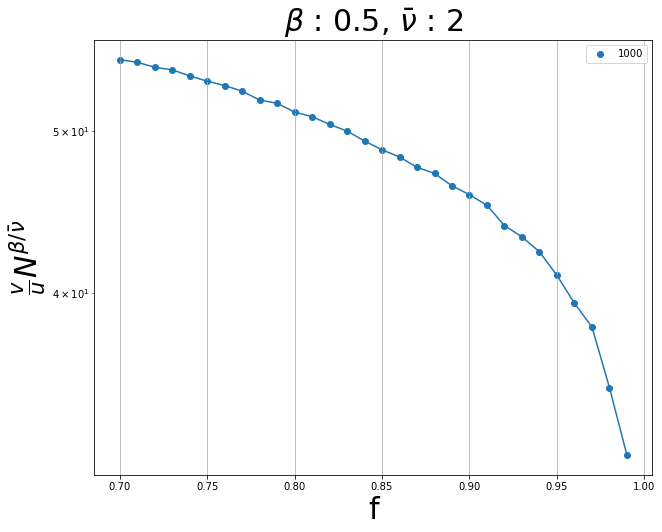

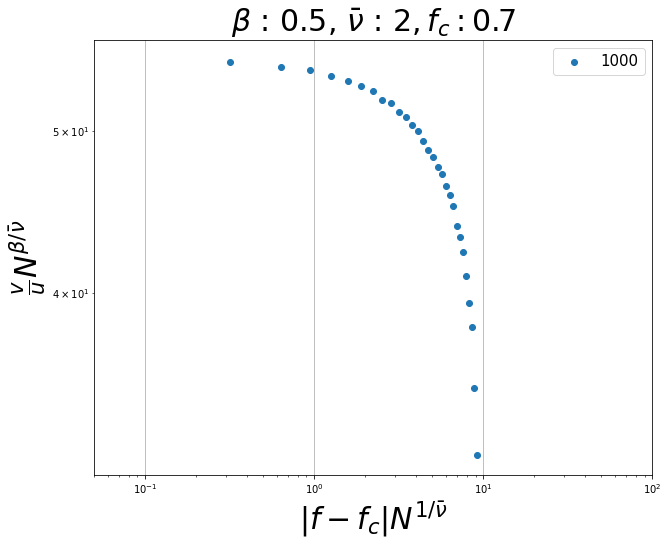

1.4


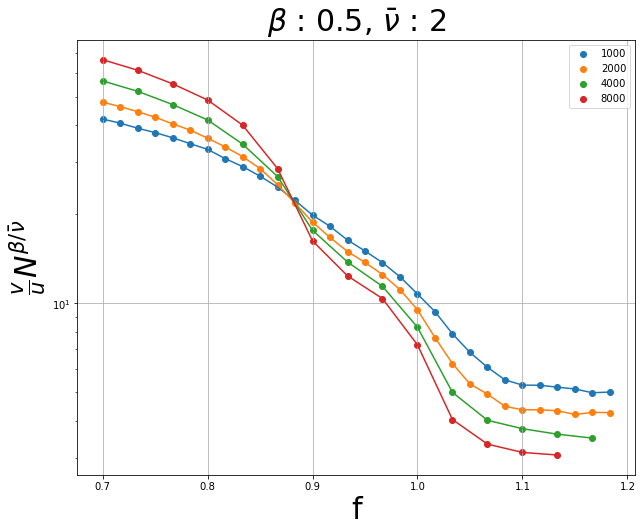

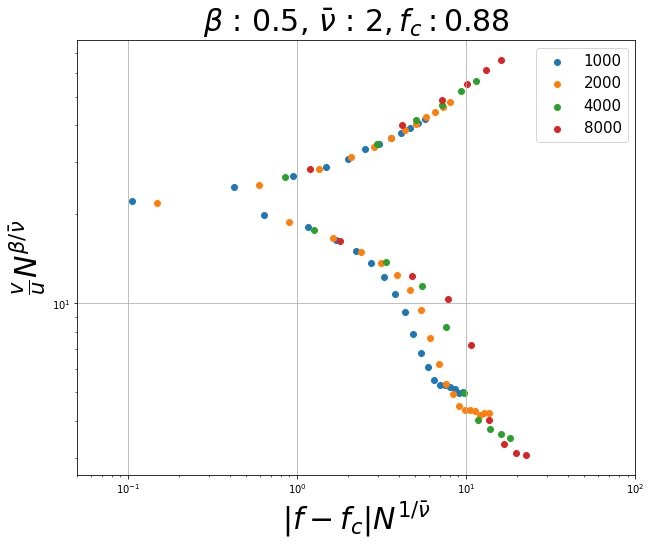

0.9


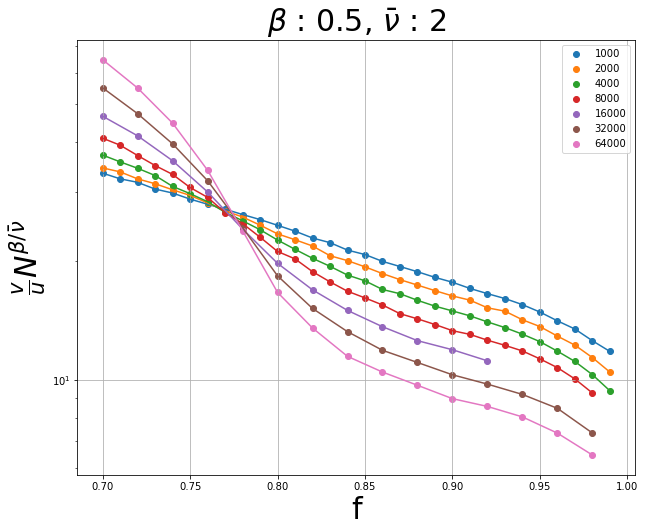

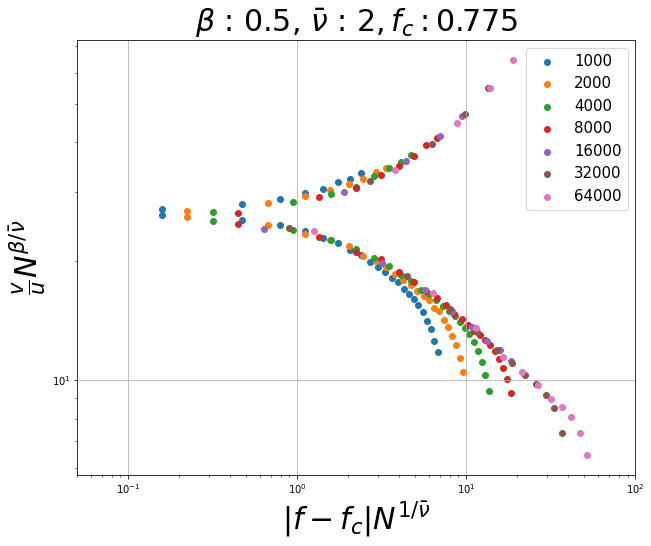

1.5


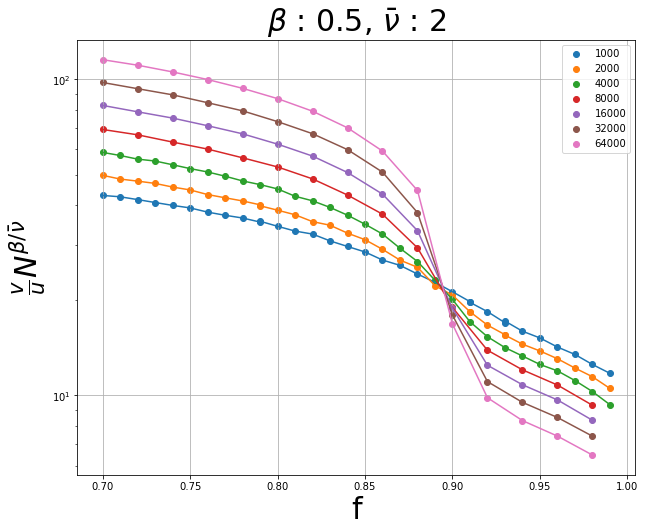

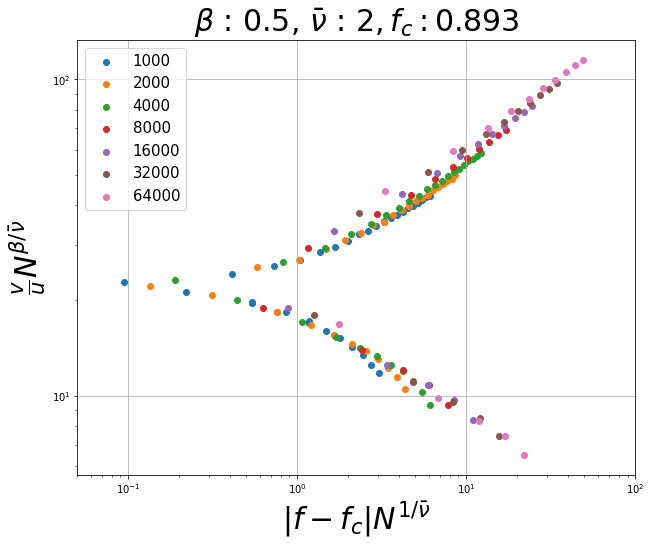

1.3


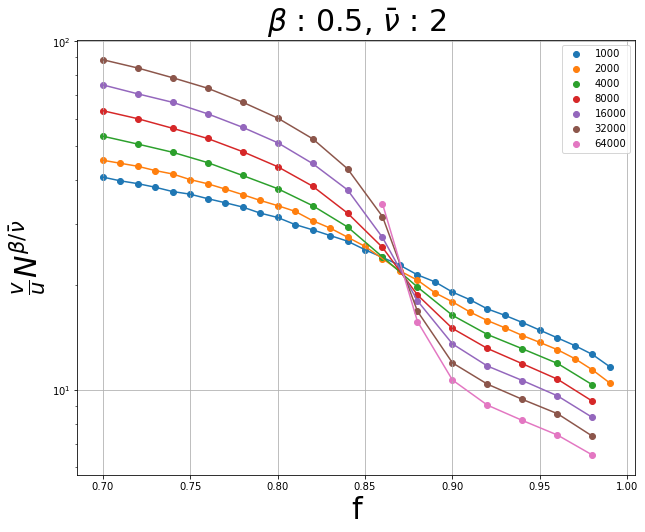

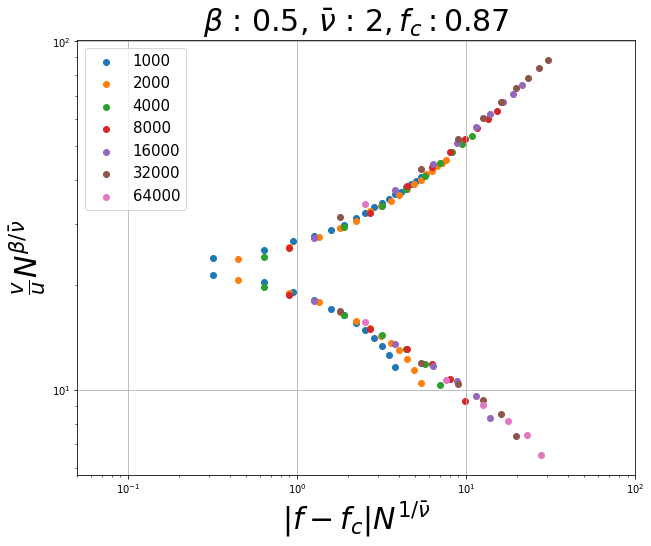

0.5


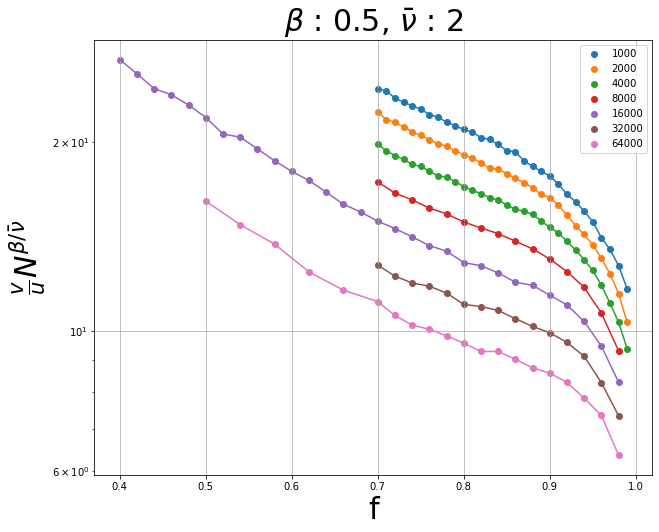

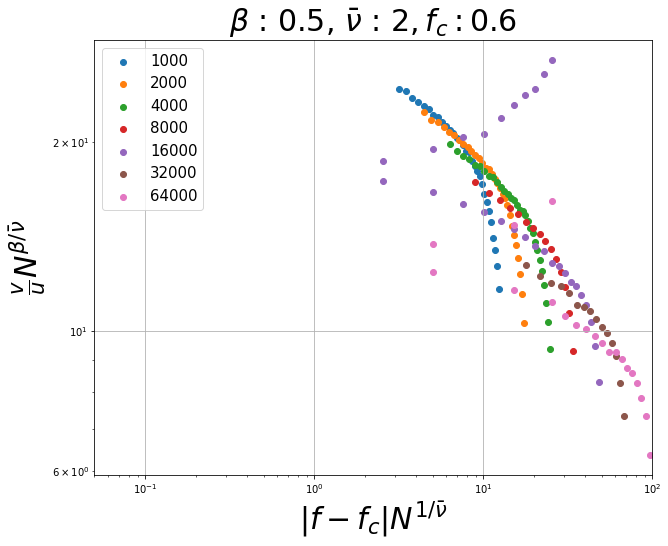

2


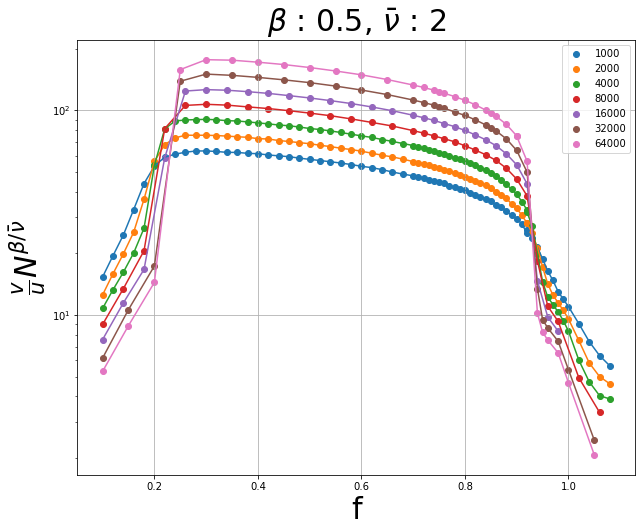

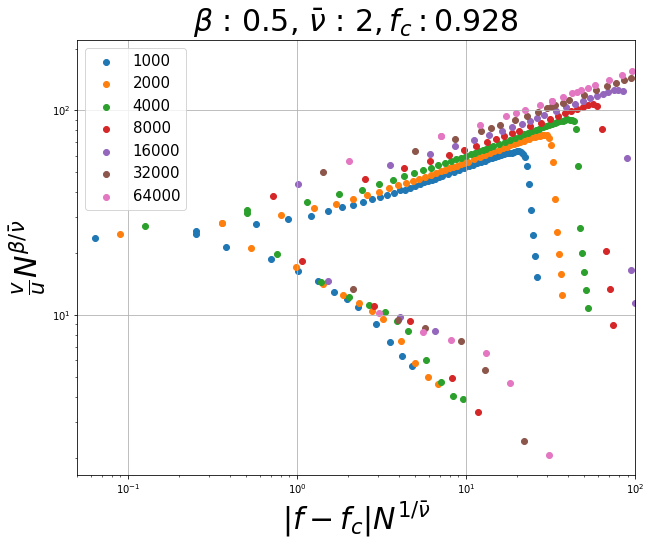

1


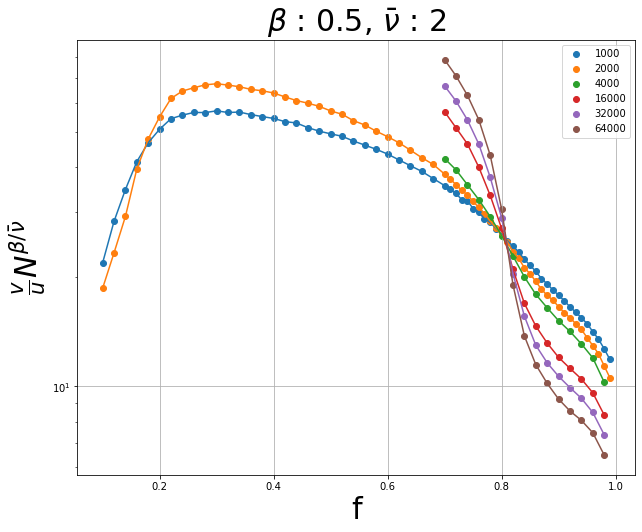

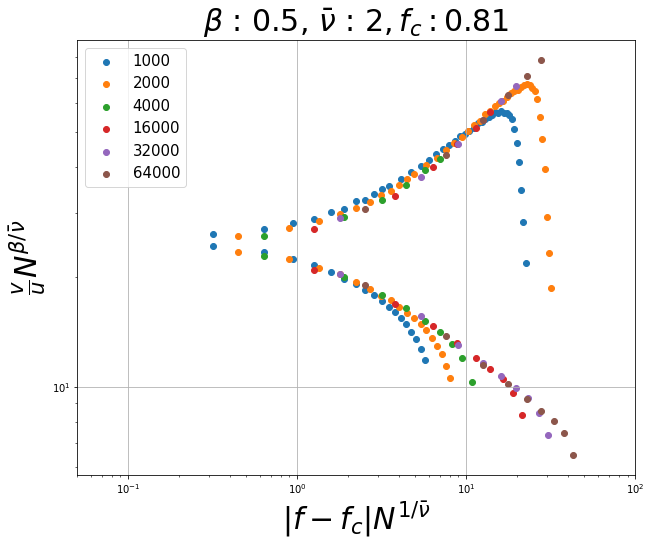

0.6


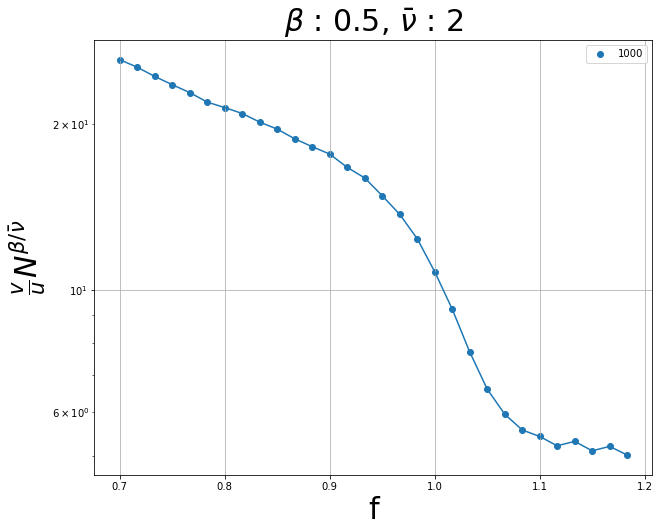

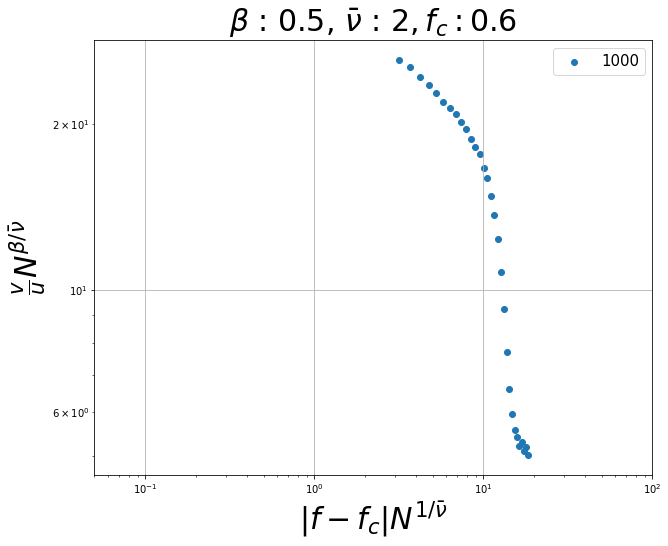

sin


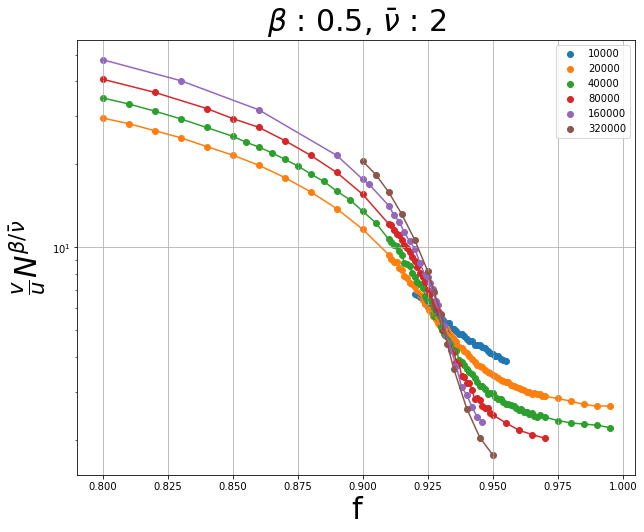

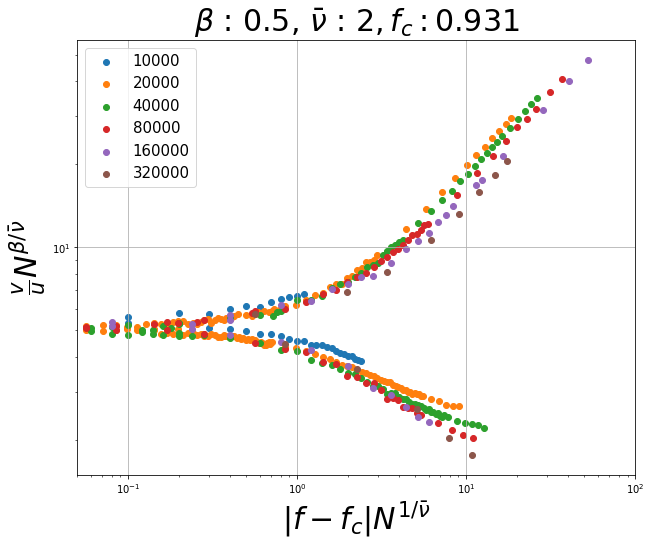

In [7]:
fc_dict = {'0.3':0.7,'0.5':0.6,'0.6':0.6,'0.7':0.65,'0.8':0.72,'0.9':0.775,'1':0.81,'1.1':0.83,'1.2':0.85,'1.3':0.87,'1.4':0.88,'1.5':0.893, '2':0.928,'3':0.977,'4':0.7,'sin':0.931}

for i in range(len(a_N_list)):
    a = a_N_list[i][0]
    N_list = a_N_list[i][1]
    print(a)
    means = Ameans[Ameans['a']==a]
    
    variable = 'N'
    var_list = N_list
    errorbar = False

#     window = (0.7,1)
#     # window = (0.95,1.05)
#     yindow = (-0.02,1)
    plt.rcParams["figure.figsize"] = (10,8)


#     for var in var_list:
#     #     if var<60:
#         x = means[means[variable]==var]['f'].values
#         y = means[means[variable]==var]['mean'].values/15
#         yerr = means[means[variable]==var]['meanerr'].values/15
#         plt.scatter(x,y, label =var)
# #         if errorbar:
# #             plt.errorbar(x,y,yerr ,uplims=True, lolims=True)
# #     #     plt.errorbar(means[means[variable]==var].sort_values(by=['f'],axis=0)['f'].values,means[means[variable]==var].sort_values(by=['f'],axis=0)['mean'].values/7.5,yerr=sds[sds[variable]==var].sort_values(by=['f'],axis=0)['sd'].values/15,uplims=True, lolims=True)
#         plt.plot(means[means[variable]==var].sort_values(by=['f'],axis=0)['f'].values,means[means[variable]==var].sort_values(by=['f'],axis=0)['mean'].values/15)

#     plt.ylabel('v/u', fontsize='15')
#     plt.xlabel('f', fontsize='15')
#     plt.grid()
#     plt.title(variable, fontsize='15')
#     # plt.ylim(0,0.5)
#     # plt.scatter(analytics['f'],analytics['velocity'],s=0.5,color='r', label='MFT')
#     plt.legend()
# #     plt.xlim(window)
# #     plt.ylim(yindow)

#     plt.show()


    for var in var_list:
        beta = 0.5
        nubar = 2
        x = means[means[variable]==var]['f'].values
        y = means[means[variable]==var]['mean'].values*var**(beta/nubar)


        plt.scatter(x,y, label =var)
        plt.plot(x[np.argsort(x)],y[np.argsort(x)])

    #     plt.scatter(xs,y, label =var)
    #     plt.plot(xs[np.argsort(x)],y[np.argsort(x)])

    plt.ylabel(r'$\frac{v}{u}N^{\beta/\bar\nu}$', fontsize='30')
    plt.xlabel('f', fontsize='30')
    plt.yscale('log')
    plt.grid()
    plt.legend()
    # plt.ylim(2,6.5)
    plt.title(r'$\beta$ : '+str(beta)+r', $\bar\nu$ : '+str(nubar),fontsize='30')
#     plt.xlim(0.85,1)
#     plt.xlim(window)

    plt.show()


    for var in var_list:

        fc = fc_dict[a]
    #     fc = 0.99
        beta = 0.5
        nubar = 2
        x = means[means[variable]==var]['f'].values
        y = means[means[variable]==var]['mean'].values*var**(beta/nubar)
        xs = np.abs(x-fc)*var**(1/nubar)

        plt.scatter(xs,y, label =var)
    #     plt.plot(xs[np.argsort(x)],y[np.argsort(x)])

    #     plt.scatter(xs,y, label =var)
    #     plt.plot(xs[np.argsort(x)],y[np.argsort(x)])

    plt.ylabel(r'$\frac{v}{u}N^{\beta/\bar\nu}$', fontsize='30')
    plt.xlabel(r'$|f-f_c|N^{1/\bar\nu}$', fontsize='30')
    plt.yscale('log')
    plt.xscale('log')
    plt.grid()
    plt.legend(fontsize='15')
#     plt.ylim(5,80)
    plt.title(r'$\beta$ : '+str(beta)+r', $\bar\nu$ : '+str(nubar)+r'$, f_c : $'+str(fc),fontsize='30')
#     plt.xlim(0.1,20)
    plt.xlim(0.05,100)

    plt.show()



ValueError: could not convert string to float: 'sin'

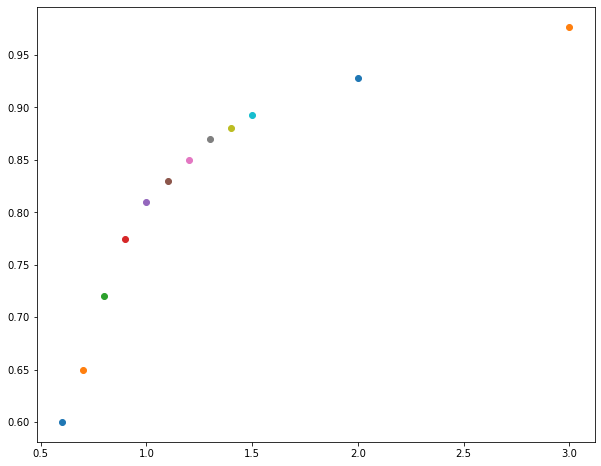

In [7]:
for a in fc_dict.items():
    if float(a[0])<0.55:
        continue
    if float(a[0])>3.3:
        continue

    plt.scatter(float(a[0]),a[1])

plt.show()

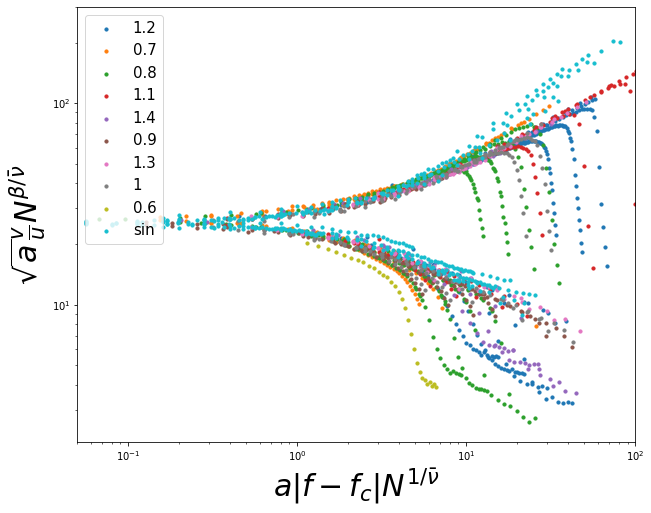

In [8]:
# a_list = ['0.7','0.9','1.1','1.3','1.5','2','sin']
a_list = ['0.6','0.7','0.8','0.9','1','1.1','1.2','1.3','1.4']


for i in range(len(a_N_list)):
    a = a_N_list[i][0]
    if a in a_list:
        N_list = a_N_list[i][1]
        means = Ameans[Ameans['a']==a]

        variable = 'N'
        var_list = N_list


        plt.rcParams["figure.figsize"] = (10,8)

        xshow = np.empty(0)
        yshow = np.empty(0)

        for var in var_list:

            fc = fc_dict[a]
        #     fc = 0.99
            beta = 0.5
            nubar = 2
            x = means[means[variable]==var]['f'].values
            aa = float(a)
          
            y = np.sqrt(aa)*means[means[variable]==var]['mean'].values*var**(beta/nubar)
            xs = aa**2*np.abs(x-fc)*var**(1/nubar)

            xshow = np.append(xshow,xs[:])
            yshow = np.append(yshow,y[:])

        plt.scatter(xshow,yshow, label =a, s=10)

        plt.ylabel(r'$\sqrt{a}\frac{v}{u}N^{\beta/\bar\nu}$', fontsize='30')
        plt.xlabel(r'$a|f-f_c|N^{1/\bar\nu}$', fontsize='30')
        plt.yscale('log')
        plt.xscale('log')
        plt.grid()
        plt.legend(fontsize='15')
        
    if a =='sin':
        N_list = a_N_list[i][1]
        means = Ameans[Ameans['a']==a]

        variable = 'N'
        var_list = N_list


        plt.rcParams["figure.figsize"] = (10,8)

        xshow = np.empty(0)
        yshow = np.empty(0)

        for var in var_list:

            fc = fc_dict[a]
        #     fc = 0.99
            beta = 0.5
            nubar = 2
            x = means[means[variable]==var]['f'].values
            y =5* means[means[variable]==var]['mean'].values*var**(beta/nubar)
            xs = 2*np.abs(x-fc)*var**(1/nubar)

            xshow = np.append(xshow,xs[:])
            yshow = np.append(yshow,y[:])

        plt.scatter(xshow,yshow, label =a, s=10)

        plt.ylabel(r'$\sqrt{a}\frac{v}{u}N^{\beta/\bar\nu}$', fontsize='30')
        plt.xlabel(r'$a|f-f_c|N^{1/\bar\nu}$', fontsize='30')
        plt.yscale('log')
        plt.xscale('log')
        plt.grid()
        plt.legend(fontsize='15')
        
#     plt.title(r'$\beta$ : '+str(beta)+r', $\bar\nu$ : '+str(nubar)+r'$, f_c : $'+str(fc),fontsize='30')

plt.xlim(0.05,100)
plt.show()


In [ ]:

for var in var_list:
#     if var<60:
    x = sds[sds[variable]==var]['f'].values
    y = sds[sds[variable]==var]['sd'].values
    yerr =sds[sds[variable]==var]['sderr'].values
    plt.scatter(x,y, label =var)
    if errorbar:
        plt.errorbar(x,y,yerr ,uplims=True, lolims=True)
    plt.plot(sds[sds[variable]==var].sort_values(by=['f'],axis=0)['f'].values,sds[sds[variable]==var].sort_values(by=['f'],axis=0)['sd'].values)

plt.ylabel('sd', fontsize='15')
plt.xlabel('f', fontsize='15')
plt.yscale('log')
plt.grid()
plt.legend()
plt.xlim(0.7,0.9)
plt.ylim(0.3,10)

plt.show()



for var in var_list:
#     if var<60:
    x = binders[binders[variable]==var]['f'].values
    y = binders[binders[variable]==var]['binder'].values
    yerr =binders[binders[variable]==var]['bindererr'].values
    plt.scatter(x,y, label =var)
    if errorbar:
        plt.errorbar(x,y,yerr ,uplims=True, lolims=True)
    plt.plot(binders[binders[variable]==var].sort_values(by=['f'],axis=0)['f'].values,binders[binders[variable]==var].sort_values(by=['f'],axis=0)['binder'].values)
    
plt.ylabel('binder', fontsize='15')
plt.xlabel('f', fontsize='15')
plt.legend()
plt.grid()
plt.ylim(-0.2,0.7)
plt.xlim(0.18,0.22)

plt.show()

In [8]:
import pandas as pd
import matplotlib.pyplot as plt
from tqdm import trange
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import os
%matplotlib inline

from collections import OrderedDict
import matplotlib as mpl


In [9]:
# path_dir = os.getcwd()+'/data/210125/N/'
path_dir = os.getcwd()+'/data/210430/a/0.9/N/'


mean_list=[]
kurt_list=[]
skew_list=[]
sd_list=[]
binder_list=[]
bimodal_list = []

N_list = os.listdir(path_dir)
temp_list = []
for N in N_list:
    try:
        N = int(N)
        if type(N)==int:
            temp_list.append(N)
    except ValueError:
        pass
    
N_list = sorted(map(int,N_list))
print(N_list)

for N in N_list:
    file_list=(os.listdir(path_dir+str(N)))
    
    for file in file_list:
        state = path_dir+str(N)+'/'+file
        load = np.load(state)
        f = float(file[:-4])

        mean = np.average(load['first'])
        meanerr = np.std(load['first'])
        sd   = np.sqrt(load['second']-load['first']**2)
        sdmean = np.average(sd)
        sderr = np.std(sd)
        skew = (load['third']-3*load['second']*load['first'] + 2*load['first']**3)/sd**3
        skewmean = np.average(skew)
        skewerr = np.std(skew)
        kurt = (load['fourth']-4*load['third']*load['first'] + 6*load['second']*load['first']**2 - 3*load['first']**4)/sd**4
        kurtmean = np.average(kurt)
        kurterr = np.std(kurt)


        binder = (1-load['fourth']/(3*load['second']**2))
        bindermean = np.average(binder)
        bindererr = np.std(binder)
        bimodal = (skew**2+1)/kurt
        bimodalmean = np.average(bimodal)
        bimodalerr = np.std(bimodal)
        
        mean_list.append(pd.DataFrame({'N':[N],'f':[f],'mean':[np.abs(mean)], 'meanerr':[meanerr]}))
        kurt_list.append(pd.DataFrame({'N':[N],'f':[f],'kurt':[kurtmean],'kurterr':[kurterr]}))
        skew_list.append(pd.DataFrame({'N':[N],'f':[f],'skew':[np.abs(skewmean)],'skewerr':[skewerr] }))

        sd_list.append(pd.DataFrame({'N':[N],'f':[f],'sd':[sdmean], 'sderr':[sderr]}))
        binder_list.append(pd.DataFrame({'N':[N],'f':[f],'binder':[bindermean], 'bindererr':[bindererr]}))
        bimodal_list.append(pd.DataFrame({'N':[N],'f':[f],'bimodal':[bimodalmean], 'bimodalerr':[bimodalerr]}))
        
        
means = pd.concat(mean_list)
sds = pd.concat(sd_list)
binders = pd.concat(binder_list)
bimodals = pd.concat(bimodal_list)

kurts = pd.concat(kurt_list)
skews = pd.concat(skew_list)

   

[1000, 2000, 4000, 8000, 16000, 32000, 64000]


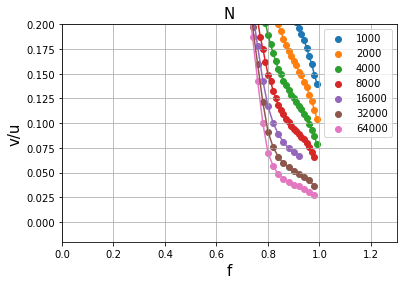

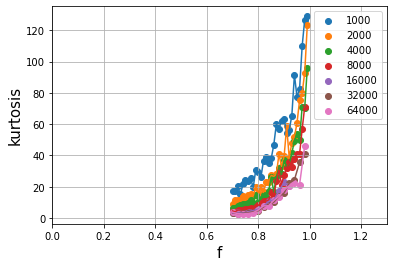

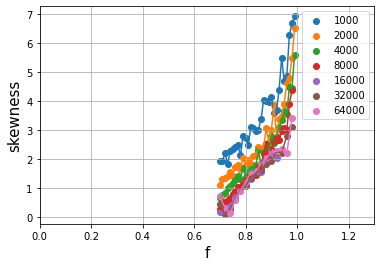

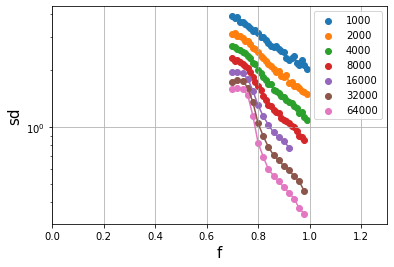

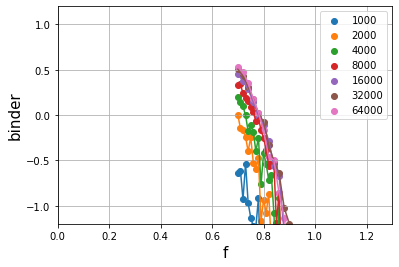

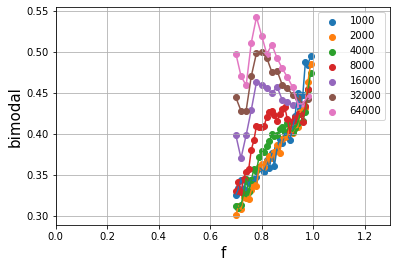

In [10]:
variable = 'N'
var_list = N_list
errorbar = False

window = (0,1.3)
# window = (0.9,1.1)
# yindow = (-0.02,0.1)
yindow = (-0.02,0.2)

for var in var_list:
#     if var<60:
    x = means[means[variable]==var]['f'].values
    y = means[means[variable]==var]['mean'].values/15
    yerr = means[means[variable]==var]['meanerr'].values/15
    plt.scatter(x,y, label =var)
    if errorbar:
        plt.errorbar(x,y,yerr ,uplims=True, lolims=True)
#     plt.errorbar(means[means[variable]==var].sort_values(by=['f'],axis=0)['f'].values,means[means[variable]==var].sort_values(by=['f'],axis=0)['mean'].values/7.5,yerr=sds[sds[variable]==var].sort_values(by=['f'],axis=0)['sd'].values/15,uplims=True, lolims=True)
    plt.plot(means[means[variable]==var].sort_values(by=['f'],axis=0)['f'].values,means[means[variable]==var].sort_values(by=['f'],axis=0)['mean'].values/15)
    
plt.ylabel('v/u', fontsize='15')
plt.xlabel('f', fontsize='15')
plt.grid()
plt.title(variable, fontsize='15')
# plt.ylim(0,0.5)
# plt.scatter(analytics['f'],analytics['velocity'],s=0.5,color='r', label='MFT')
plt.legend()
plt.xlim(window)
plt.ylim(yindow)

plt.show()
 
for var in var_list:
#     if var>8000:

    x = kurts[kurts[variable]==var]['f'].values
    y = kurts[kurts[variable]==var]['kurt'].values
    yerr = kurts[kurts[variable]==var]['kurterr'].values
    plt.scatter(x,y, label =var)
    if errorbar:
        plt.errorbar(x,y,yerr ,uplims=True, lolims=True)
    plt.plot(kurts[kurts[variable]==var].sort_values(by=['f'],axis=0)['f'].values,kurts[kurts[variable]==var].sort_values(by=['f'],axis=0)['kurt'].values)

    
plt.ylabel('kurtosis', fontsize='15')
plt.xlabel('f', fontsize='15')
# plt.yscale('log')
plt.grid()
plt.legend()
plt.xlim(window)

plt.show()


for var in var_list:
#     if var<60:

    x = skews[skews[variable]==var]['f'].values
    y = skews[skews[variable]==var]['skew'].values
    yerr = skews[skews[variable]==var]['skewerr'].values
    plt.scatter(x,y, label =var)
    if errorbar:
        plt.errorbar(x,y,yerr ,uplims=True, lolims=True)
    plt.plot(skews[skews[variable]==var].sort_values(by=['f'],axis=0)['f'].values,np.abs(skews[skews[variable]==var].sort_values(by=['f'],axis=0)['skew'].values))

    
plt.ylabel('skewness', fontsize='15')
plt.xlabel('f', fontsize='15')
# plt.yscale('log')
plt.grid()
plt.legend()
plt.xlim(window)

plt.show()

# for var in var_list:
# #     if var<60:
#     x = sds[sds[variable]==var]['f'].values
#     y = sds[sds[variable]==var]['sd'].values/means[means[variable]==var]['mean'].values
#     plt.scatter(x,y, label =var)
    
#     plt.plot(sds[sds[variable]==var].sort_values(by=['f'],axis=0)['f'].values,sds[sds[variable]==var].sort_values(by=['f'],axis=0)['sd'].values/means[means[variable]==var].sort_values(by=['f'],axis=0)['mean'].values)
    
# plt.ylabel('sd/mean', fontsize='15')
# plt.xlabel('f', fontsize='15')
# # plt.yscale('log')
# plt.grid()
# plt.legend()
# plt.xlim(window)

# plt.show()



for var in var_list:
#     if var<60:
    x = sds[sds[variable]==var]['f'].values
    y = sds[sds[variable]==var]['sd'].values
    yerr =sds[sds[variable]==var]['sderr'].values
    plt.scatter(x,y, label =var)
    if errorbar:
        plt.errorbar(x,y,yerr ,uplims=True, lolims=True)
    plt.plot(sds[sds[variable]==var].sort_values(by=['f'],axis=0)['f'].values,sds[sds[variable]==var].sort_values(by=['f'],axis=0)['sd'].values)

plt.ylabel('sd', fontsize='15')
plt.xlabel('f', fontsize='15')
plt.yscale('log')
plt.grid()
plt.legend()
plt.xlim(window)

plt.show()



for var in var_list:
#     if var<60:
    x = binders[binders[variable]==var]['f'].values
    y = binders[binders[variable]==var]['binder'].values
    yerr =binders[binders[variable]==var]['bindererr'].values
    plt.scatter(x,y, label =var)
    if errorbar:
        plt.errorbar(x,y,yerr ,uplims=True, lolims=True)
    plt.plot(binders[binders[variable]==var].sort_values(by=['f'],axis=0)['f'].values,binders[binders[variable]==var].sort_values(by=['f'],axis=0)['binder'].values)
    
plt.ylabel('binder', fontsize='15')
plt.xlabel('f', fontsize='15')
plt.legend()
plt.grid()
plt.ylim(-1.2,1.2)
plt.xlim(window)

plt.show()

for var in var_list:
#     if var<60:
    x = bimodals[bimodals[variable]==var]['f'].values
    y = bimodals[bimodals[variable]==var]['bimodal'].values
    yerr =bimodals[bimodals[variable]==var]['bimodalerr'].values
    plt.scatter(x,y, label =var)
    if errorbar:
        plt.errorbar(x,y,yerr ,uplims=True, lolims=True)
    plt.plot(bimodals[bimodals[variable]==var].sort_values(by=['f'],axis=0)['f'].values,bimodals[bimodals[variable]==var].sort_values(by=['f'],axis=0)['bimodal'].values)

    
plt.ylabel('bimodal', fontsize='15')
plt.xlabel('f', fontsize='15')
plt.legend()
plt.grid()
plt.xlim(window)

plt.show()

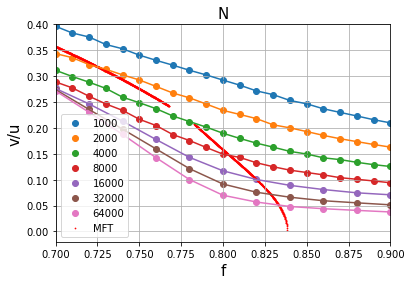

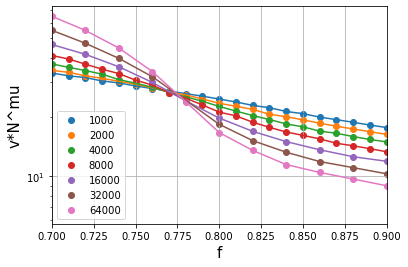

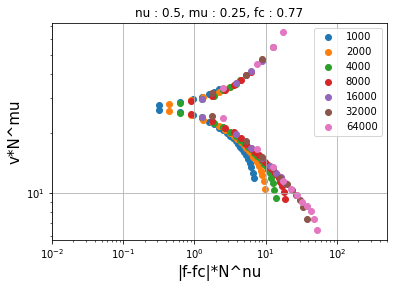

In [11]:
variable = 'N'
var_list = N_list
errorbar = False

window = (0.7,0.9)
# window = (0.95,1.05)
yindow = (-0.02,0.4)

for var in var_list:
#     if var<60:
    x = means[means[variable]==var]['f'].values
    y = means[means[variable]==var]['mean'].values/15
    yerr = means[means[variable]==var]['meanerr'].values/15
    plt.scatter(x,y, label =var)
    if errorbar:
        plt.errorbar(x,y,yerr ,uplims=True, lolims=True)
#     plt.errorbar(means[means[variable]==var].sort_values(by=['f'],axis=0)['f'].values,means[means[variable]==var].sort_values(by=['f'],axis=0)['mean'].values/7.5,yerr=sds[sds[variable]==var].sort_values(by=['f'],axis=0)['sd'].values/15,uplims=True, lolims=True)
    plt.plot(means[means[variable]==var].sort_values(by=['f'],axis=0)['f'].values,means[means[variable]==var].sort_values(by=['f'],axis=0)['mean'].values/15)
    
plt.ylabel('v/u', fontsize='15')
plt.xlabel('f', fontsize='15')
plt.grid()
plt.title(variable, fontsize='15')
# plt.ylim(0,0.5)
plt.scatter(analytics['f'],analytics['velocity'],s=0.5,color='r', label='MFT')
plt.legend()
plt.xlim(window)
plt.ylim(yindow)

plt.show()


for var in var_list:
    mu = 0.25
    x = means[means[variable]==var]['f'].values
    y = means[means[variable]==var]['mean'].values*var**mu
    
    
    plt.scatter(x,y, label =var)
    plt.plot(x[np.argsort(x)],y[np.argsort(x)])
    
#     plt.scatter(xs,y, label =var)
#     plt.plot(xs[np.argsort(x)],y[np.argsort(x)])
    
plt.ylabel('v*N^mu', fontsize='15')
plt.xlabel('f', fontsize='15')
plt.yscale('log')
plt.grid()
plt.legend()
# plt.ylim(2,6.5)
plt.xlim(window)

plt.show()


for var in var_list:
    fc = 0.77
#     fc = 0.99
    nu = 0.5
    mu = 0.25
    x = means[means[variable]==var]['f'].values
    y = means[means[variable]==var]['mean'].values*var**mu
    xs = np.abs(x-fc)*var**nu
    
    plt.scatter(xs,y, label =var)
#     plt.plot(xs[np.argsort(x)],y[np.argsort(x)])
    
#     plt.scatter(xs,y, label =var)
#     plt.plot(xs[np.argsort(x)],y[np.argsort(x)])
    
plt.ylabel('v*N^mu', fontsize='15')
plt.xlabel('|f-fc|*N^nu', fontsize='15')
plt.yscale('log')
plt.xscale('log')
plt.grid()
plt.legend()
# plt.ylim(2,6.5)
plt.title('nu : '+str(nu)+', mu : '+str(mu)+', fc : '+str(fc))
plt.xlim(0.01,500)

plt.show()



# for var in var_list:
#     fc = 1.004
#     nu = 0.5
#     mu = 0.25
#     x = means[means[variable]==var]['f'].values
#     y = means[means[variable]==var]['mean'].values*var**mu
#     xs = np.abs(x-fc)*var**nu
    
#     plt.scatter(xs,y, label =var)
#     plt.plot(xs[np.argsort(x)],y[np.argsort(x)])
    
# #     plt.scatter(xs,y, label =var)
# #     plt.plot(xs[np.argsort(x)],y[np.argsort(x)])
    
# plt.ylabel('v*N^mu', fontsize='15')
# plt.xlabel('|f-fc|*N^nu', fontsize='15')
# plt.yscale('log')
# plt.xscale('log')
# plt.grid()
# plt.legend()
# # plt.ylim(2,6.5)
# plt.title('nu : '+str(nu)+', mu : '+str(mu)+', fc : '+str(fc))
# plt.xlim(0.1,50)

# plt.show()

  1%|          | 12/1000 [00:00<00:09, 109.74it/s]

alpha*delta_time =  0.1  is not small enough. Increase the N_time for accurate simulation
RTP model initialized


  0%|          | 0/500 [00:00<?, ?it/s]

f =  0.8


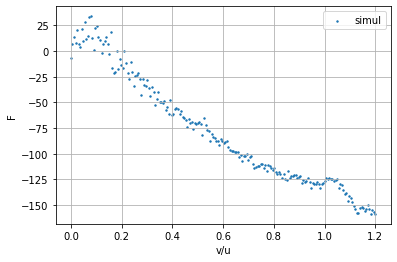

  0%|          | 1/500 [00:15<2:09:37, 15.59s/it]

f =  0.8


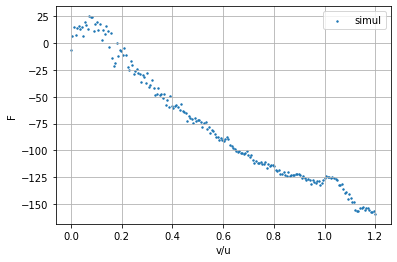

  0%|          | 2/500 [00:31<2:09:04, 15.55s/it]

f =  0.8


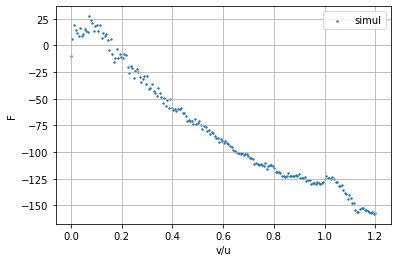

  1%|          | 3/500 [00:46<2:08:43, 15.54s/it]

f =  0.8


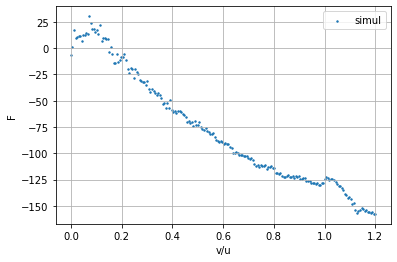

  1%|          | 4/500 [01:12<2:29:50, 18.13s/it]


KeyboardInterrupt: 

In [9]:
n_batch = 200
n_particle=1000
a=1
muFu = 0.8
repeat=500


R2 = RTP_lab(alpha=1, u=10, len_time=100, N_time=10,N_X=n_batch, N_ptcl=n_particle, mu=1, model=2)

R2.u = a*R2.l/2
R2.F = muFu*R2.u/R2.mu

R2.set_zero()

R2.v = np.linspace(0,R2.u*(1.2),n_batch)   # each value gives the velocity to be applied for each batches
            
    
for __ in trange(int(R2.N_simul)):   # to stable distribution
    R2.time_evolve()
        
    F_v = np.zeros(n_batch)
            
#     error_measure = np.empty(repeat)
        
# computation part with time evolving
for rep in trange(repeat):
                
    for __ in range(R2.N_simul):   # long enough time
        F_v += np.sum(R2.partial_V(R2.x),axis=0)              # summing the V' at each x
        R2.time_evolve()
                                      # averaging over time
        F_simul = (R2.L/R2.N_ptcl) *F_v/((rep+1)*R2.N_simul)
#         F_theo = theo_F(R2,a,R2.v/R2.u)
#         F_error = F_simul-F_theo
                    
#         error_measure[rep] = np.sqrt(np.average(F_error**2))
            
            
#     if rep%20==0:
                    
    print('f = ',muFu)
    plt.scatter( R2.v/R2.u, F_simul, s=2,label='simul')
                
                
#         vu_axis = np.linspace(0,0.999-muFu,10000)
#         F_avg_axis = theo_F(R2,a,vu_axis)
#         plt.plot(vu_axis,F_avg_axis, label='theory', c='r')
                
    plt.ylabel('F')
    plt.xlabel('v/u')
    #plt.title(self.title)
    plt.grid(True)
    plt.legend()
    plt.show()
                
#         plt.plot(error_measure[:rep+1])
#         plt.xscale('log')
#         plt.yscale('log')
#         plt.show()

In [13]:
def muF(f,r,a,R):   # self consistent gamma v, R=L/l,,, using v/u as velocity
    wp = -(f-r)/(a*(1-(f-r)**2))
    wm = -(f+r)/(a*(1-(f+r)**2))
    w0 = -r*(R-1)/(a*(1-r**2))
    
    A = np.exp(w0)
    B = np.exp(wm)
    C0 = np.exp(-wp)
    
    a1 = (R-1)/(a*r*(1-r**2)) + (A-1)/r**2
    a2 = a1
    a3 = B*C0*(1-A)**2/r**2
    a4 = (A-1)*(1-C0)/(r*(f-r))
    a5 = -C0*(A-1)*(1-B)/(r*(f+r))
    a6 = B*(C0-1)*(1-A)/(r*(f-r))
    a7 = -(B-1)*(1-A)/(r*(f+r))
    a8 = -1/(a*(1-(f-r)**2)*(f-r))  + (C0-1)/(f-r)**2
    a9 = 1/(a*(1-(f+r)**2)*(f+r)) + (B-1)/(f+r)**2
    a10 = -(B-1)*(C0-1)/((f+r)*(f-r))
    
    A1 = a1+a2+a3+a4+a5+a6+a7+a8+a9+a10
    GL = 2*w0+wm-wp
    AL = 1-np.exp(-GL)
    A2 = (1/AL)*((1-A)*B/r+(1-B)/(f+r)-(1/C0-1)/(f-r)+(1/A-1)/(r*C0))*(-(1-1/A)/(r*B)-(1-1/B)/(f+r)  + (C0-1)/(f-r) -(A-1)*C0/r)
    
    FA = -2*R*(2*R/(a*(A2-A1-GL)) +r)/a
    FB = -f*r*(-(1-np.exp((f-r)/(a*(1-(f-r)**2))))*(1-(f-r)**2)/(f-r)**2   - 1/(a*(f-r))  -(1-np.exp((f-r)/(a*(1-(f-r)**2))))*(1-(f-r)**2)/((f-r)*(1-f+r))  - 1/(a*(f+r))  - (1-np.exp((f+r)/(a*(1-(f+r)**2))))*(1-(f+r)**2)/(f+r)**2   + (1-np.exp((f+r)/(a*1-(f+r)**2)))*(1-(f+r)**2)/((f+r)*(1+f+r))+  ((1-r)/f)*(f+np.exp((f+r)/(a*(1-(f+r)**2)))*(1-f-r)  + (-1+r**2)/r   +(1-np.exp((f+r)/(a*1-(f+r)**2)))*(1-(f+r)**2) ))
    
    phaseA = f+r <=1
    phaseB = f+r>1
    return phaseA*FA + phaseB*FB

def consistency_r(f,a,R,gamma):
    r_axis = np.linspace(0.0001,1,5000)
    f_r = muF(f,r_axis,a,R)
    f_gamma = gamma*r_axis
    
    det = f_r-f_gamma>0
    return r_axis[:-1][det[1:]!=det[:-1]]
#muF = gamma r

rho=1
R=10
a=1
gamma=1/(rho*15)
analytic=[]
f_axis = np.linspace(0.0001,1,10000)
gamma = 1/(rho*15)
for f in f_axis:
    velocity = consistency_r(f,a,R,gamma)
    for v in velocity:
        if np.abs(v+f-1)>0.01:
            analytic.append(pd.DataFrame({'velocity':[v],'f':[f],'rho':[rho]}))
#         plt.scatter(f*np.ones(len(consistency_r(f,a,R,gamma))),consistency_r(f,a,R,gamma), color='r', label=R)
analytics = pd.concat(analytic)
analytics

/home/siksik/anaconda3/envs/siksik/lib/python3.7/site-packages/ipykernel_launcher.py:4: RuntimeWarning: divide by zero encountered in true_divide
  after removing the cwd from sys.path.
/home/siksik/anaconda3/envs/siksik/lib/python3.7/site-packages/ipykernel_launcher.py:7: RuntimeWarning: overflow encountered in exp
  import sys
/home/siksik/anaconda3/envs/siksik/lib/python3.7/site-packages/ipykernel_launcher.py:10: RuntimeWarning: divide by zero encountered in true_divide
  # Remove the CWD from sys.path while we load stuff.
/home/siksik/anaconda3/envs/siksik/lib/python3.7/site-packages/ipykernel_launcher.py:12: RuntimeWarning: invalid value encountered in multiply
  if sys.path[0] == '':
/home/siksik/anaconda3/envs/siksik/lib/python3.7/site-packages/ipykernel_launcher.py:13: RuntimeWarning: invalid value encountered in true_divide
  del sys.path[0]
/home/siksik/anaconda3/envs/siksik/lib/python3.7/site-packages/ipykernel_launcher.py:14: RuntimeWarning: invalid value encountered in mul

,velocity,f,rho
0,0.985999,0.0001,1
0,0.985999,0.0002,1
0,0.985999,0.0003,1
0,0.985999,0.0004,1
0,0.985999,0.0005,1
...,...,...,...
0,0.014101,0.8380,1
0,0.012301,0.8381,1
0,0.010101,0.8382,1
0,0.007301,0.8383,1


In [7]:
# gamma = 1/150
# a=1
# R=10

# R_list = [4/3,2, 8/3,10/3,4,8,16,32]
# rho_list = [0.3125,0.625,1.25,2.5,5,10,20,40]

# analytic = []
# R=10
# f_axis = np.linspace(0.0001,1,10000)
# for rho in rho_list:
#     gamma = 1/(rho*15)
#     for f in f_axis:
#         velocity = consistency_r(f,a,R,gamma)
#         for v in velocity:
#             if np.abs(v+f-1)>0.01:
#                 analytic.append(pd.DataFrame({'velocity':[v],'f':[f],'rho':[rho]}))
# #         plt.scatter(f*np.ones(len(consistency_r(f,a,R,gamma))),consistency_r(f,a,R,gamma), color='r', label=R)
# analytics = pd.concat(analytic)
# analytics

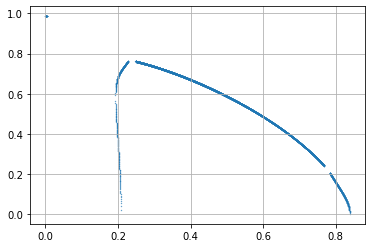

In [8]:
plt.scatter(analytics['f'],analytics['velocity'],s=0.1)
plt.grid()
plt.show()

In [22]:
N_list = [2000,4000,8000,16000,32000,64000,128000,250000,500000]
# N_list = [32000,64000]

# N_list = [16000,32000,64000,128000,256000]

L_list = [40,60,80,100,120,240,480,960]
rho_list = [0.3125,0.625,1.25,2.5,5,10,20,40,80,160]
# path_dir = os.getcwd()+'/data/1231/'   #near critical point
path_dir = os.getcwd()+'/data/210125_1/'   # first order transition
# path_dir = os.getcwd()+'/data/210125/'   # critical transition

Fs=10000
dt = 1/Fs

In [23]:
mean_list=[]
kurt_list=[]
skew_list=[]
sd_list=[]
binder_list=[]
bimodal_list = []

for N in N_list:
    file_list=(os.listdir(path_dir+'N/'+str(N)))
    
    for file in file_list:
        state = path_dir+'N/'+str(N)+'/'+file
        load = np.load(state)
        f = float(file[:-4])

        mean = np.average(load['first'])
        meanerr = np.std(load['first'])
        sd   = np.sqrt(load['second']-load['first']**2)
        sdmean = np.average(sd)
        sderr = np.std(sd)
        skew = (load['third']-3*load['second']*load['first'] + 2*load['first']**3)/sd**3
        skewmean = np.average(skew)
        skewerr = np.std(skew)
        kurt = (load['fourth']-4*load['third']*load['first'] + 6*load['second']*load['first']**2 - 3*load['first']**4)/sd**4
        kurtmean = np.average(kurt)
        kurterr = np.std(kurt)


        binder = (1-load['fourth']/(3*load['second']**2))
        bindermean = np.average(binder)
        bindererr = np.std(binder)
        bimodal = (skew**2+1)/kurt
        bimodalmean = np.average(bimodal)
        bimodalerr = np.std(bimodal)
        
        mean_list.append(pd.DataFrame({'N':[N],'f':[f],'mean':[np.abs(mean)], 'meanerr':[meanerr]}))
        kurt_list.append(pd.DataFrame({'N':[N],'f':[f],'kurt':[kurtmean],'kurterr':[kurterr]}))
        skew_list.append(pd.DataFrame({'N':[N],'f':[f],'skew':[np.abs(skewmean)],'skewerr':[skewerr] }))

        sd_list.append(pd.DataFrame({'N':[N],'f':[f],'sd':[sdmean], 'sderr':[sderr]}))
        binder_list.append(pd.DataFrame({'N':[N],'f':[f],'binder':[bindermean], 'bindererr':[bindererr]}))
        bimodal_list.append(pd.DataFrame({'N':[N],'f':[f],'bimodal':[bimodalmean], 'bimodalerr':[bimodalerr]}))
        
        
means = pd.concat(mean_list)
sds = pd.concat(sd_list)
binders = pd.concat(binder_list)
bimodals = pd.concat(bimodal_list)

kurts = pd.concat(kurt_list)
skews = pd.concat(skew_list)

   

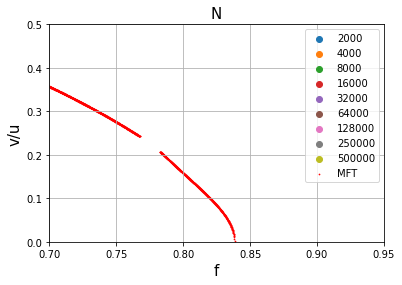

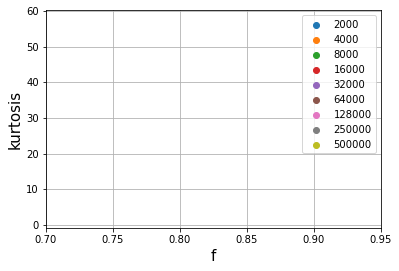

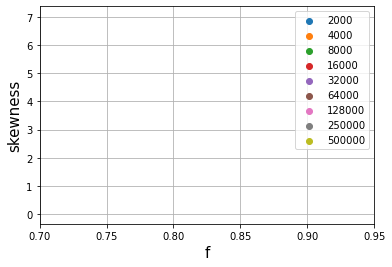

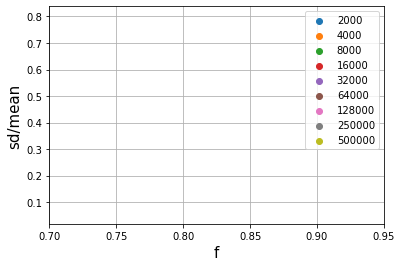

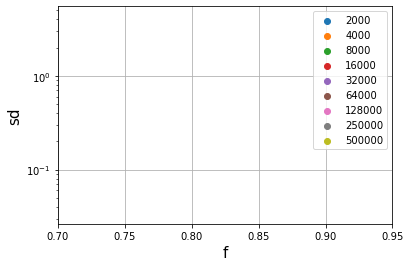

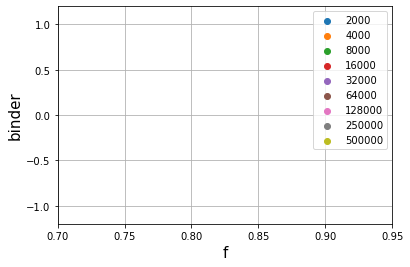

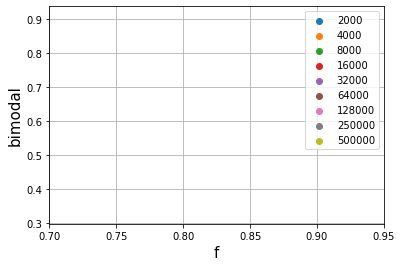

In [24]:
variable = 'N'
var_list = N_list
errorbar = False

window = (0.7,0.95)
# window = (0.175,0.225)
# window=(0,1)
for var in var_list:
#     if var<60:
    x = means[means[variable]==var]['f'].values
    y = means[means[variable]==var]['mean'].values/15
    yerr = means[means[variable]==var]['meanerr'].values/15
    plt.scatter(x,y, label =var)
    if errorbar:
        plt.errorbar(x,y,yerr ,uplims=True, lolims=True)
#     plt.errorbar(means[means[variable]==var].sort_values(by=['f'],axis=0)['f'].values,means[means[variable]==var].sort_values(by=['f'],axis=0)['mean'].values/7.5,yerr=sds[sds[variable]==var].sort_values(by=['f'],axis=0)['sd'].values/15,uplims=True, lolims=True)
    plt.plot(means[means[variable]==var].sort_values(by=['f'],axis=0)['f'].values,means[means[variable]==var].sort_values(by=['f'],axis=0)['mean'].values/15)
    
plt.ylabel('v/u', fontsize='15')
plt.xlabel('f', fontsize='15')
plt.grid()
plt.title(variable, fontsize='15')
plt.ylim(0,0.5)
plt.scatter(analytics['f'],analytics['velocity'],s=0.5,color='r', label='MFT')
plt.legend()
plt.xlim(window)

plt.show()
 
for var in var_list:
#     if var>8000:

    x = kurts[kurts[variable]==var]['f'].values
    y = kurts[kurts[variable]==var]['kurt'].values
    yerr = kurts[kurts[variable]==var]['kurterr'].values
    plt.scatter(x,y, label =var)
    if errorbar:
        plt.errorbar(x,y,yerr ,uplims=True, lolims=True)
    plt.plot(kurts[kurts[variable]==var].sort_values(by=['f'],axis=0)['f'].values,kurts[kurts[variable]==var].sort_values(by=['f'],axis=0)['kurt'].values)

    
plt.ylabel('kurtosis', fontsize='15')
plt.xlabel('f', fontsize='15')
# plt.yscale('log')
plt.grid()
plt.legend()
plt.xlim(window)

plt.show()


for var in var_list:
#     if var<60:

    x = skews[skews[variable]==var]['f'].values
    y = skews[skews[variable]==var]['skew'].values
    yerr = skews[skews[variable]==var]['skewerr'].values
    plt.scatter(x,y, label =var)
    if errorbar:
        plt.errorbar(x,y,yerr ,uplims=True, lolims=True)
    plt.plot(skews[skews[variable]==var].sort_values(by=['f'],axis=0)['f'].values,np.abs(skews[skews[variable]==var].sort_values(by=['f'],axis=0)['skew'].values))

    
plt.ylabel('skewness', fontsize='15')
plt.xlabel('f', fontsize='15')
# plt.yscale('log')
plt.grid()
plt.legend()
plt.xlim(window)

plt.show()

for var in var_list:
#     if var<60:
    x = sds[sds[variable]==var]['f'].values
    y = sds[sds[variable]==var]['sd'].values/means[means[variable]==var]['mean'].values
    plt.scatter(x,y, label =var)
    
    plt.plot(sds[sds[variable]==var].sort_values(by=['f'],axis=0)['f'].values,sds[sds[variable]==var].sort_values(by=['f'],axis=0)['sd'].values/means[means[variable]==var].sort_values(by=['f'],axis=0)['mean'].values)
    
plt.ylabel('sd/mean', fontsize='15')
plt.xlabel('f', fontsize='15')
# plt.yscale('log')
plt.grid()
plt.legend()
plt.xlim(window)

plt.show()



for var in var_list:
#     if var<60:
    x = sds[sds[variable]==var]['f'].values
    y = sds[sds[variable]==var]['sd'].values
    yerr =sds[sds[variable]==var]['sderr'].values
    plt.scatter(x,y, label =var)
    if errorbar:
        plt.errorbar(x,y,yerr ,uplims=True, lolims=True)
    plt.plot(sds[sds[variable]==var].sort_values(by=['f'],axis=0)['f'].values,sds[sds[variable]==var].sort_values(by=['f'],axis=0)['sd'].values)

plt.ylabel('sd', fontsize='15')
plt.xlabel('f', fontsize='15')
plt.yscale('log')
plt.grid()
plt.legend()
plt.xlim(window)

plt.show()



for var in var_list:
#     if var<60:
    x = binders[binders[variable]==var]['f'].values
    y = binders[binders[variable]==var]['binder'].values
    yerr =binders[binders[variable]==var]['bindererr'].values
    plt.scatter(x,y, label =var)
    if errorbar:
        plt.errorbar(x,y,yerr ,uplims=True, lolims=True)
    plt.plot(binders[binders[variable]==var].sort_values(by=['f'],axis=0)['f'].values,binders[binders[variable]==var].sort_values(by=['f'],axis=0)['binder'].values)
    
plt.ylabel('binder', fontsize='15')
plt.xlabel('f', fontsize='15')
plt.legend()
plt.grid()
plt.ylim(-1.2,1.2)
plt.xlim(window)

plt.show()

for var in var_list:
#     if var<60:
    x = bimodals[bimodals[variable]==var]['f'].values
    y = bimodals[bimodals[variable]==var]['bimodal'].values
    yerr =bimodals[bimodals[variable]==var]['bimodalerr'].values
    plt.scatter(x,y, label =var)
    if errorbar:
        plt.errorbar(x,y,yerr ,uplims=True, lolims=True)
    plt.plot(bimodals[bimodals[variable]==var].sort_values(by=['f'],axis=0)['f'].values,bimodals[bimodals[variable]==var].sort_values(by=['f'],axis=0)['bimodal'].values)

    
plt.ylabel('bimodal', fontsize='15')
plt.xlabel('f', fontsize='15')
plt.legend()
plt.grid()
plt.xlim(window)

plt.show()

0.195.npz
0.191.npz
0.196.npz
0.19.npz
['0.19', '0.191', '0.195', '0.196']
L : 300, N : 512000, f : 0.19a :1


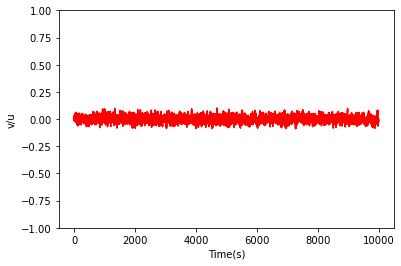

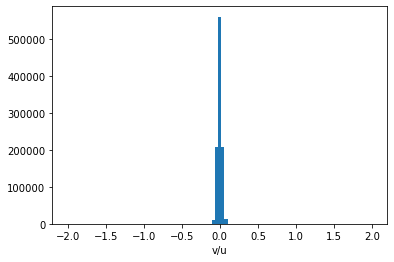

L : 300, N : 512000, f : 0.191a :1


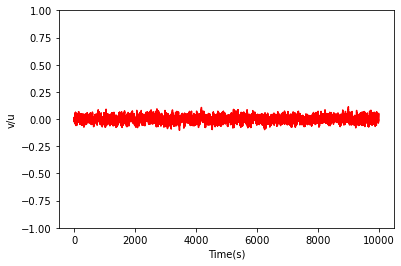

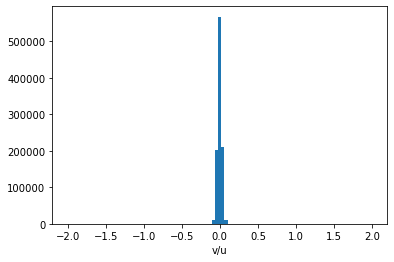

L : 300, N : 512000, f : 0.195a :1


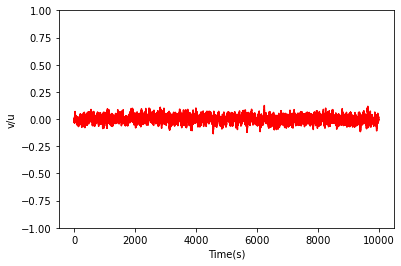

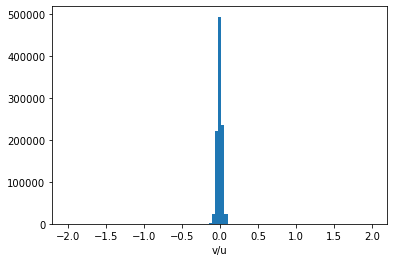

L : 300, N : 512000, f : 0.196a :1


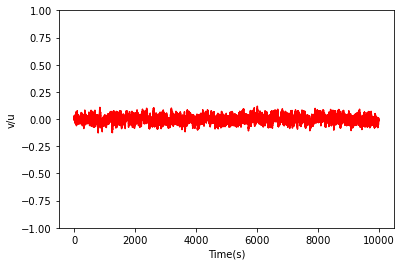

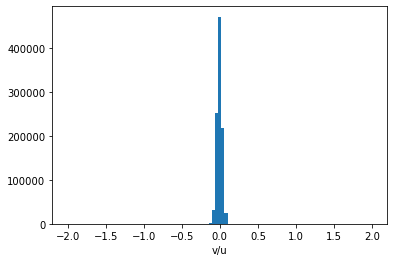

In [12]:
path_dir = os.getcwd()+'/data/away/210215/512000/'
Fs=100
dt = 1/Fs

file_list=os.listdir(path_dir)

sorted_list = []
for file in file_list:
    print(file)
    sorted_list.append(file[:-4])
    
sorted_list = sorted(sorted_list)
    
print(sorted_list)



for file in sorted_list:
# for i in range(12):
#     file = str(1000*i**2)+'.npz'
    file +='.npz'
    state = path_dir+file
    load = np.load(state)
    time = np.arange(len(load['v']))*dt

    print(load['description'])
    t = len(load['v'])

    # Plot the position
    plt.plot(np.arange(t)*dt, load['v']/15, 'r-')
    plt.xlabel('Time(s)')
    plt.ylabel('v/u')
    plt.ylim(-1,1)

    plt.show()
    
    
      
    
#         # Plot the position
#     plt.plot(np.arange(t)*dt, load['X'],  label='X')
#     plt.xlabel('Time(s)')
#     plt.ylabel('X')
#     plt.ylim(-150,150)

#     plt.show()


        
    plt.hist(load['v']/15,bins = np.linspace(-2,2,100))
    plt.xlabel('v/u')

    plt.show()
    

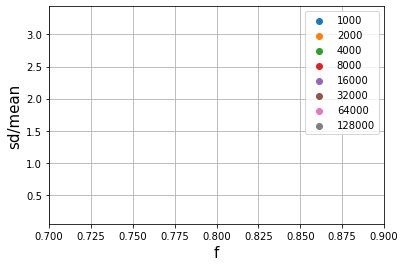

In [10]:
var_list = [1000,2000,4000,8000,16000,32000,64000,128000]

for var in var_list:
#     if var<60:
    fc = 0.8
    nu = 0.5
    mu = 0.125
    x = sds[sds[variable]==var]['f'].values
    y = sds[sds[variable]==var]['sd'].values/means[means[variable]==var]['mean'].values*var**mu
    xs = np.abs(x-fc)*var**nu
    
    plt.scatter(x,y, label =var)
    plt.plot(x[np.argsort(x)],y[np.argsort(x)])
plt.ylabel('sd/mean', fontsize='15')
plt.xlabel('f', fontsize='15')
# plt.yscale('log')
# plt.xscale('log')
plt.grid()
plt.legend()
plt.xlim(0.7,0.9)

plt.show()

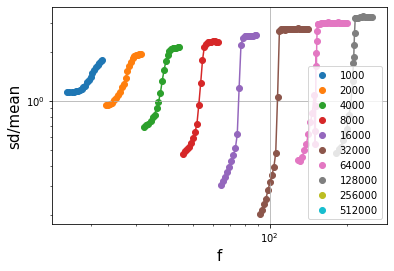

In [11]:
var_list = [1000,2000,4000,8000,16000,32000,64000,128000,256000,512000]

for var in var_list:
#     if var<60:
    fc = 0.8
    nu = 0.5
    mu = 0.125
    x = sds[sds[variable]==var]['f'].values
    y = sds[sds[variable]==var]['sd'].values/means[means[variable]==var]['mean'].values*var**mu
    xs = np.abs(x-fc)*var**nu
    
    plt.scatter(xs,y, label =var)
    plt.plot(xs[np.argsort(x)],y[np.argsort(x)])
plt.ylabel('sd/mean', fontsize='15')
plt.xlabel('f', fontsize='15')
plt.yscale('log')
plt.xscale('log')
plt.grid()
plt.legend()
# plt.xlim(window)

plt.show()

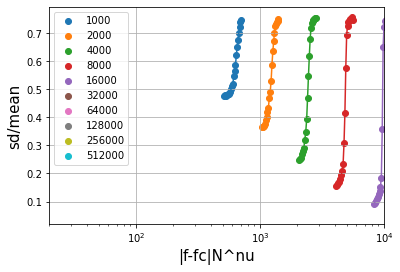

In [13]:
var_list = [1000,2000,4000,8000,16000,32000,64000,128000,256000,512000]
# var_list = [64000,128000,256000,512000]


for var in var_list:
    fc = 0.805
    nu = 1
    x = sds[sds[variable]==var]['f'].values
    y = sds[sds[variable]==var]['sd'].values/means[means[variable]==var]['mean'].values
    xs = np.abs(x-fc)*var**nu
    
    plt.scatter(xs,y, label =var)
    plt.plot(xs[np.argsort(x)],y[np.argsort(x)])
    
plt.ylabel('sd/mean', fontsize='15')
plt.xlabel('|f-fc|N^nu', fontsize='15')
plt.xscale('log')
plt.grid()
plt.legend()
plt.xlim(20,10000)

plt.show()

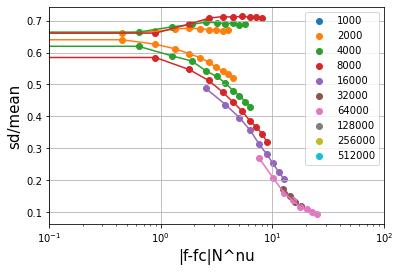

In [25]:
var_list = [1000,2000,4000,8000,16000,32000,64000,128000,256000,512000]
# var_list = [16000,32000,64000,128000,256000,512000]


for var in var_list:
    fc = 0.8
    nu = 0.5
    x = sds[sds[variable]==var]['f'].values
    y = sds[sds[variable]==var]['sd'].values/means[means[variable]==var]['mean'].values
    xs = np.abs(x-fc)*var**nu
    
    plt.scatter(xs,y, label =var)
    plt.plot(xs[np.argsort(x)],y[np.argsort(x)])
    
plt.ylabel('sd/mean', fontsize='15')
plt.xlabel('|f-fc|N^nu', fontsize='15')
plt.xscale('log')
plt.grid()
plt.legend()
plt.xlim(0.1,100)

plt.show()

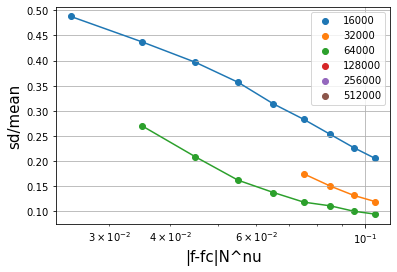

In [26]:
# var_list = [1000,2000,4000,8000,16000,32000,64000,128000,256000,512000]
var_list = [16000,32000,64000,128000,256000,512000]


for var in var_list:
    fc = 0.805
    nu = 0
    x = sds[sds[variable]==var]['f'].values
    y = sds[sds[variable]==var]['sd'].values/means[means[variable]==var]['mean'].values
    xs = np.abs(x-fc)*var**nu
    
    plt.scatter(xs,y, label =var)
    plt.plot(xs[np.argsort(x)],y[np.argsort(x)])
    
plt.ylabel('sd/mean', fontsize='15')
plt.xlabel('|f-fc|N^nu', fontsize='15')
plt.xscale('log')
plt.grid()
plt.legend()
# plt.xlim(20,10000)

plt.show()

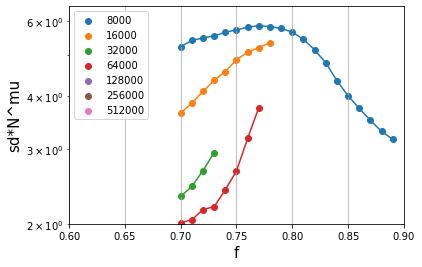

In [27]:
# var_list = [1000,2000,4000,8000,16000,32000,64000,128000,256000,512000]
# var_list = [16000,32000,64000,128000,256000,512000]
var_list = [8000,16000,32000,64000,128000,256000,512000]

for var in var_list:
    fc = 0.8
    nu = 0.5
    mu = 0.125
    x = sds[sds[variable]==var]['f'].values
    y = sds[sds[variable]==var]['sd'].values*var**mu
    xs = np.abs(x-fc)*var**nu
    
    plt.scatter(x,y, label =var)
    plt.plot(x[np.argsort(x)],y[np.argsort(x)])
    
#     plt.scatter(xs,y, label =var)
#     plt.plot(xs[np.argsort(x)],y[np.argsort(x)])
    
plt.ylabel('sd*N^mu', fontsize='15')
plt.xlabel('f', fontsize='15')
plt.yscale('log')
# plt.xscale('log')
plt.grid()
plt.legend()
plt.ylim(2,6.5)
plt.xlim(0.6,0.9)

plt.show()

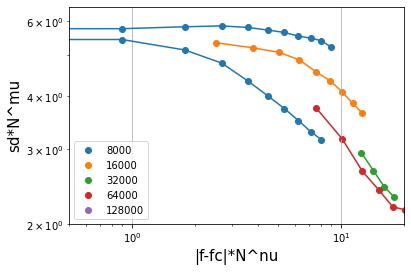

In [28]:
# var_list = [1000,2000,4000,8000,16000,32000,64000,128000,256000,512000]
# var_list = [16000,32000,64000,128000,256000,512000]
var_list = [8000,16000,32000,64000,128000]

for var in var_list:
    fc = 0.8
    nu = 0.5
    mu = 0.125
    x = sds[sds[variable]==var]['f'].values
    y = sds[sds[variable]==var]['sd'].values*var**mu
    xs = np.abs(x-fc)*var**nu
    
    plt.scatter(xs,y, label =var)
    plt.plot(xs[np.argsort(x)],y[np.argsort(x)])
    
#     plt.scatter(xs,y, label =var)
#     plt.plot(xs[np.argsort(x)],y[np.argsort(x)])
    
plt.ylabel('sd*N^mu', fontsize='15')
plt.xlabel('|f-fc|*N^nu', fontsize='15')
plt.yscale('log')
plt.xscale('log')
plt.grid()
plt.legend()
plt.ylim(2,6.5)
plt.xlim(0.5,20)

plt.show()

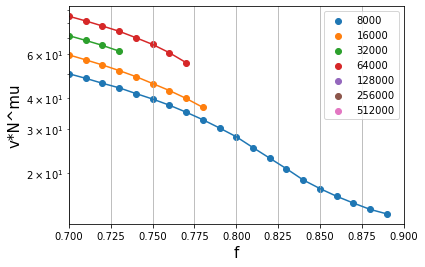

In [29]:
# var_list = [1000,2000,4000,8000,16000,32000,64000,128000,256000,512000]
# var_list = [16000,32000,64000,128000,256000,512000]
var_list = [8000,16000,32000,64000,128000,256000,512000]

for var in var_list:
    fc = 0.8
    nu = 0.5
    mu = 0.25
    x = means[means[variable]==var]['f'].values
    y = means[means[variable]==var]['mean'].values*var**mu
    xs = np.abs(x-fc)*var**nu
    
    plt.scatter(x,y, label =var)
    plt.plot(x[np.argsort(x)],y[np.argsort(x)])
    
#     plt.scatter(xs,y, label =var)
#     plt.plot(xs[np.argsort(x)],y[np.argsort(x)])
    
plt.ylabel('v*N^mu', fontsize='15')
plt.xlabel('f', fontsize='15')
plt.yscale('log')
# plt.xscale('log')
plt.grid()
plt.legend()
# plt.ylim(2,6.5)
plt.xlim(0.7,0.9)

plt.show()

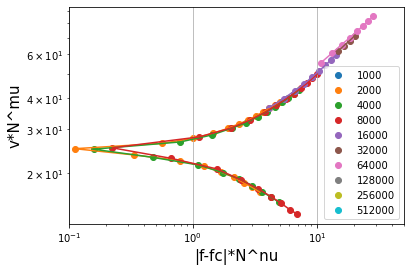

In [30]:
var_list = [1000,2000,4000,8000,16000,32000,64000,128000,256000,512000]
# var_list = [16000,32000,64000,128000,256000,512000]
# var_list = [8000,16000,32000,64000,128000]

for var in var_list:
    fc = 0.8125
    nu = 0.5
    mu = 0.25
    x = means[means[variable]==var]['f'].values
    y = means[means[variable]==var]['mean'].values*var**mu
    xs = np.abs(x-fc)*var**nu
    
    plt.scatter(xs,y, label =var)
    plt.plot(xs[np.argsort(x)],y[np.argsort(x)])
    
#     plt.scatter(xs,y, label =var)
#     plt.plot(xs[np.argsort(x)],y[np.argsort(x)])
    
plt.ylabel('v*N^mu', fontsize='15')
plt.xlabel('|f-fc|*N^nu', fontsize='15')
plt.yscale('log')
plt.xscale('log')
plt.grid()
plt.legend()
# plt.ylim(2,6.5)
plt.xlim(0.1,50)

plt.show()

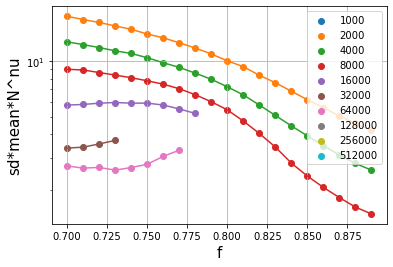

In [31]:
var_list = [1000,2000,4000,8000,16000,32000,64000,128000,256000,512000]
# var_list = [64000,128000,256000,512000]


for var in var_list:
    fc = 0.805
    nu = 0
    x = sds[sds[variable]==var]['f'].values
    y = sds[sds[variable]==var]['sd'].values*means[means[variable]==var]['mean'].values*var**nu
#     xs = np.abs(x-fc)*var**nu
    
    plt.scatter(x,y, label =var)
    plt.plot(x[np.argsort(x)],y[np.argsort(x)])
    
#     plt.scatter(xs,y, label =var)
#     plt.plot(xs[np.argsort(x)],y[np.argsort(x)])
    
plt.ylabel('sd*mean*N^nu', fontsize='15')
plt.xlabel('f', fontsize='15')
plt.yscale('log')
plt.grid()
plt.legend()
# plt.xlim(0.01,0.2)

plt.show()

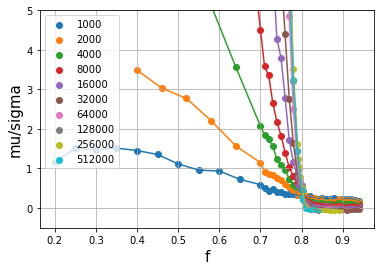

In [15]:
var_list = [1000,2000,4000,8000,16000,32000,64000,128000,256000,512000]
# var_list = [64000,128000,256000,512000]


for var in var_list:
    fc = 0.805
    nu = 0
    x = sds[sds[variable]==var]['f'].values
    y = sds[sds[variable]==var]['sd'].values/means[means[variable]==var]['mean'].values
    ys = (np.pi-2)/(2*y**2)-1
#     xs = np.abs(x-fc)*var**nu
    
    plt.scatter(x,ys, label =var)
    plt.plot(x[np.argsort(x)],ys[np.argsort(x)])
    
#     plt.scatter(xs,y, label =var)
#     plt.plot(xs[np.argsort(x)],y[np.argsort(x)])
    
plt.ylabel('mu/sigma', fontsize='15')
plt.xlabel('f', fontsize='15')
# plt.yscale('log')
plt.grid()
plt.legend()
plt.ylim(-0.5,5)

plt.show()

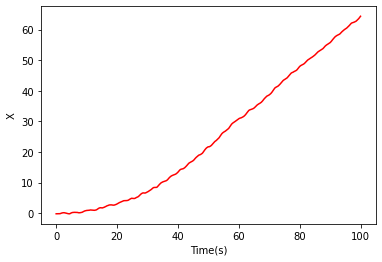

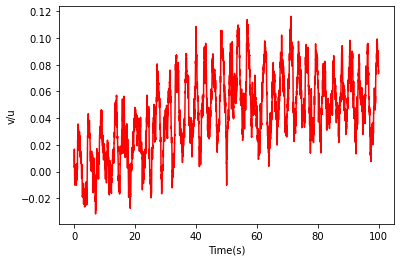

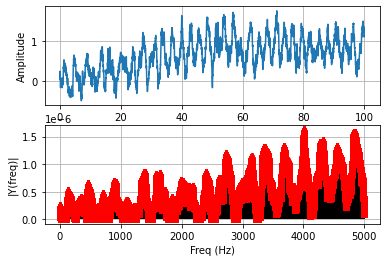

In [7]:
path_dir = os.getcwd()+'/data/'


Fs=10000
dt = 1/Fs



state = path_dir+'over1.npz'
load = np.load(state)
        
n = len(load['v'])


# Plot the position
plt.plot(np.arange(n)*dt, load['X'], 'r-')
plt.xlabel('Time(s)')
plt.ylabel('X')
#plt.xlim([0,1])
plt.show()

# Plot the graph of velocity
plt.plot(np.arange(n)*dt, load['v']/15, 'r-')
plt.xlabel('Time(s)')
plt.ylabel('v/u')
# plt.xlim([0.05,2])
plt.show()


y = load['v']

N = len(y) 				# length of the signal
k = np.arange(N)
T = dt*n
t = np.linspace(0,T,N)
freq = k/T 					# two sides frequency range
freq = freq[range(int(N/2))] 			# one side frequency range

Y = np.fft.fft(y)/N 				# fft computing and normalization
Y = Y[range(int(N/2))]

fig, ax = plt.subplots(2, 1)
ax[0].plot(t, y)
ax[0].set_xlabel('Time')
ax[0].set_ylabel('Amplitude')
ax[0].grid(True)
ax[1].plot(freq, abs(Y), 'r', linestyle=' ', marker='^') 
ax[1].set_xlabel('Freq (Hz)')
ax[1].set_ylabel('|Y(freq)|')
ax[1].vlines(freq, [0], abs(Y))
ax[1].grid(True)
plt.show()



In [10]:
N_list = [2000,4000,8000,16000,32000,64000,128000,256000]
# N_list = [16000,32000,64000,128000,256000]

L_list = [40,60,80,100,120,240,480,960]
rho_list = [0.3125,0.625,1.25,2.5,5,10,20,40,80,160]
path_dir = os.getcwd()+'/data/1218/'
Fs=10000
dt = 1/Fs

In [19]:
# density_list = [] 
mean_list=[]
kurt_list=[]
skew_list=[]
sd_list=[]
binder_list=[]
bimodal_list = []


binning = np.linspace(-2,2,200)
#binning = np.linspace(0,25000,200)

f_axis = np.linspace(0.01,1,99)

measure = 'v'
variable = 'N'

if variable=='N':
    var_list = N_list
elif variable=='L':
    var_list = L_list
elif variable=='rho':
    var_list= rho_list

for var in var_list:
    file_list=(os.listdir(path_dir+variable+'/'+str(var)+'/'))
    
#     density_list=[]
    
    for file in file_list:
        state = path_dir+variable+'/'+str(var)+'/'+file
        load = np.load(state)
        f = float(file[:-4])

#         density = plt.hist(load[measure].flatten()/15,bins = binning, density = True)


        data = load[measure][1000:]
#         data = np.average(data.reshape(-1,100),axis=1)
        data = np.abs(data)

        mean = np.average(data)
#         mean_save = np.average(np.abs(data))
        sd = np.sqrt(np.average((data-mean)**2))
        skew = np.average(((data-mean)/sd)**3)
        kurt = np.average(((data-mean)/sd)**4)


        binder = 1-np.average(data**4)/(3*np.average(data**2)**2)
        bimodal = (skew**2+1)/kurt

#     #     plt.yscale('log')
#     #     plt.show()

#         density_list.append(pd.DataFrame({'f':f*np.ones(199),measure:binning[:-1]/2+binning[1:]/2,'density':density[0]}))
        mean_list.append(pd.DataFrame({variable:[var],'f':[f],'mean':[np.abs(mean)]}))
        kurt_list.append(pd.DataFrame({variable:[var],'f':[f],'kurt':[kurt]}))
        skew_list.append(pd.DataFrame({variable:[var],'f':[f],'skew':[np.abs(skew)]}))

        sd_list.append(pd.DataFrame({variable:[var],'f':[f],'sd':[sd]}))
        binder_list.append(pd.DataFrame({variable:[var],'f':[f],'binder':[binder]}))
        bimodal_list.append(pd.DataFrame({variable:[var],'f':[f],'bimodal':[bimodal]}))

#     htmap = pd.concat(density_list)
    
#     df = htmap.pivot('f',measure,'density')
#     #sbn.heatmap(df)
#     dff = df.to_numpy()
#     dfa = (dff+np.flip(dff,axis=1))/2
# #     dfa=dff
    
#     plt.rcParams["figure.figsize"] = (10,8)
#     # plt.pcolor(dfa, norm=mpl.colors.LogNorm())
#     plt.pcolor(dfa)
#     xmin = df.columns[0]
#     xmax = df.columns[-1]
#     plt.xticks(np.arange(0.5, len(df.columns), 49.5), np.array(np.round(np.linspace(xmin,xmax,5),2)),fontsize=20)

#     plt.yticks(np.arange(0.5, len(df.index), 9.9), np.round(np.linspace(0,10,101),1),fontsize=20)

#     #plt.title('Heatmap by plt.pcolor()', fontsize=20)

#     plt.xlabel(measure, fontsize=30)

#     plt.ylabel('f', fontsize=30)

#     plt.colorbar()



#     plt.show()

    
    
 

In [20]:
   
# htmap
means = pd.concat(mean_list)
sds = pd.concat(sd_list)
binders = pd.concat(binder_list)
bimodals = pd.concat(bimodal_list)

kurts = pd.concat(kurt_list)
skews = pd.concat(skew_list)


# second_map = pd.concat(second_list)
                       
# binder_map = pd.concat(binder_list)

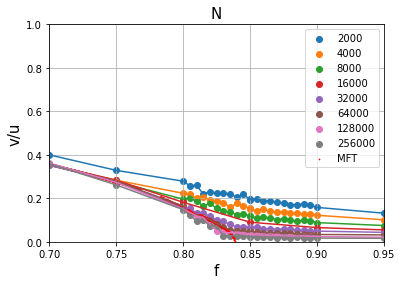

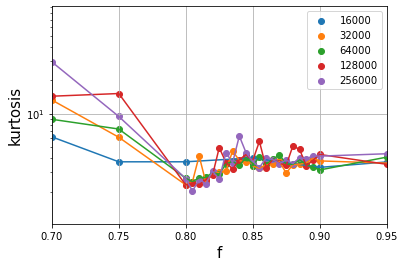

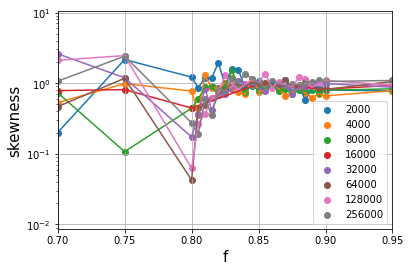

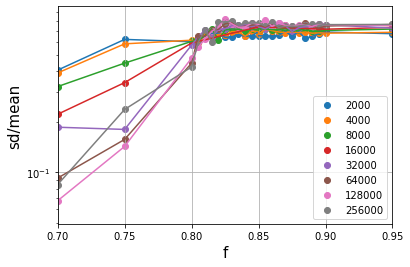

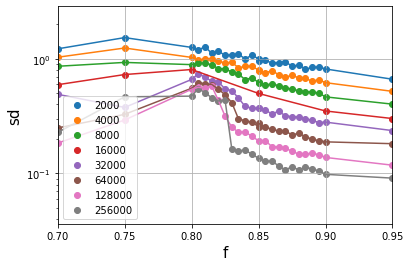

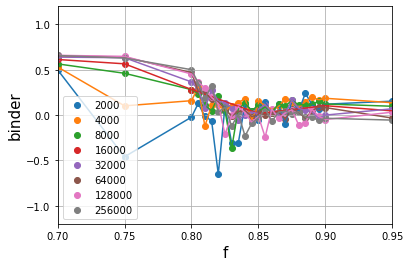

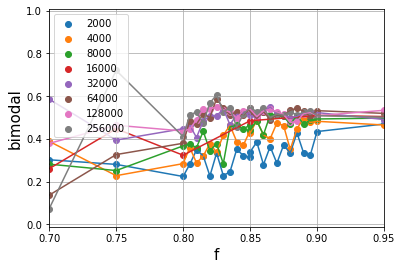

In [30]:
window = (0.7,0.95)
# window = (0.1,0.3)
# window=(0,1)
for var in var_list:
#     if var<60:
    plt.scatter(means[means[variable]==var]['f'].values,means[means[variable]==var]['mean'].values/7.5, label =var)
#     plt.errorbar(means[means[variable]==var].sort_values(by=['f'],axis=0)['f'].values,means[means[variable]==var].sort_values(by=['f'],axis=0)['mean'].values/7.5,yerr=sds[sds[variable]==var].sort_values(by=['f'],axis=0)['sd'].values/15,uplims=True, lolims=True)
    plt.plot(means[means[variable]==var].sort_values(by=['f'],axis=0)['f'].values,means[means[variable]==var].sort_values(by=['f'],axis=0)['mean'].values/7.5)
    
plt.ylabel('v/u', fontsize='15')
plt.xlabel('f', fontsize='15')
plt.grid()
plt.title(variable, fontsize='15')
plt.ylim(0,1)
plt.scatter(analytics['f'],analytics['velocity'],s=0.5,color='r', label='MFT')
plt.legend()
plt.xlim(window)

plt.show()
 
for var in var_list:
    if var>8000:
        plt.scatter(kurts[kurts[variable]==var]['f'].values,kurts[kurts[variable]==var]['kurt'].values, label = var)
        plt.plot(kurts[kurts[variable]==var].sort_values(by=['f'],axis=0)['f'].values,kurts[kurts[variable]==var].sort_values(by=['f'],axis=0)['kurt'].values)

    
plt.ylabel('kurtosis', fontsize='15')
plt.xlabel('f', fontsize='15')
plt.yscale('log')
plt.grid()
plt.legend()
plt.xlim(window)

plt.show()


for var in var_list:
#     if var<60:
    plt.scatter(skews[skews[variable]==var]['f'].values,skews[skews[variable]==var]['skew'].values, label = var)
    plt.plot(skews[skews[variable]==var].sort_values(by=['f'],axis=0)['f'].values,np.abs(skews[skews[variable]==var].sort_values(by=['f'],axis=0)['skew'].values))

    
plt.ylabel('skewness', fontsize='15')
plt.xlabel('f', fontsize='15')
plt.yscale('log')
plt.grid()
plt.legend()
plt.xlim(window)

plt.show()

for var in var_list:
#     if var<60:
    plt.scatter(sds[sds[variable]==var]['f'].values,sds[sds[variable]==var]['sd'].values/means[means[variable]==var]['mean'].values, label = var)
    plt.plot(sds[sds[variable]==var].sort_values(by=['f'],axis=0)['f'].values,sds[sds[variable]==var].sort_values(by=['f'],axis=0)['sd'].values/means[means[variable]==var].sort_values(by=['f'],axis=0)['mean'].values)
    
plt.ylabel('sd/mean', fontsize='15')
plt.xlabel('f', fontsize='15')
plt.yscale('log')
plt.grid()
plt.legend()
plt.xlim(window)

plt.show()



for var in var_list:
#     if var<60:
    plt.scatter(sds[sds[variable]==var]['f'].values,sds[sds[variable]==var]['sd'].values, label = var)
    plt.plot(sds[sds[variable]==var].sort_values(by=['f'],axis=0)['f'].values,sds[sds[variable]==var].sort_values(by=['f'],axis=0)['sd'].values)

plt.ylabel('sd', fontsize='15')
plt.xlabel('f', fontsize='15')
plt.yscale('log')
plt.grid()
plt.legend()
plt.xlim(window)

plt.show()



for var in var_list:
#     if var<60:
    plt.scatter(binders[binders[variable]==var]['f'].values,binders[binders[variable]==var]['binder'].values, label =var)
    plt.plot(binders[binders[variable]==var].sort_values(by=['f'],axis=0)['f'].values,binders[binders[variable]==var].sort_values(by=['f'],axis=0)['binder'].values)
    
plt.ylabel('binder', fontsize='15')
plt.xlabel('f', fontsize='15')
plt.legend()
plt.grid()
plt.ylim(-1.2,1.2)
plt.xlim(window)

plt.show()

for var in var_list:
#     if var<60:
    plt.scatter(bimodals[bimodals[variable]==var]['f'].values,bimodals[bimodals[variable]==var]['bimodal'].values, label = var)
    plt.plot(bimodals[bimodals[variable]==var].sort_values(by=['f'],axis=0)['f'].values,bimodals[bimodals[variable]==var].sort_values(by=['f'],axis=0)['bimodal'].values)

    
plt.ylabel('bimodal', fontsize='15')
plt.xlabel('f', fontsize='15')
plt.legend()
plt.grid()
plt.xlim(window)

plt.show()

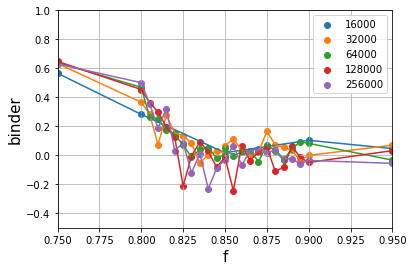

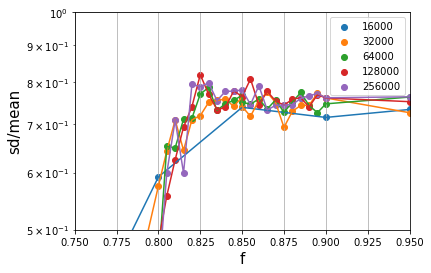

In [29]:
window = (0.75,0.95)
# window = (0.1,0.3)
# window=(0,1)
for var in var_list:
    if var>8000:
#         if var<100000:
        plt.scatter(binders[binders[variable]==var]['f'].values,binders[binders[variable]==var]['binder'].values, label =var)
        plt.plot(binders[binders[variable]==var].sort_values(by=['f'],axis=0)['f'].values,binders[binders[variable]==var].sort_values(by=['f'],axis=0)['binder'].values)
    
plt.ylabel('binder', fontsize='15')
plt.xlabel('f', fontsize='15')
plt.legend()
plt.grid()
plt.ylim(-0.5,1)
plt.xlim(window)

plt.show()


for var in var_list:
    if var>8000:
        plt.scatter(sds[sds[variable]==var]['f'].values,sds[sds[variable]==var]['sd'].values/means[means[variable]==var]['mean'].values, label = var)
        plt.plot(sds[sds[variable]==var].sort_values(by=['f'],axis=0)['f'].values,sds[sds[variable]==var].sort_values(by=['f'],axis=0)['sd'].values/means[means[variable]==var].sort_values(by=['f'],axis=0)['mean'].values)
    
plt.ylabel('sd/mean', fontsize='15')
plt.xlabel('f', fontsize='15')
plt.yscale('log')
plt.grid()
plt.legend()
plt.ylim(0.5,1)
plt.xlim(window)

plt.show()

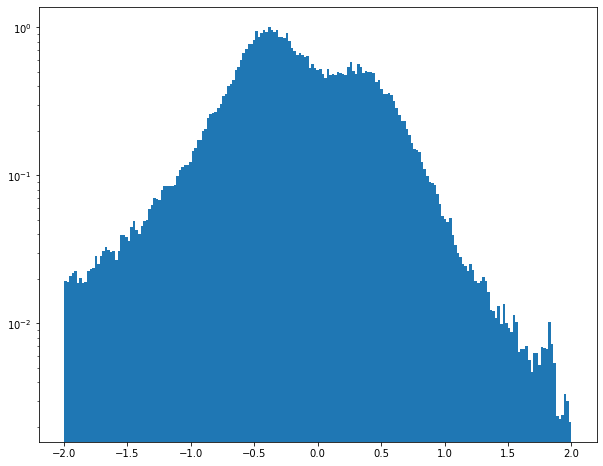

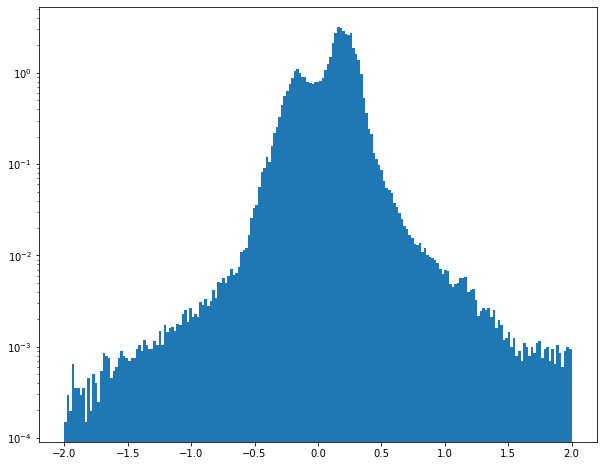

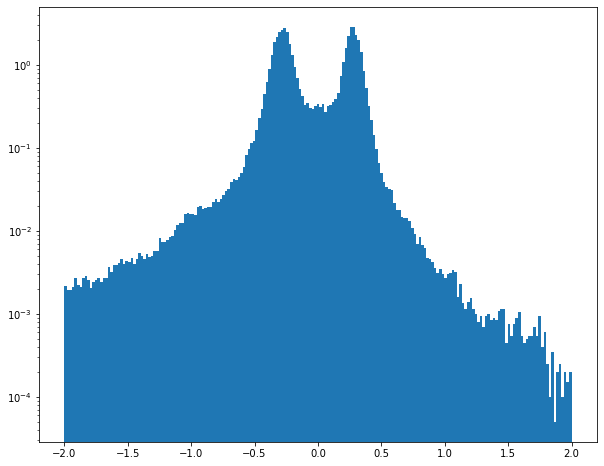

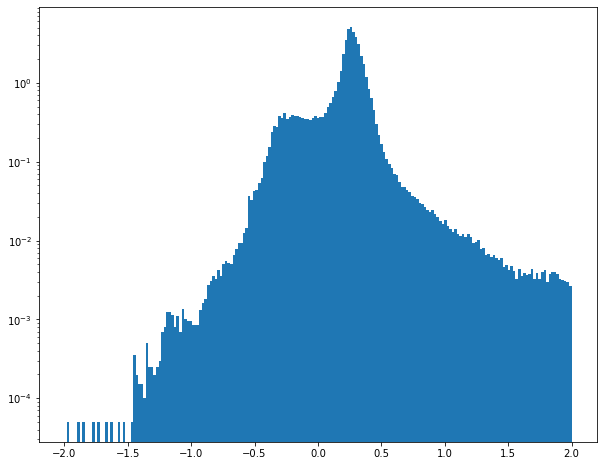

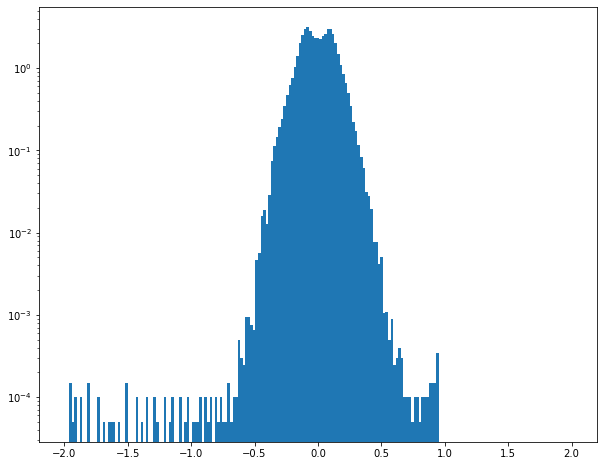

...

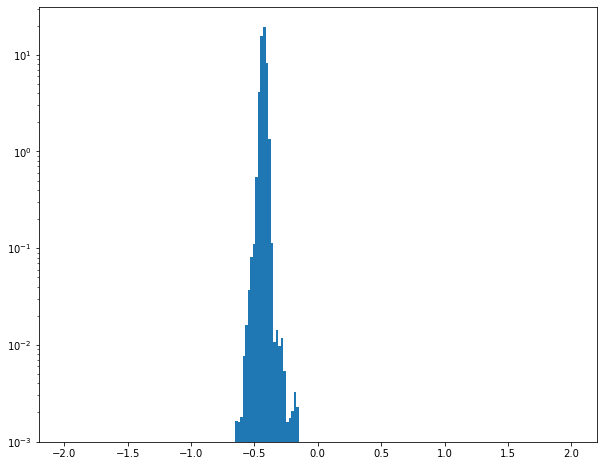

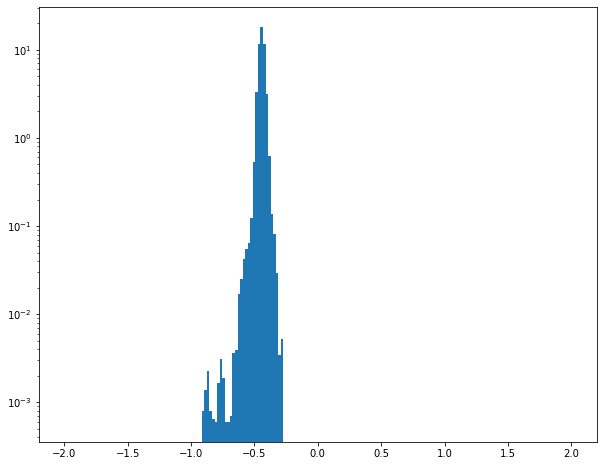

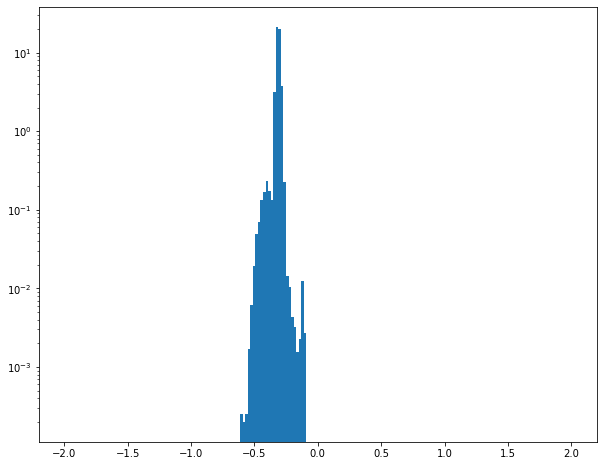

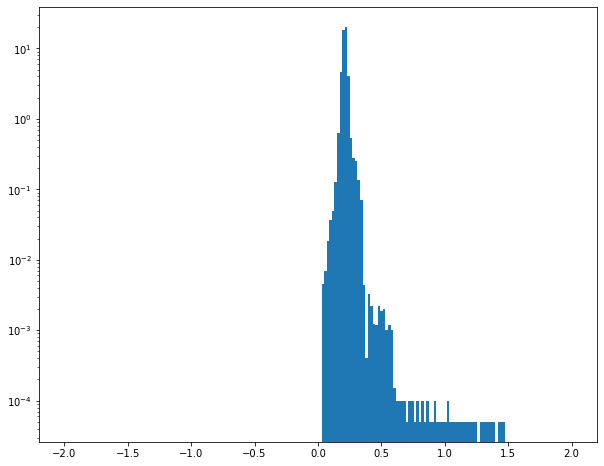

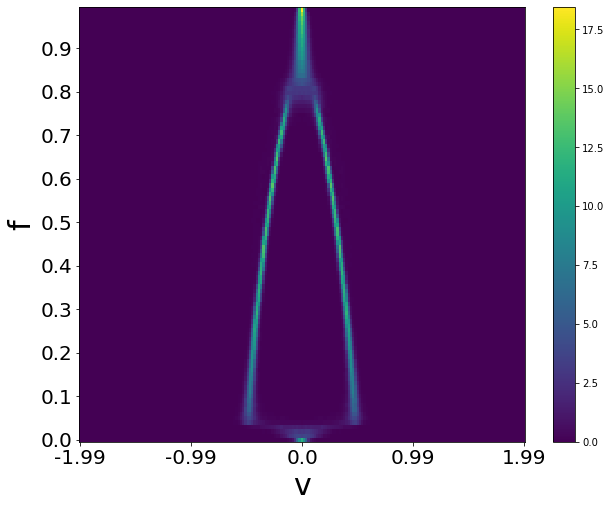

In [9]:
density_list = [] 
mean_list=[]
sd_list=[]
binder_list=[]
bimodal_list = []


binning = np.linspace(-2,2,200)
#binning = np.linspace(0,25000,200)

f_axis = np.linspace(0.01,1,99)

measure = 'v'
variable = 'N'

if variable=='N':
    var_list = N_list
elif variable=='L':
    var_list = L_list
elif variable=='rho':
    var_list= rho_list

for var in var_list:
    file_list=(os.listdir(path_dir+variable+'/'+str(var)+'/'))
    
    density_list=[]
    
    for file in file_list:
        state = path_dir+variable+'/'+str(var)+'/'+file
        load = np.load(state)
        f = float(file[:-4])

        density = plt.hist(load[measure].flatten()/15,bins = binning, density = True)
        plt.yscale('log')
        plt.show()

        data = load[measure][1000:]
#         data = np.average(data.reshape(-1,100),axis=1)
        data = np.abs(data)

        mean = np.average(data)
#         mean_save = np.average(np.abs(data))
        sd = np.sqrt(np.average((data-mean)**2))
        skew = np.average(((data-mean)/sd)**3)
        kurt = np.average(((data-mean)/sd)**4)


        binder = 1-np.average(data**4)/(3*np.average(data**2)**2)
        bimodal = (skew**2+1)/kurt

#     #     plt.yscale('log')
#     #     plt.show()

        density_list.append(pd.DataFrame({'f':f*np.ones(199),measure:binning[:-1]/2+binning[1:]/2,'density':density[0]}))
        mean_list.append(pd.DataFrame({variable:[var],'f':[f],'mean':[mean]}))
        sd_list.append(pd.DataFrame({variable:[var],'f':[f],'sd':[sd]}))
        binder_list.append(pd.DataFrame({variable:[var],'f':[f],'binder':[binder]}))
        bimodal_list.append(pd.DataFrame({variable:[var],'f':[f],'bimodal':[bimodal]}))

    htmap = pd.concat(density_list)
    
    df = htmap.pivot('f',measure,'density')
    #sbn.heatmap(df)
    dff = df.to_numpy()
    dfa = (dff+np.flip(dff,axis=1))/2
#     dfa=dff
    
    plt.rcParams["figure.figsize"] = (10,8)
    # plt.pcolor(dfa, norm=mpl.colors.LogNorm())
    plt.pcolor(dfa)
    xmin = df.columns[0]
    xmax = df.columns[-1]
    plt.xticks(np.arange(0.5, len(df.columns), 49.5), np.array(np.round(np.linspace(xmin,xmax,5),2)),fontsize=20)

    plt.yticks(np.arange(0.5, len(df.index), 9.9), np.round(np.linspace(0,10,101),1),fontsize=20)

    #plt.title('Heatmap by plt.pcolor()', fontsize=20)

    plt.xlabel(measure, fontsize=30)

    plt.ylabel('f', fontsize=30)

    plt.colorbar()



    plt.show()

    
    
    
# htmap
means = pd.concat(mean_list)
sds = pd.concat(sd_list)
binders = pd.concat(binder_list)
bimodals = pd.concat(bimodal_list)


# second_map = pd.concat(second_list)
                       
# binder_map = pd.concat(binder_list)